In [1]:
# system
from pathlib import Path
from tqdm import tqdm
import pickle

# analysis
import numpy as np
import pandas as pd
import pynapple as nap
from scipy import stats
import glob 
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
import warnings
import os


import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm
import patsy
from scipy.stats import pearsonr
from matplotlib.collections import LineCollection
from scipy.spatial.distance import pdist, squareform

from umap import UMAP
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.decomposition import PCA
import pickle
import os
from collections import defaultdict

# Here we repeat the imports and instantiate ONE, so this cell can also be run stand-alone
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.ndimage

from iblutil.numerical import bincount2D
from iblatlas.atlas import BrainRegions
from one.api import ONE
from brainbox.io.one import SpikeSortingLoader, SessionLoader
from ibl_style.style import figure_style

# set the IBL style for figures
# from ibl_style.style import figure_style
# figure_style()
from reproducible_ephys_functions import get_insertions
from functions import idxs_from_files
from one.api import ONE
one= ONE()

In [2]:
prefix = '/home/ines/repositories/'
prefix = '/Users/ineslaranjeira/Documents/Repositories/'

# Load data

In [3]:
insertions = get_insertions(level=0, one=one, freeze='freeze_2024_03')
repro_ephys_insertions = pd.DataFrame.from_dict(insertions)

In [4]:
repro_eid = repro_ephys_insertions['probe_insertion']

In [5]:
import brainwidemap
# this dataframe holds a summary of all the sessions
# and for us importantly, the eids and pids
bwm_df = brainwidemap.bwm_query()  # each row of this dataframe is a recording

n_sessions = bwm_df["eid"].unique().shape[0]
n_insertions = bwm_df["pid"].unique().shape[0]
print(
    f"{n_sessions} sessions with {n_insertions} individual neuropixel recordings"
)
# bwm_df.head()

Loading bwm_query results from fixtures/2023_12_bwm_release.csv
459 sessions with 699 individual neuropixel recordings


In [6]:
bwm_pid = bwm_df['pid'].unique()

## Getting units from the brainwide map

In [7]:
units_df = brainwidemap.bwm_units(one)
n_units = units_df.shape[0]
print(f"{n_units} units present in the table")
# units_df.head()

Loading bwm_query results from fixtures/2023_12_bwm_release.csv
d16d0b38d392b18c0ce8b615ec89d60d7c901df2eeb3432986b62130af28ef01
62990 units present in the table


## LDA axis

In [8]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')

# lda = pd.read_pickle(data_path+'mouse_LDA_3_bins_cut')
# lda = pd.read_pickle(data_path+'mouse_LDA_quadrants')
# lda = pd.read_pickle(data_path+'reaction_PLS_5_bins')
lda_eid = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session']
lda_pid = bwm_df.loc[bwm_df['eid'].isin(lda_eid), 'pid']

In [9]:
use_eid = lda_pid
# use_eid = repro_eid
# use_eid = bwm_pid

In [10]:
len(use_eid)

382

In [11]:
repro_units = units_df.loc[units_df['pid'].isin(list(use_eid))]

## Querying and loading the data

Then we will query the brain region ACA. ACA has many sub-regions, and we need to get the list of neurons belinging to any of the sub-regions.

In [12]:
BRAIN_REGIONS = ['PPC', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions

regions = BrainRegions()
aca_leaf_nodes = regions.descendants(regions.acronym2id(BRAIN_REGIONS))
# print(f"List of regions to query: \n {aca_leaf_nodes['acronym']}")
BRAIN_REGIONS = repro_units['Beryl'].unique()  # All available in the session query

# Individual sessions

In [13]:
save_states_path = prefix + 'representation_learning_variability/paper-individuality/data/neuron_files/'
save_states_path = '/Users/ineslaranjeira/Google Drive/O meu disco/CCU/PhD Project/paper-individuality/data/neuron_files/'

filepaths = [os.path.join(save_states_path, filename) for filename in os.listdir(save_states_path)]
print(len(filepaths))

419


# Extract for RSA

In [14]:
def get_epoch_data(df, col_name, events, pre=.5, post=1):
    all_trials = []
    for event in events:
        # Define window
        start = event - pre
        end = event + post
        # Extract data for all columns ending in '_spike_std'
        window = df.loc[(df['Bin'] >= start) & (df['Bin'] < end), col_name]
        if len(window) == int((pre + post) * 60):  # Assuming 60 Hz sampling rate
            all_trials.append(window.values)
            
    return np.array(all_trials)

In [ ]:
from collections import defaultdict
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']
BRAIN_REGIONS = ['VISa/am', 'CA1', 'DG', 'LP', 'PO']

MIN_FIRING_RATE = 2.0
counter = 0
rsa_records = []

for filepath in filepaths:
    try:
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
        pid = list(state_with_spikes['session_pid'])[0]
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]

        # Get areas of interest
        spike_columns = [col for col in new_df.columns if '_spike_count' in col]
        area_names = np.unique([col.split('_neuron_')[0] for col in spike_columns])
        allen_ids = regions.acronym2id(area_names)
        beryl_ids = regions.remap(allen_ids, source_map='Allen', target_map='Beryl')
        beryl_areas = regions.id2acronym(beryl_ids)
        area_to_beryl = dict(zip(area_names, beryl_areas))

        region_cols = defaultdict(list)
        for col in spike_columns:
            area = col.split('_neuron_')[0]
            beryl = area_to_beryl.get(area)
            if beryl in ('VISa', 'VISam'):
                beryl = 'VISa/am'
            if beryl in BRAIN_REGIONS:
                region_cols[beryl].append(col)

        if not region_cols:
            print(f"No relevant brain regions found in {pid}, skipping")
            continue

        # Build trial info with conditions
        trial_info = new_df.groupby('goCueTrigger_times').agg({
            'correct': 'first',
            'choice': 'first',
            'block': 'first',
            'response': 'first'
        }).reset_index()

        # Create readable trial type labels
        trial_info['correct_lbl'] = trial_info['correct'].map({1: 'Correct', 0: 'Error'})
        trial_info['choice_lbl'] = trial_info['choice'].map({'left': 'Left', 'right': 'Right'})
        # trial_info['block_lbl'] = trial_info['block'].apply(lambda x: 'BlockL' if x > 0.5 else 'BlockR')
        trial_info['block_lbl'] = trial_info['block'].apply(lambda x: 'BlockL' if x > 0.5 else ('BlockR' if x < 0.5 else np.nan))
        trial_info['trial_type'] = (trial_info['correct_lbl'] + '_' +
                                     trial_info['choice_lbl'] + '_' +
                                     trial_info['block_lbl'])
        trial_info['choice_time'] = trial_info['goCueTrigger_times'] + trial_info['response']

        for region, cols in region_cols.items():
            # Filter low-firing neurons
            bin_size = np.diff(new_df['Bin'].values[:2])[0]
            mean_rates = np.array([new_df[col].mean() / bin_size for col in cols])
            active_mask = mean_rates >= MIN_FIRING_RATE
            cols = [c for c, keep in zip(cols, active_mask) if keep]
            if len(cols) == 0:
                print(f"  {region}: no neurons above {MIN_FIRING_RATE} Hz, skipping")
                continue

            print(f"  {region}: {active_mask.sum()}/{len(active_mask)} neurons above {MIN_FIRING_RATE} Hz")

            condition_vectors = []
            condition_labels = []

            for trial_type, tt_df in trial_info.groupby('trial_type'):
                tt_stim_events = tt_df['goCueTrigger_times'].values
                tt_choice_events = tt_df['choice_time'].values

                if len(tt_stim_events) < 5:
                    continue

                # Pre stim
                pre_stim = [get_epoch_data(new_df, col, tt_stim_events, pre=.2, post=0) for col in cols]
                pre_stim = np.stack(pre_stim, axis=-1)
                pre_stim_avg = pre_stim.mean(axis=(0, 1))

                # Pre choice
                pre_choice = [get_epoch_data(new_df, col, tt_choice_events, pre=.2, post=0) for col in cols]
                pre_choice = np.stack(pre_choice, axis=-1)
                pre_choice_avg = pre_choice.mean(axis=(0, 1))

                # Post choice
                post_choice = [get_epoch_data(new_df, col, tt_choice_events, pre=0, post=0.2) for col in cols]
                post_choice = np.stack(post_choice, axis=-1)
                post_choice_avg = post_choice.mean(axis=(0, 1))

                condition_vectors.extend([pre_stim_avg, pre_choice_avg, post_choice_avg])
                condition_labels.extend([
                    f'{trial_type} | PreStim',
                    f'{trial_type} | PreChoice',
                    f'{trial_type} | PostChoice'
                ])

            if len(condition_vectors) < 5:
                continue

            # Stack → (n_conditions, Neurons) and compute distances
            cond_matrix = np.stack(condition_vectors, axis=0)
            dist_mat = squareform(pdist(cond_matrix, metric='euclidean'))

            # Save each condition vector as a row in the records
            for label, vec in zip(condition_labels, condition_vectors):
                trial_type_part, epoch_part = label.split(' | ')
                correct, choice, block = trial_type_part.split('_')
                rsa_records.append({
                    'session': session_name,
                    'pid': pid,
                    'region': region,
                    'n_neurons': len(cols),
                    'trial_type': trial_type_part,
                    'correct': correct,
                    'choice': choice,
                    'block': block,
                    'epoch': epoch_part,
                    'neuron_vector': vec,  # (Neurons,) array
                })
            
            # # Plot
            # n_conds = len(condition_labels)
            # fig, ax = plt.subplots(figsize=(10, 9))
            # im = ax.imshow(dist_mat, cmap='viridis', aspect='equal')
            # ax.set_xticks(range(n_conds))
            # ax.set_xticklabels(condition_labels, rotation=90, fontsize=7)
            # ax.set_yticks(range(n_conds))
            # ax.set_yticklabels(condition_labels, fontsize=7)
            # ax.set_title(f'{region} ({len(cols)} neurons) — Condition × Epoch RDM\n{session_name}')
            # fig.colorbar(im, ax=ax, label='Euclidean distance')
            # plt.tight_layout()
            # plt.show()

        counter = counter + 1
        print(pid, counter)
    except Exception as e:
        print(f"Error: {e}")

No relevant brain regions found in b1455ca8-3999-4eb8-9e1e-5c8d0d2e5719, skipping
No relevant brain regions found in c64201ea-262e-45fe-8f41-5a074780cd59, skipping
  LP: 33/44 neurons above 2.0 Hz
  DG: 6/6 neurons above 2.0 Hz
  CA1: no neurons above 2.0 Hz, skipping
  VISa/am: 2/2 neurons above 2.0 Hz
143dd7cf-6a47-47a1-906d-927ad7fe9117 1
No relevant brain regions found in 57acb640-4f64-4a89-bedf-69351a3aea75, skipping
  PO: 71/77 neurons above 2.0 Hz
  LP: 21/24 neurons above 2.0 Hz
  DG: 2/2 neurons above 2.0 Hz
  CA1: 11/12 neurons above 2.0 Hz
44fc463b-405f-4048-9242-ac018b9f50f7 2
No relevant brain regions found in 335d689e-4d98-4532-b01b-7f7da89863c4, skipping
No relevant brain regions found in 11f70c37-a546-439a-9fb7-da6b6ebfb0cb, skipping
No relevant brain regions found in a6f9e4d5-5f20-4a98-9118-22187f4d230b, skipping
No relevant brain regions found in ae03524f-e493-4077-99b1-588244de9a98, skipping
No relevant brain regions found in 72c095b0-c7ab-4e22-a4aa-4163102de553, ski

### Save data

In [ ]:
rsa_df = pd.DataFrame(rsa_records)

In [21]:
rsa_df.to_parquet(prefix + 'representation_learning_variability/paper-individuality/4_mice/neural_rsa_results.pqt')

Session 44fc463b-405f-4048-9242-ac018b9f50f7: 24 / 24 trial types


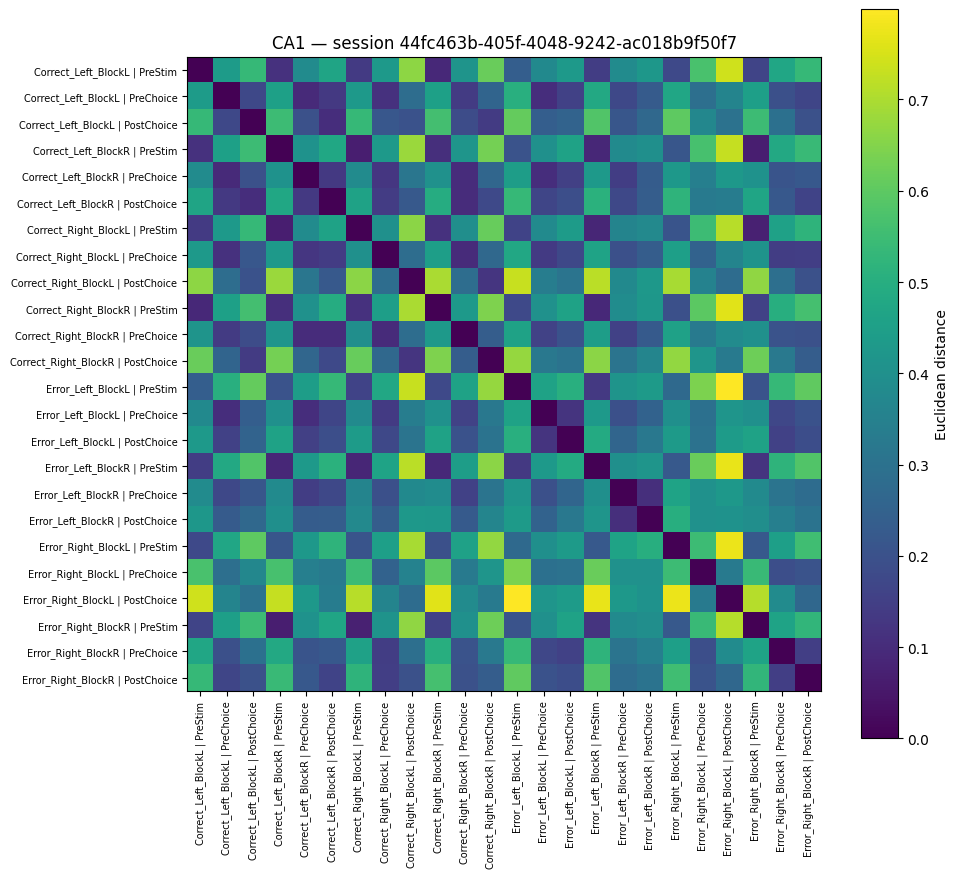

Session 02cc03e4-8015-4050-bb42-6c832091febb: 24 / 24 trial types


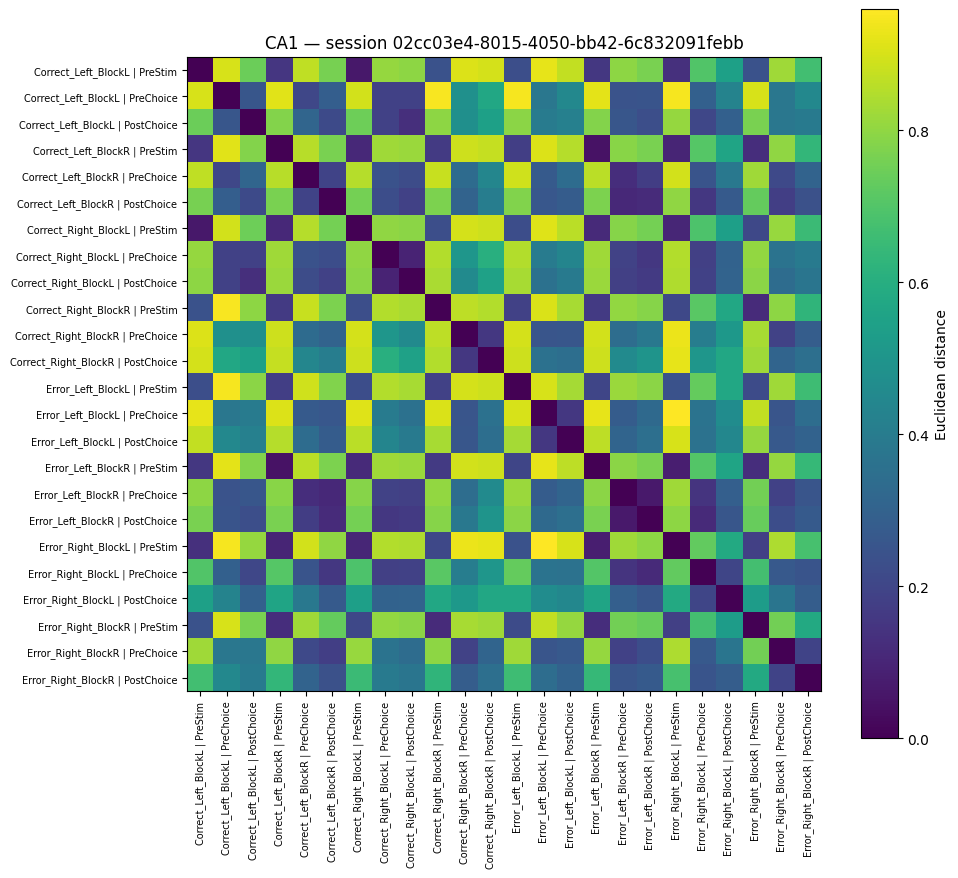

Session c2363000-27a6-461e-940b-15f681496ed8: 24 / 24 trial types


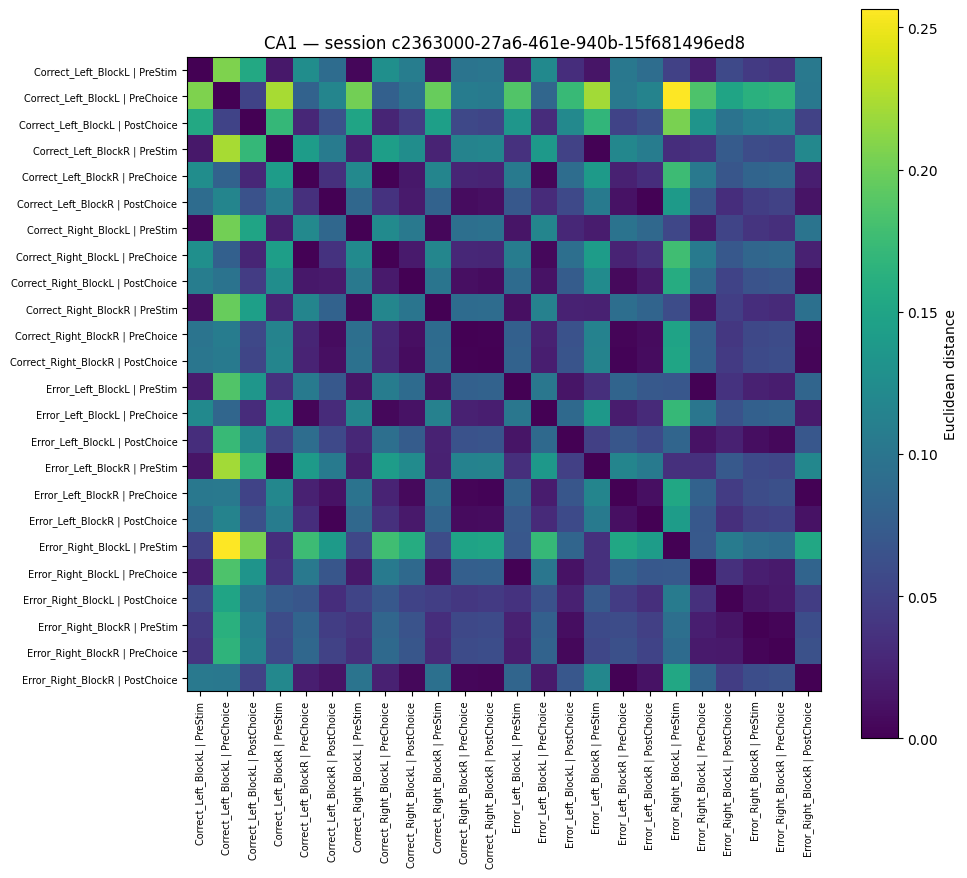

Session c17772a9-21b5-49df-ab31-3017addea12e: 24 / 24 trial types


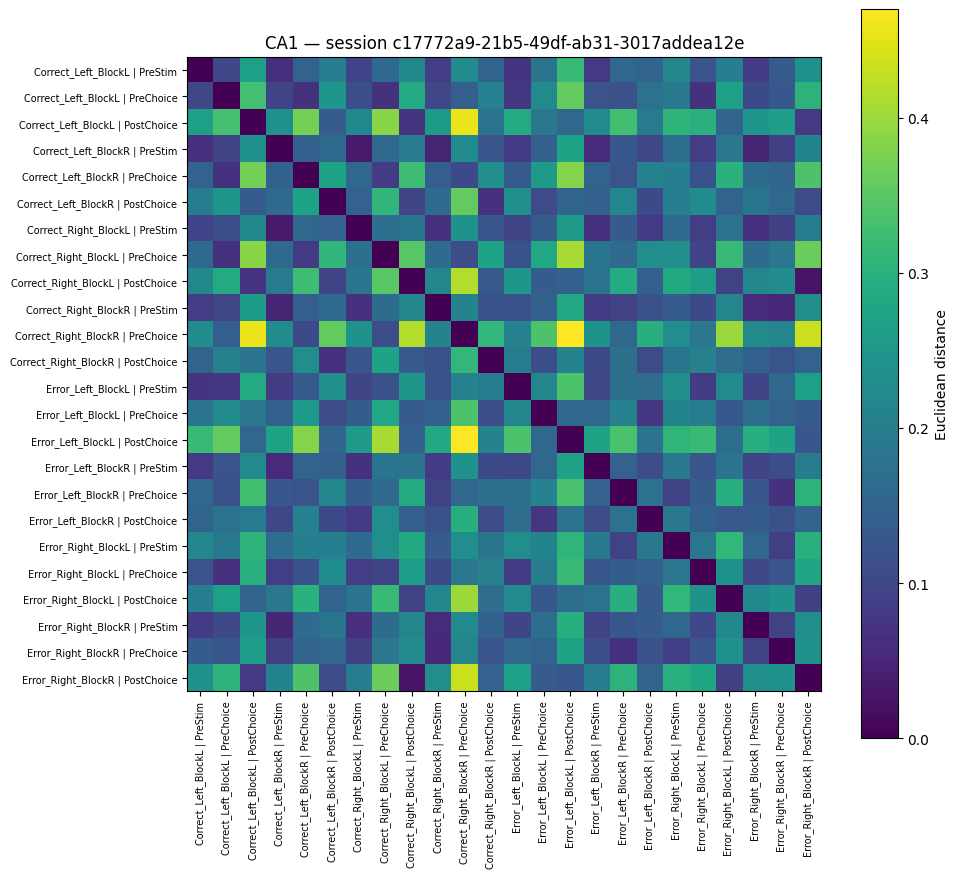

Session 36362f75-96d8-4ed4-a728-5e72284d0995: 24 / 24 trial types


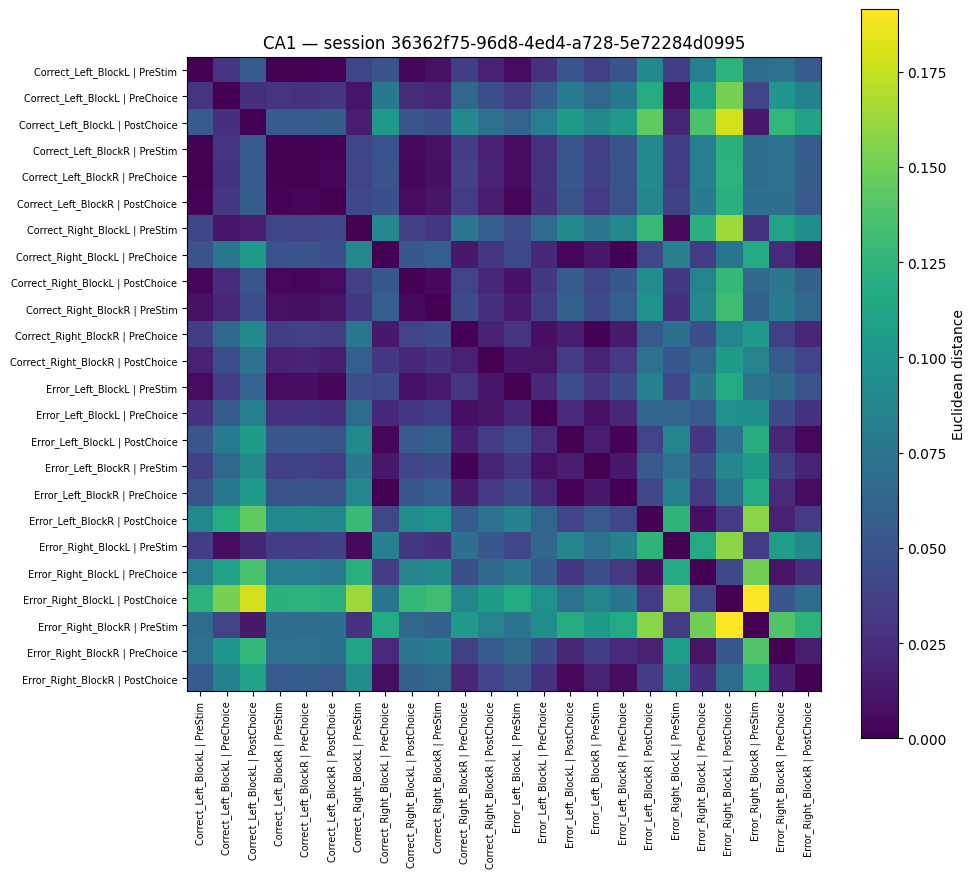

Session 7d999a68-0215-4e45-8e6c-879c6ca2b771: 24 / 24 trial types


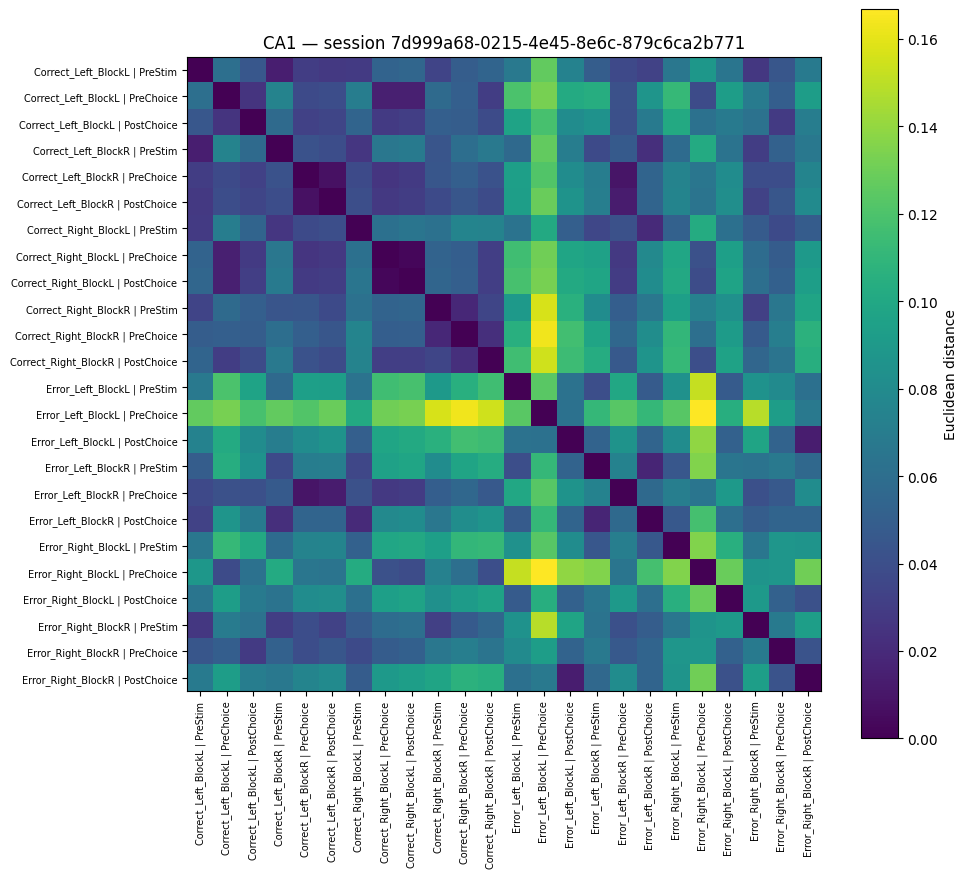

Session b976e816-bc24-42e3-adf4-2801f1a52657: 24 / 24 trial types


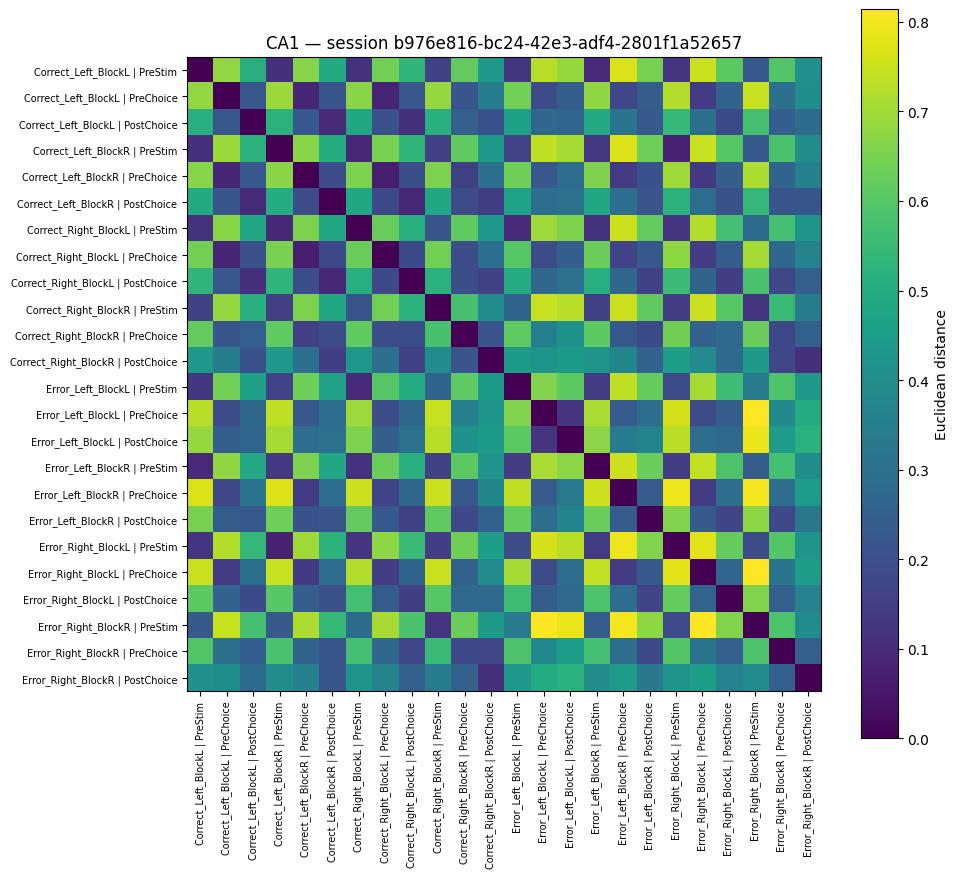

Session c0c3c95d-43c3-4e30-9ce7-0519d0473911: 24 / 24 trial types


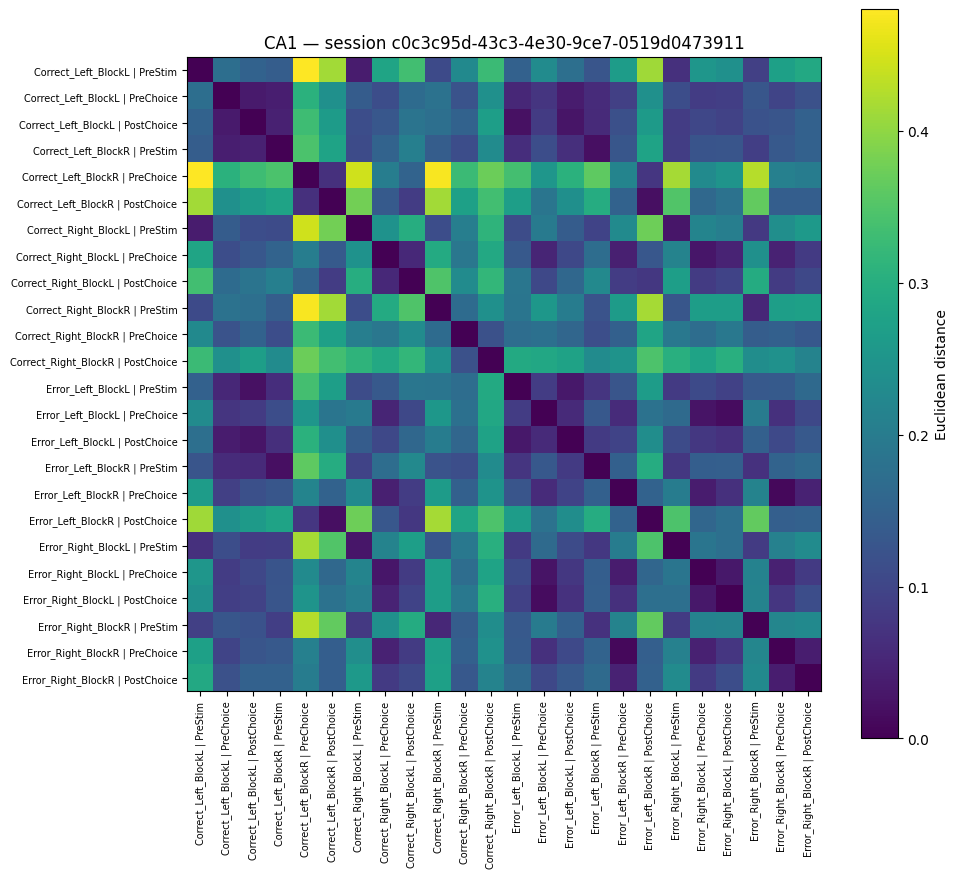

Session 1a60a6e1-da99-4d4e-a734-39b1d4544fad: 24 / 24 trial types


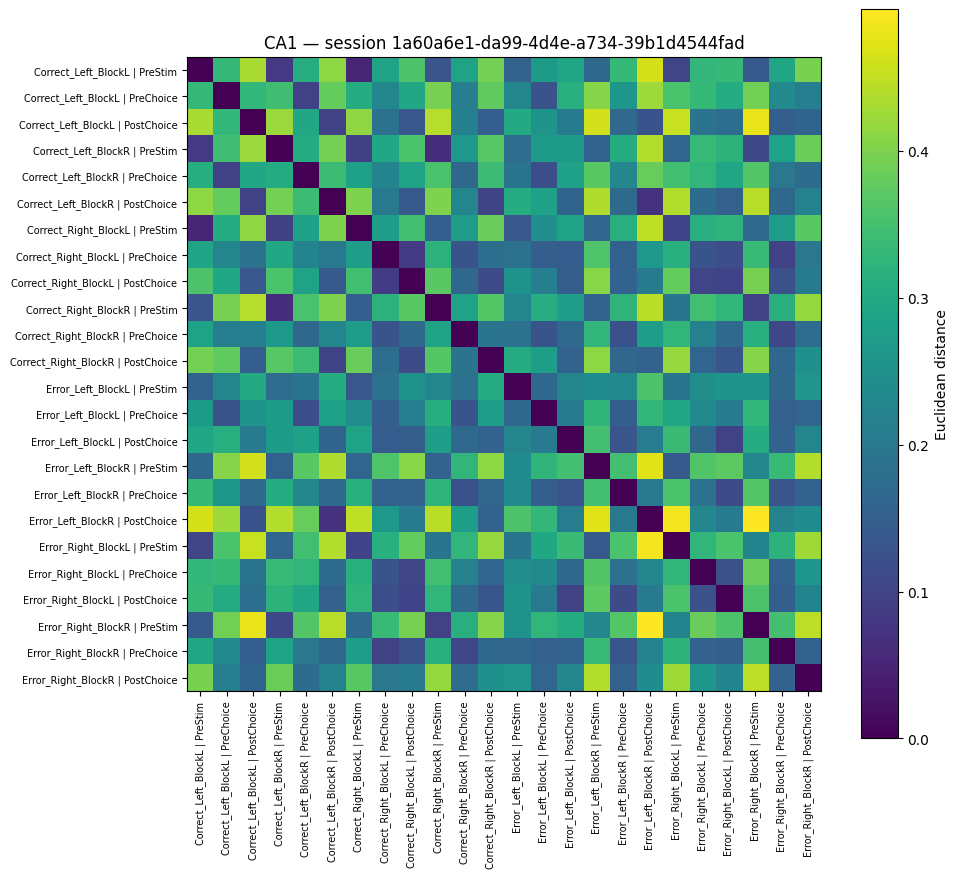

Session 220bca21-4cf8-43f1-a213-71645899c571: 24 / 24 trial types


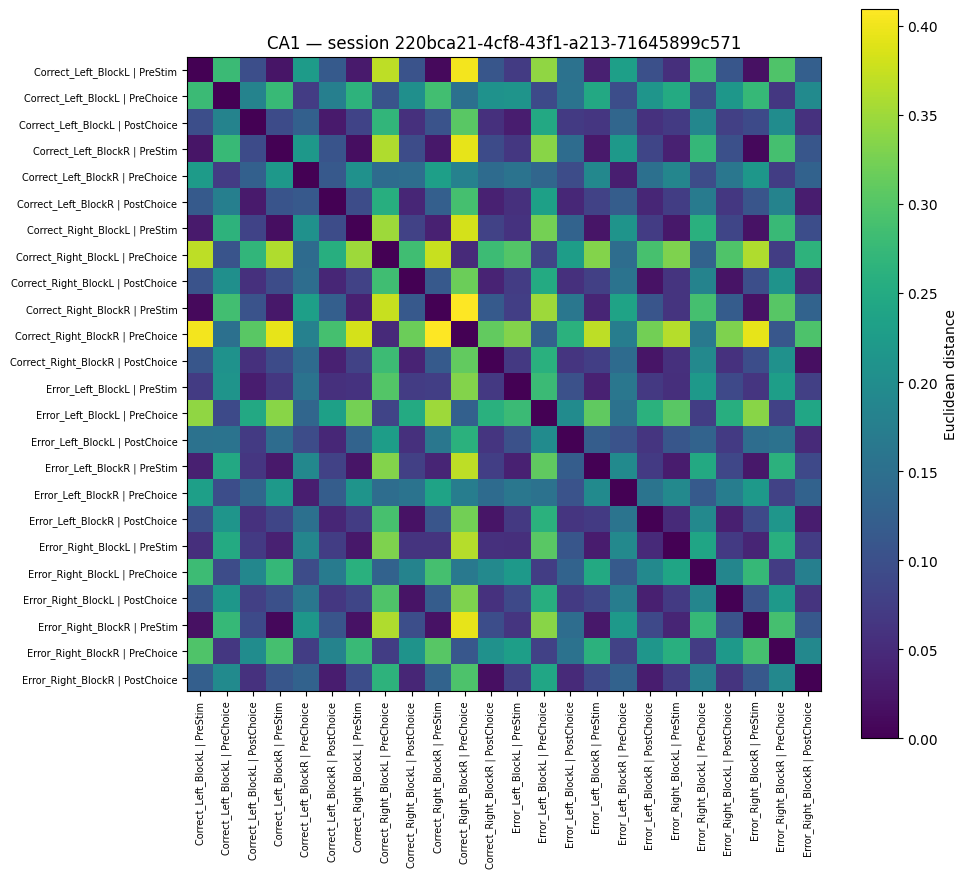

Session 6d9b6393-6729-4a15-ad08-c6838842a074: 24 / 24 trial types


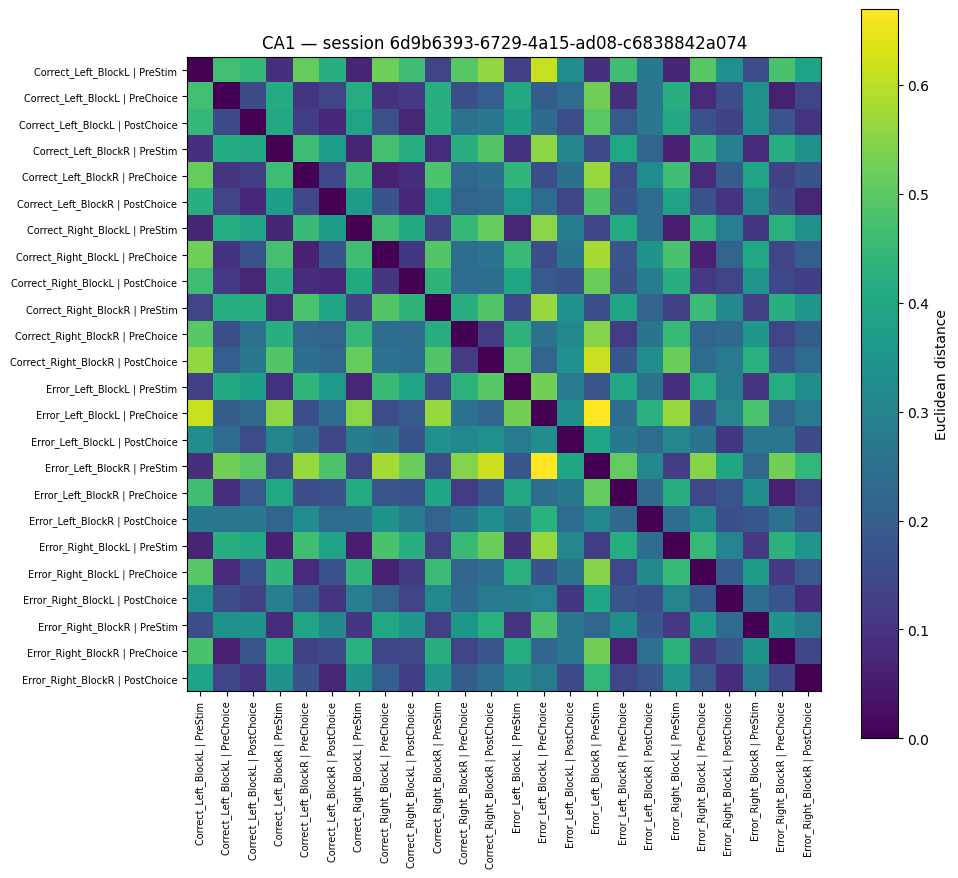

Session 3eb6e6e0-8a57-49d6-b7c9-f39d5834e682: 24 / 24 trial types


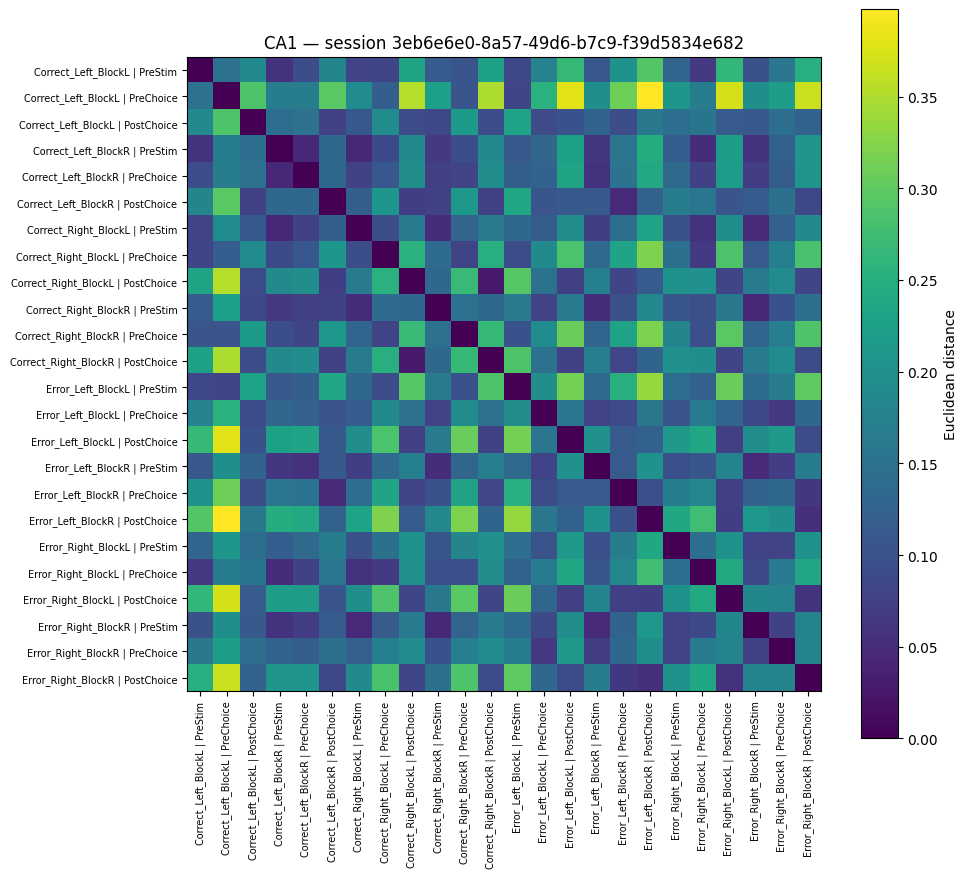

Session 0eb65305-bb95-4bf1-a154-1b810c0cff25: 24 / 24 trial types


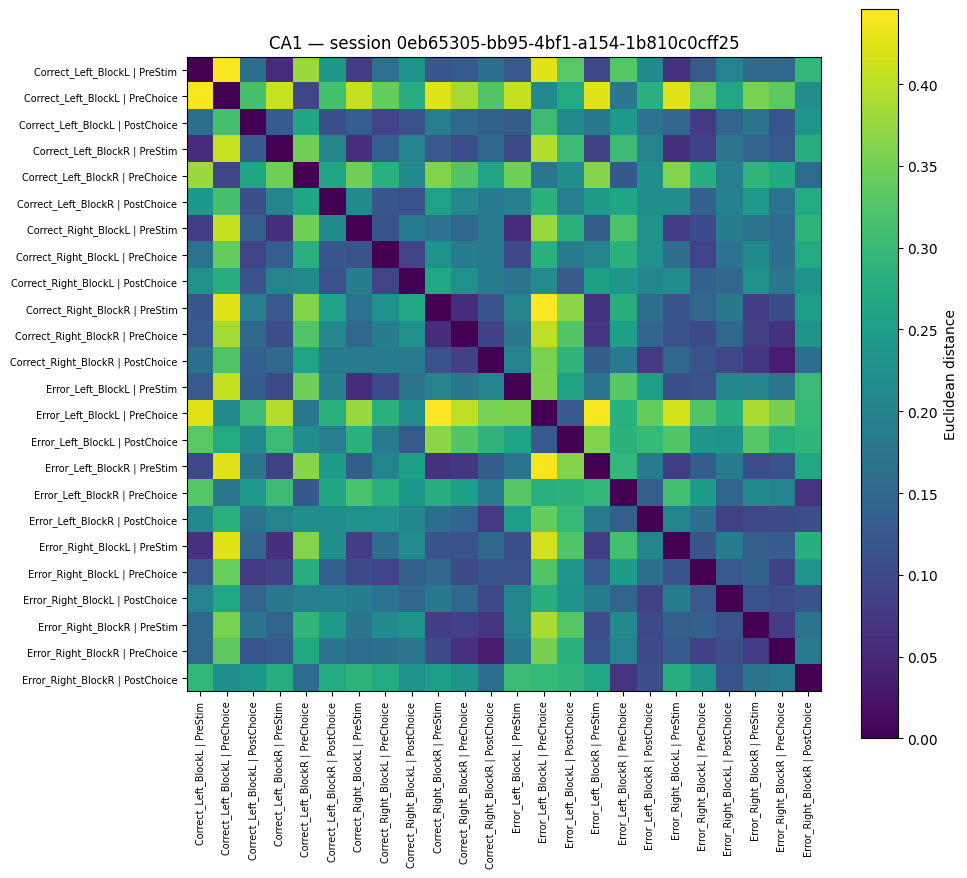

Session 8d59da25-3a9c-44be-8b1a-e27cdd39ca34: 24 / 24 trial types


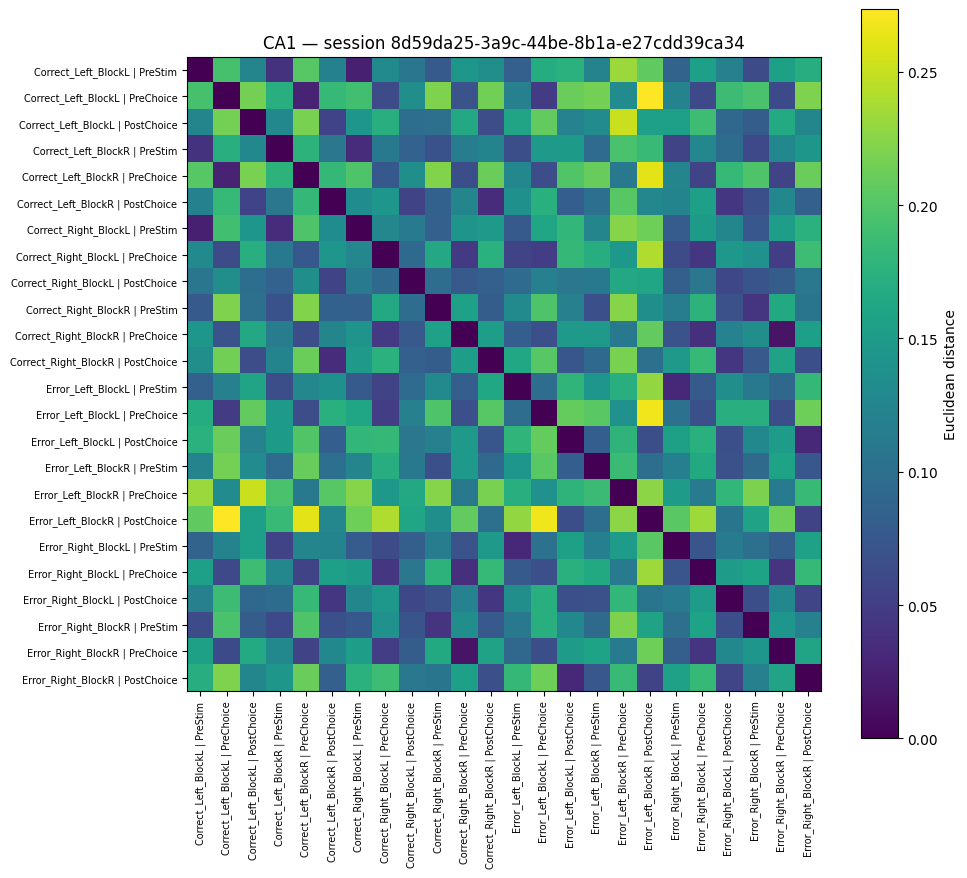

Session 9b3ad89a-177f-4242-9a96-2fd98721e47f: 24 / 24 trial types


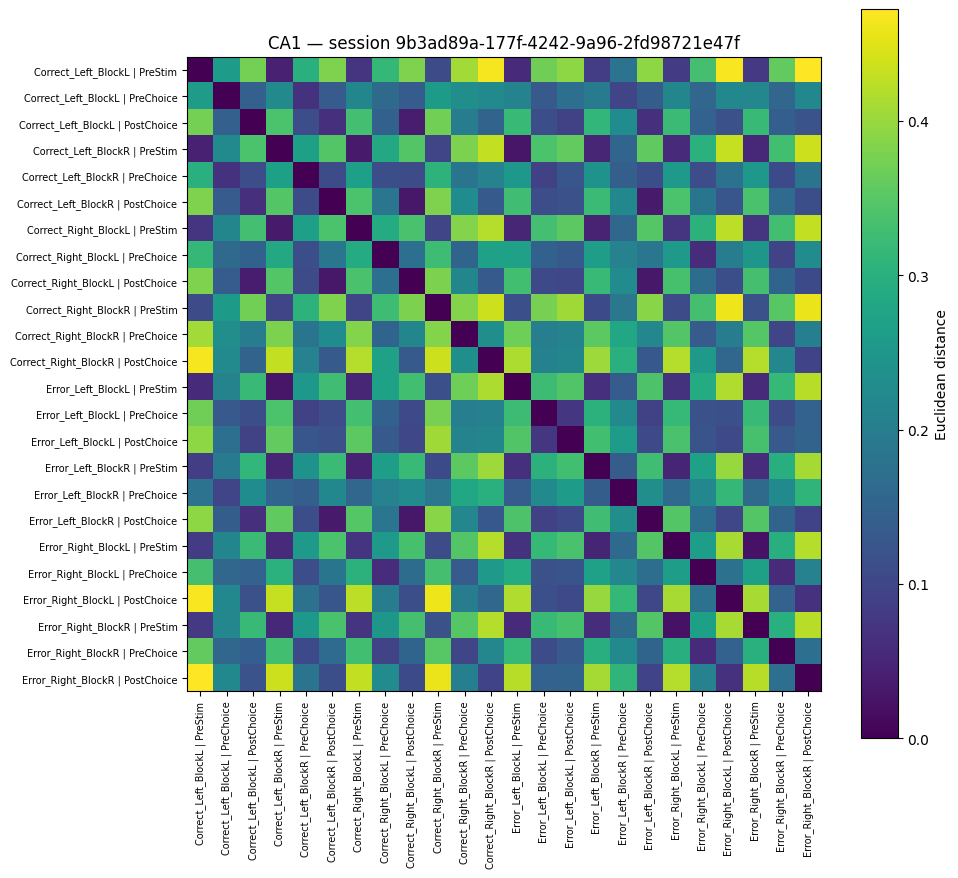

Session 485b50c8-71e1-4654-9a07-64395c15f5ed: 24 / 24 trial types


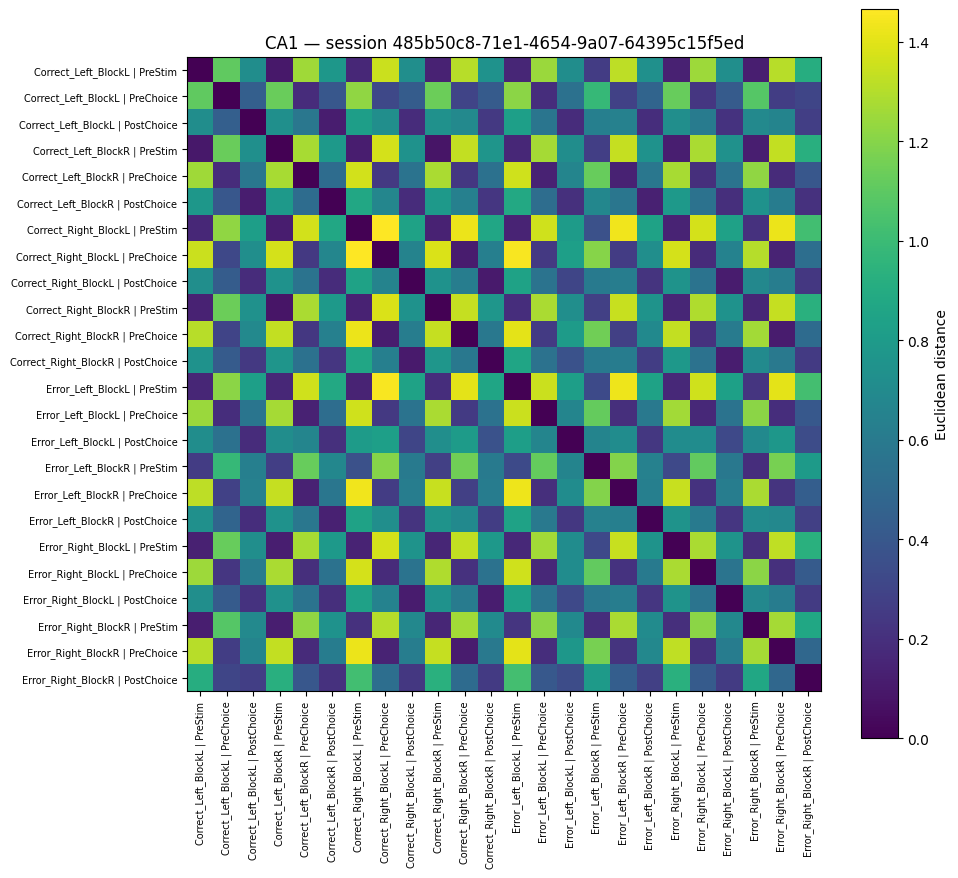

Session f26a6ab1-7e37-4f8d-bb50-295c056e1062: 24 / 24 trial types


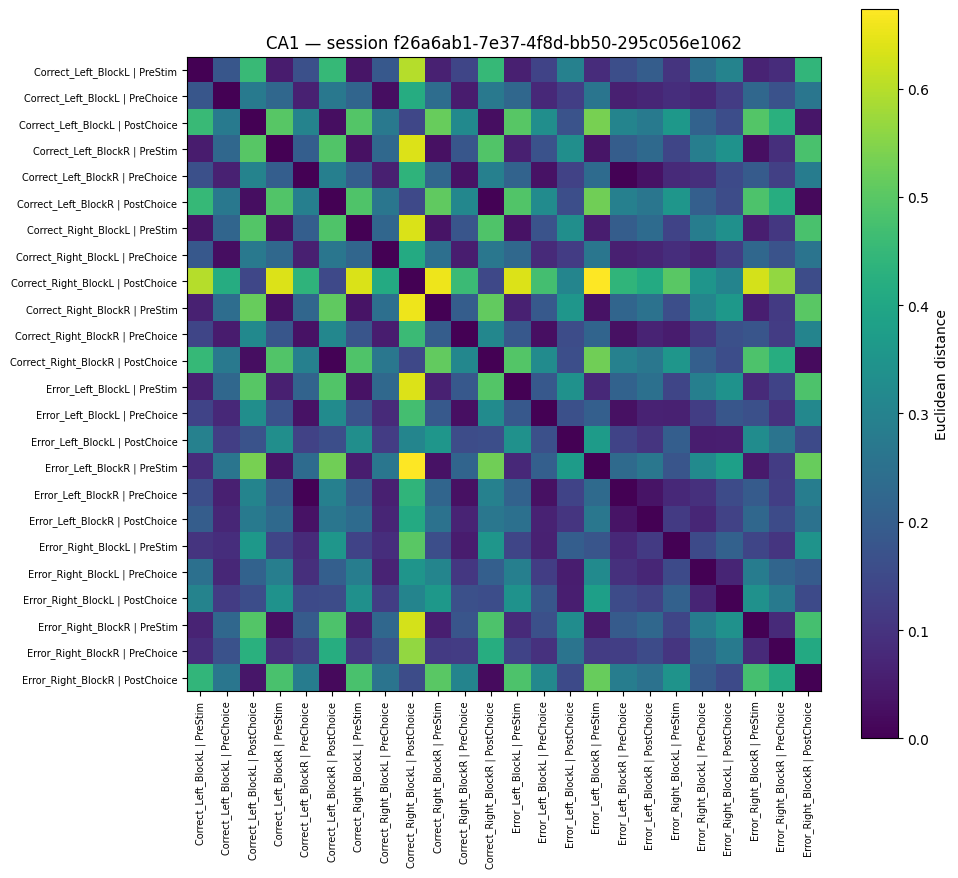

Session 50f1512d-dd41-4a0c-b3ab-b0564f0424d7: 24 / 24 trial types


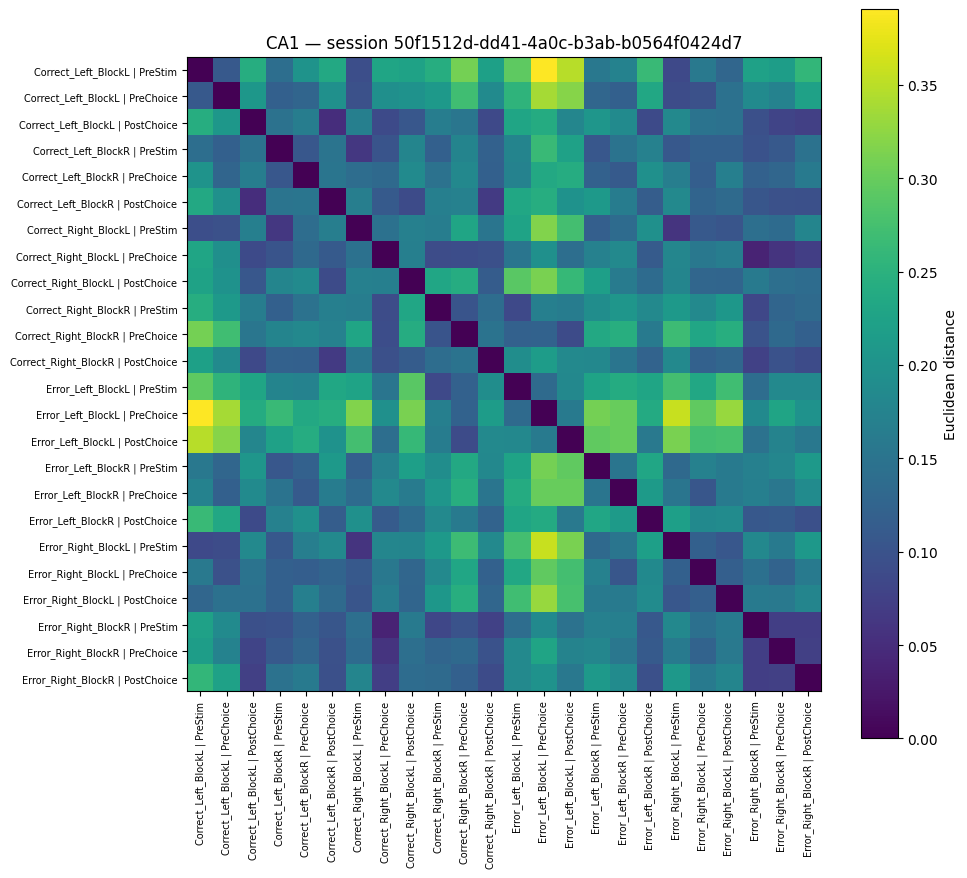

Session ee3345e6-540d-4cea-9e4a-7f1b2fb9a4e4: 21 / 24 trial types


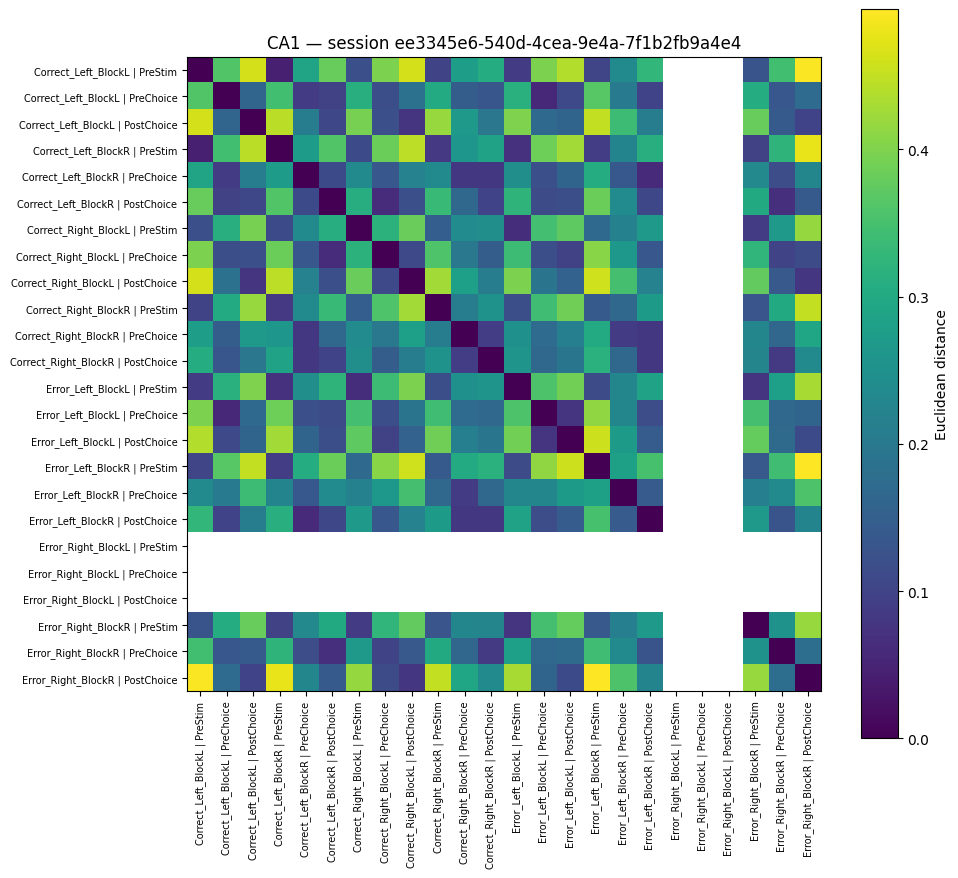

Session e45a00b1-14a0-4f5e-9ea5-9f76d042b11c: 21 / 24 trial types


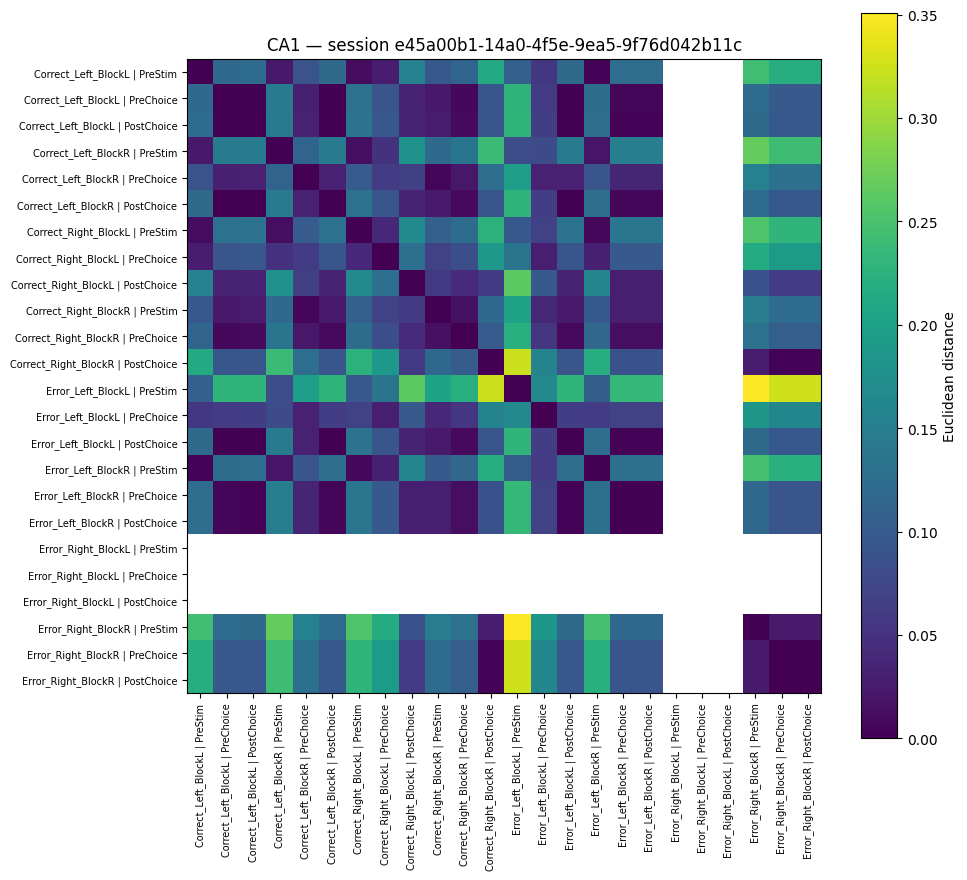

Session 43d4f889-4b05-44df-8306-ea10f854776f: 24 / 24 trial types


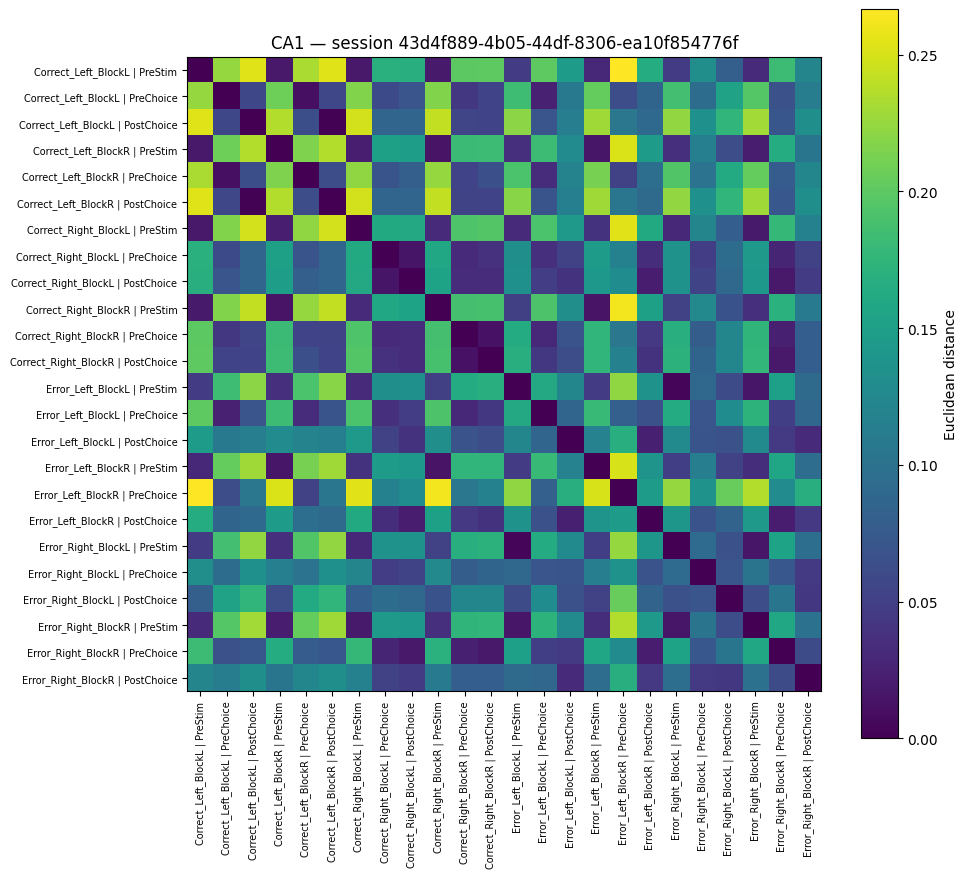

Session 099c0519-640b-4eb7-867c-998dc337579d: 24 / 24 trial types


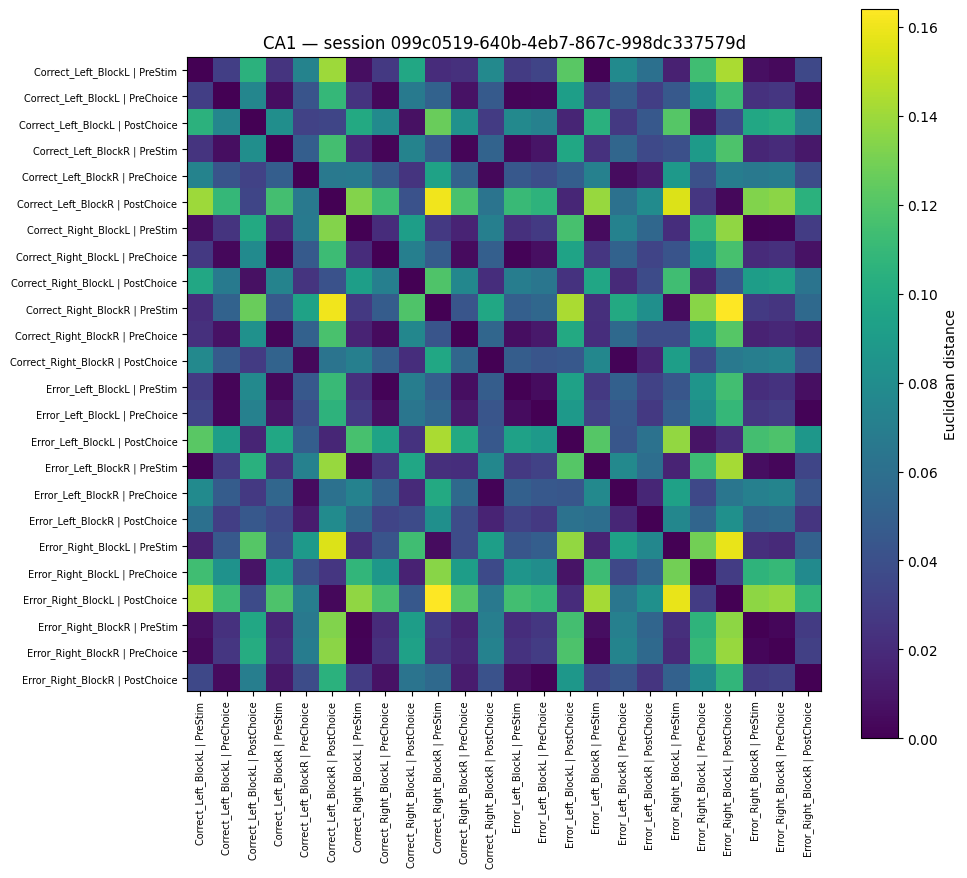

Session b78b3c42-eee5-47c6-9717-743b78c0b721: 24 / 24 trial types


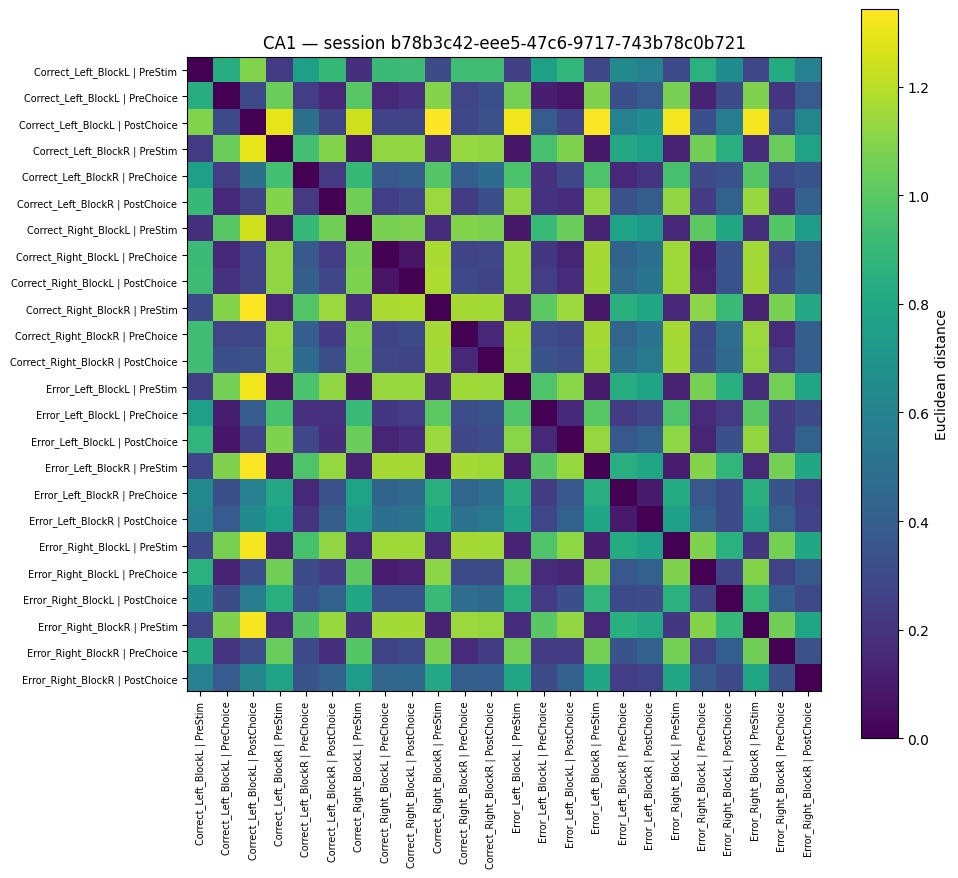

Session e5bc1f00-f4b8-4b35-a9b6-60d9cc7959a1: 24 / 24 trial types


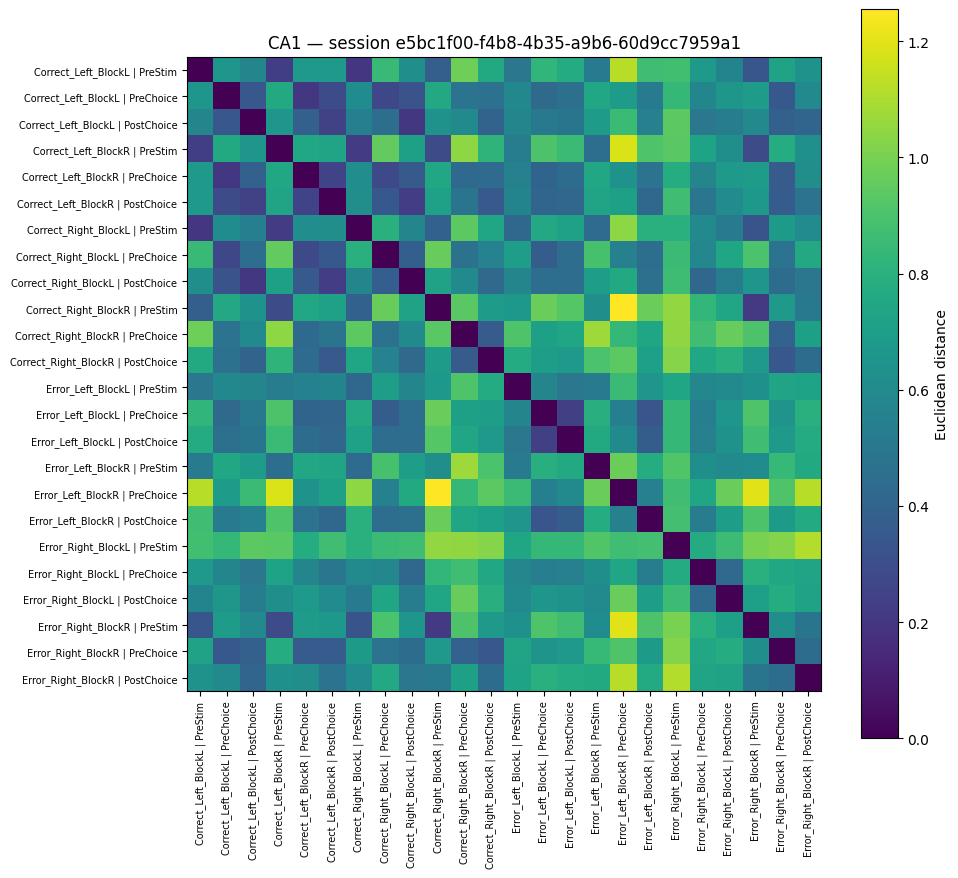

Session ac839451-05bc-493e-b167-558b2b195baa: 24 / 24 trial types


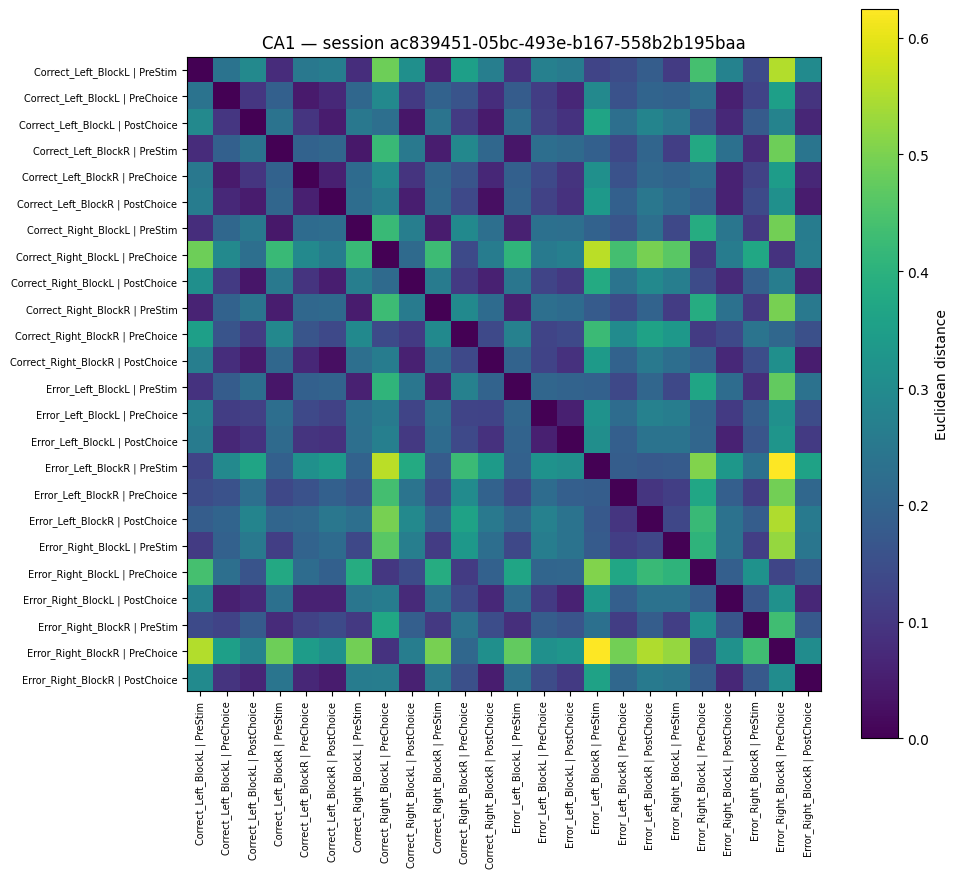

Session 4b93a168-0f3b-4124-88fa-a57046ca70e1: 24 / 24 trial types


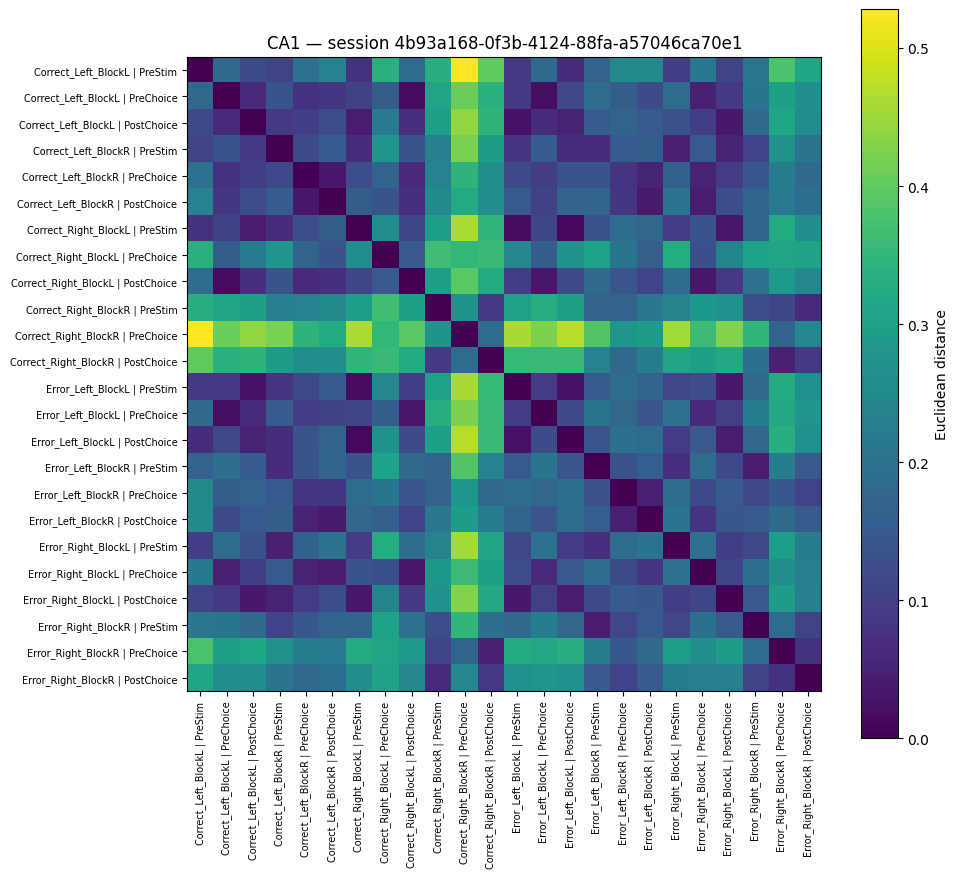

Session 0b8ea3ec-e75b-41a1-9442-64f5fbc11a5a: 24 / 24 trial types


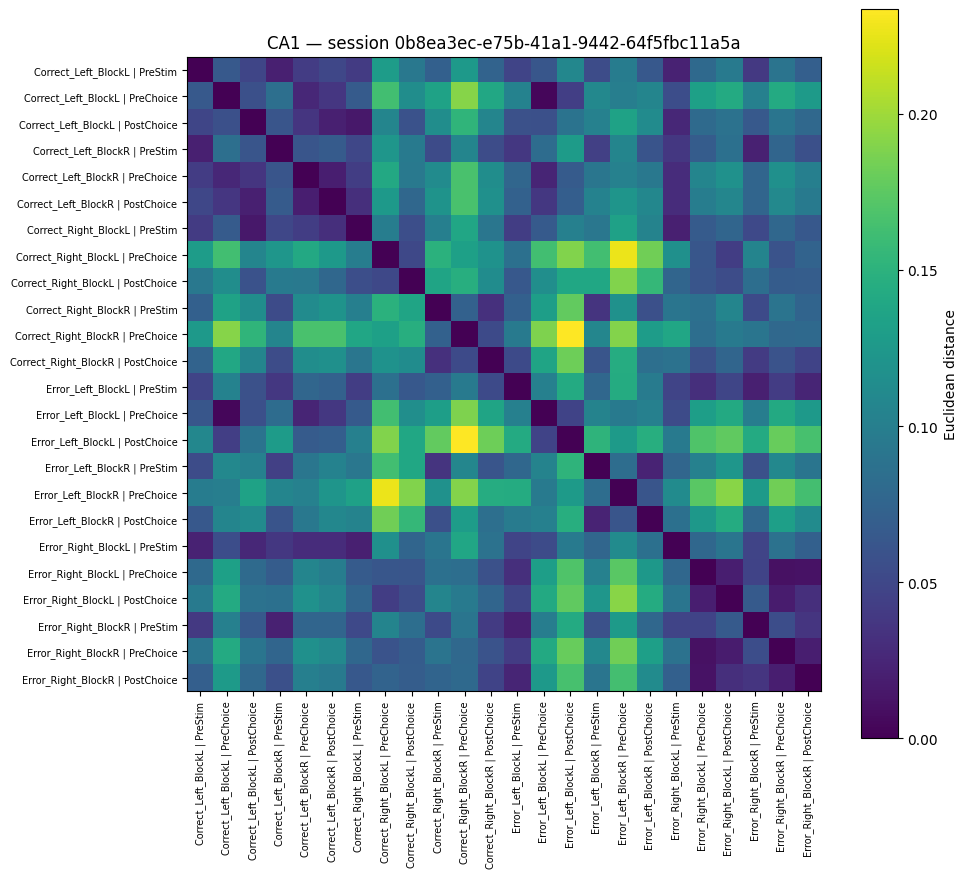

Session afe87fbb-3a17-461f-b333-e22903f1d70d: 24 / 24 trial types


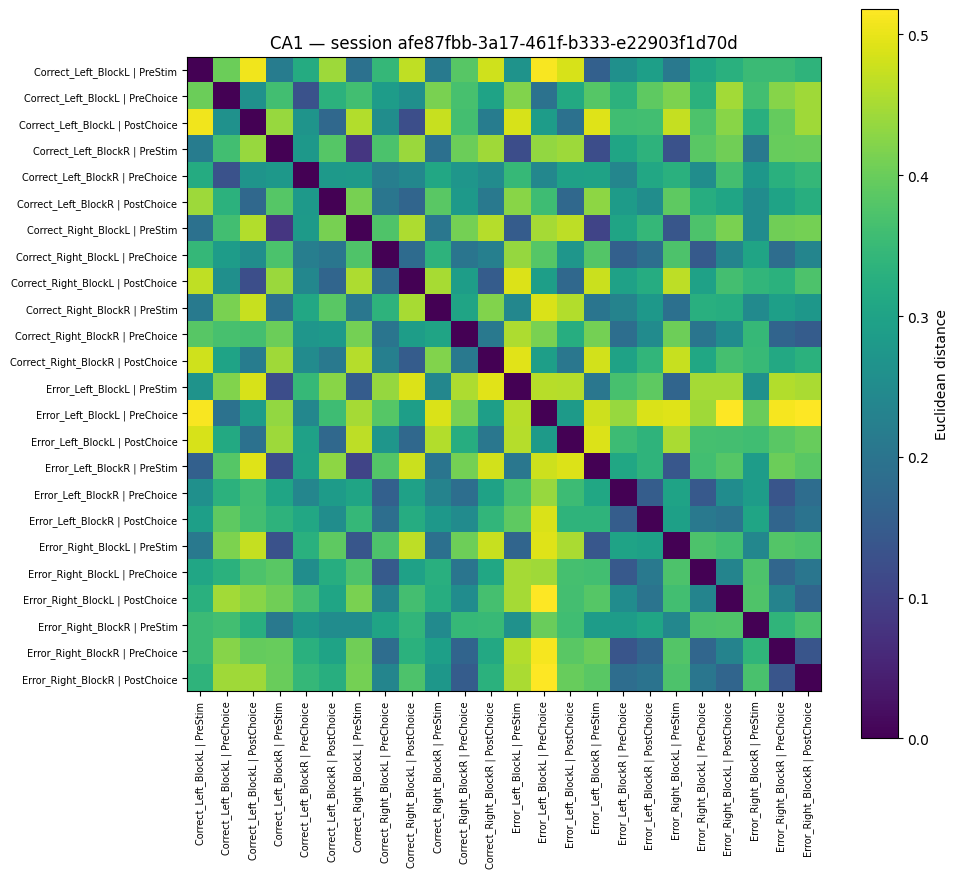

Session f86e9571-63ff-4116-9c40-aa44d57d2da9: 24 / 24 trial types


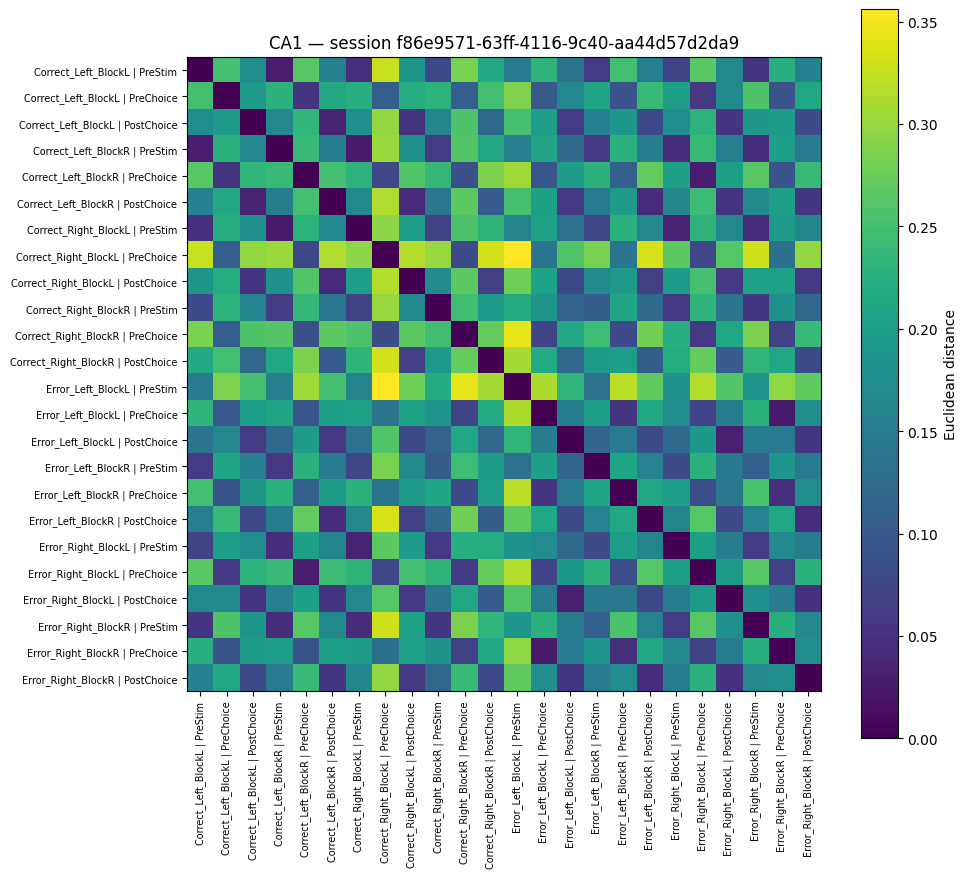

Session 95fd67e6-cbff-4356-80c7-5a03b1bf6b8a: 18 / 24 trial types


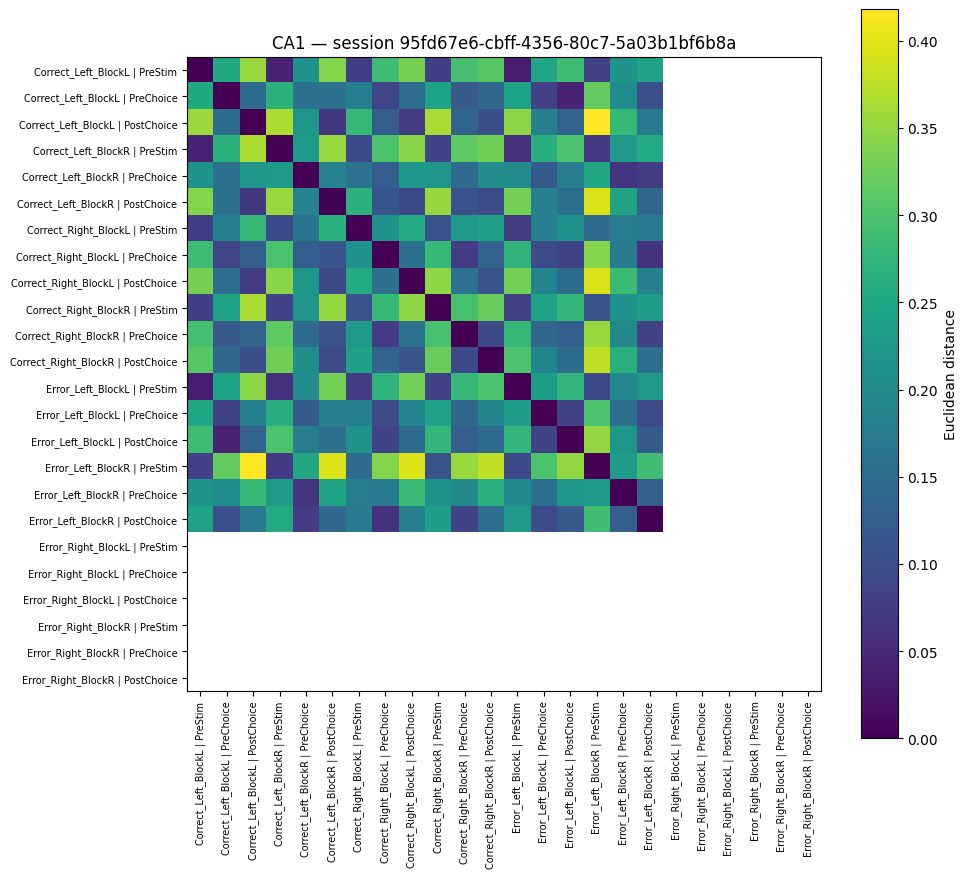

Session c07d13ed-e387-4457-8e33-1d16aed3fd92: 24 / 24 trial types


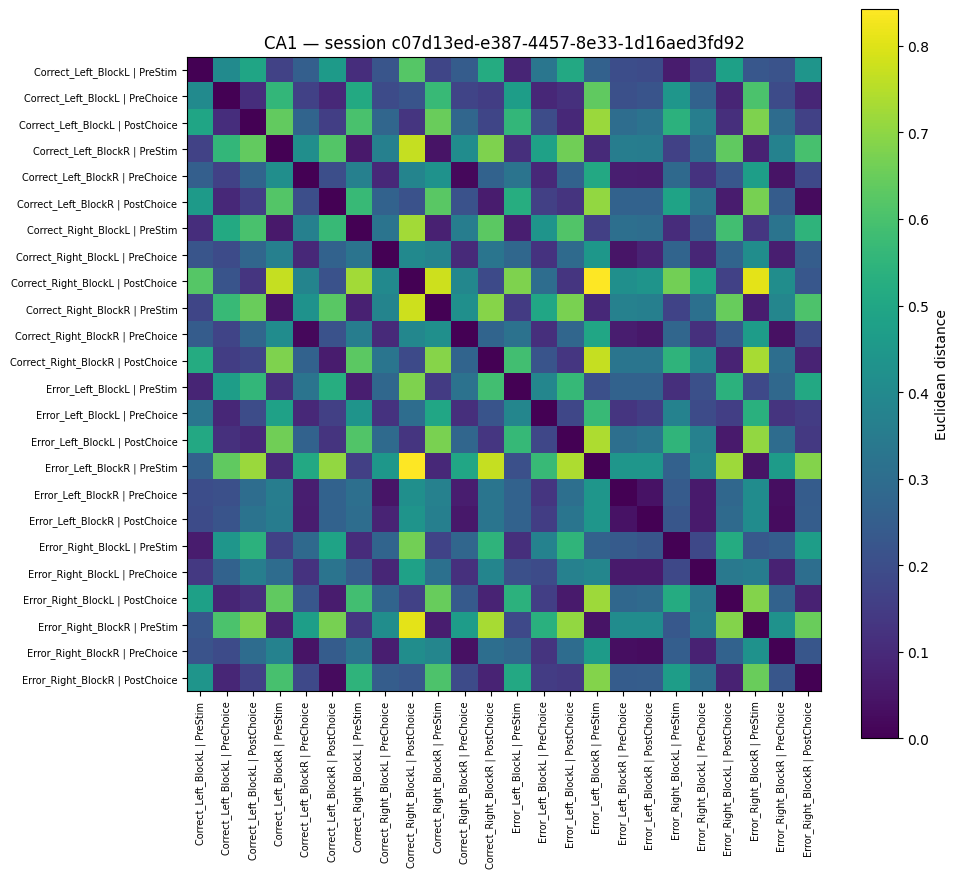

Session f03b61b4-6b13-479d-940f-d1608eb275cc: 24 / 24 trial types


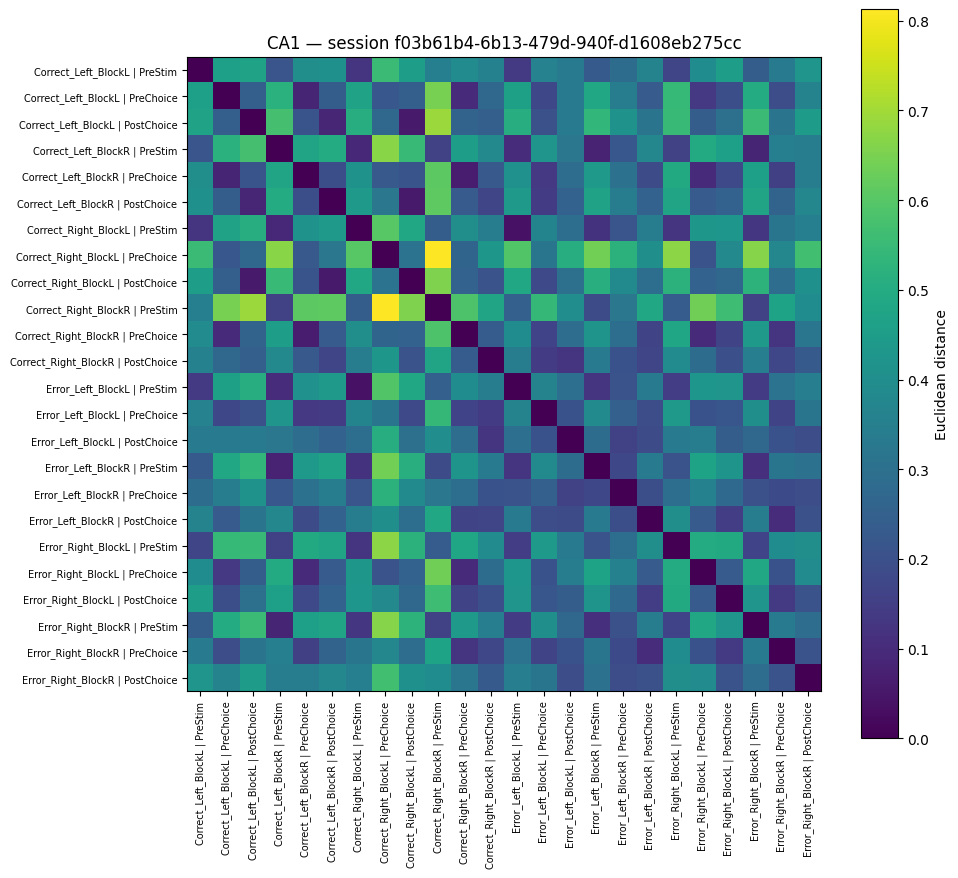

Session 6bd246d2-b2c2-4a88-ac44-1a3e0facbaee: 24 / 24 trial types


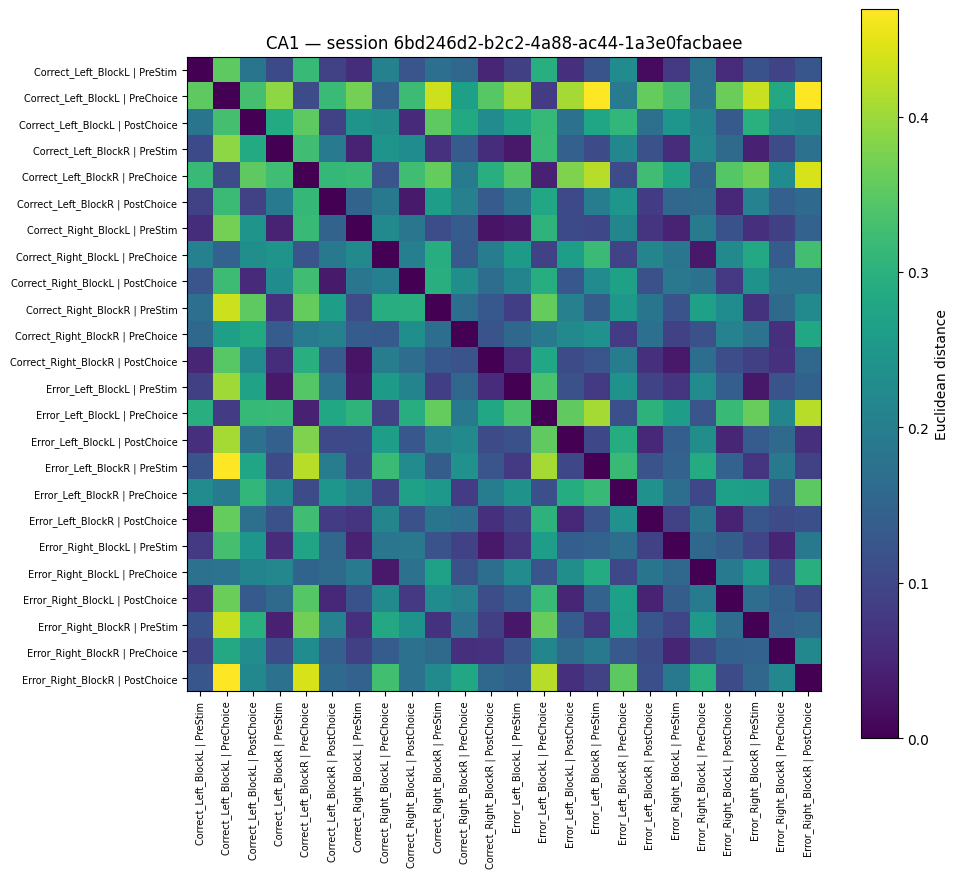

Session 63517fd4-ece1-49eb-9259-371dc30b1dd6: 24 / 24 trial types


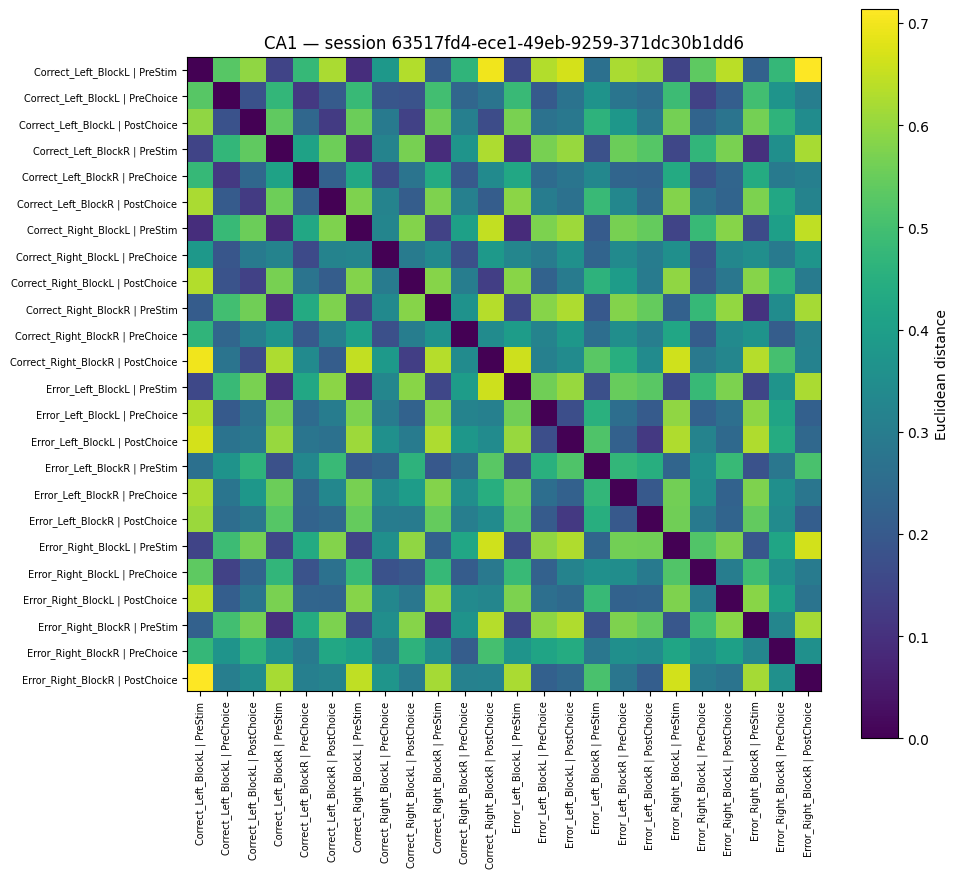

Session 8ab470cc-de5a-4d65-92bd-9a25fbe6d07d: 24 / 24 trial types


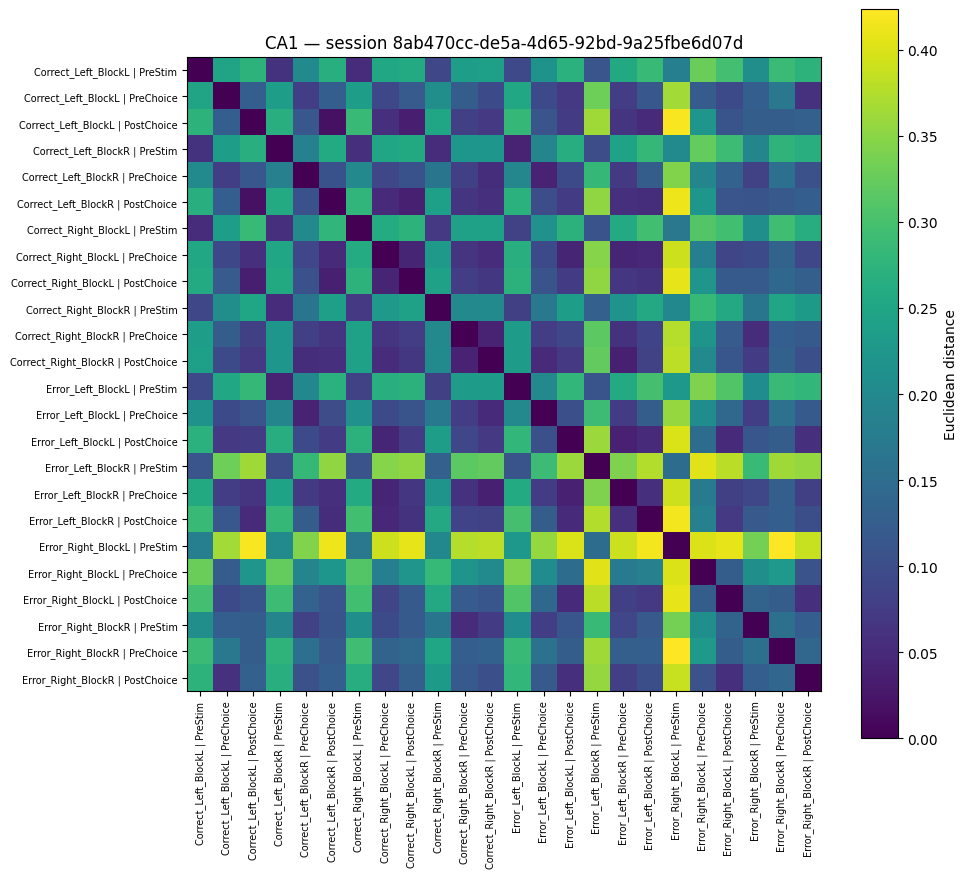

Session c6e294f7-5421-4697-8618-8ccc9b0269f6: 24 / 24 trial types


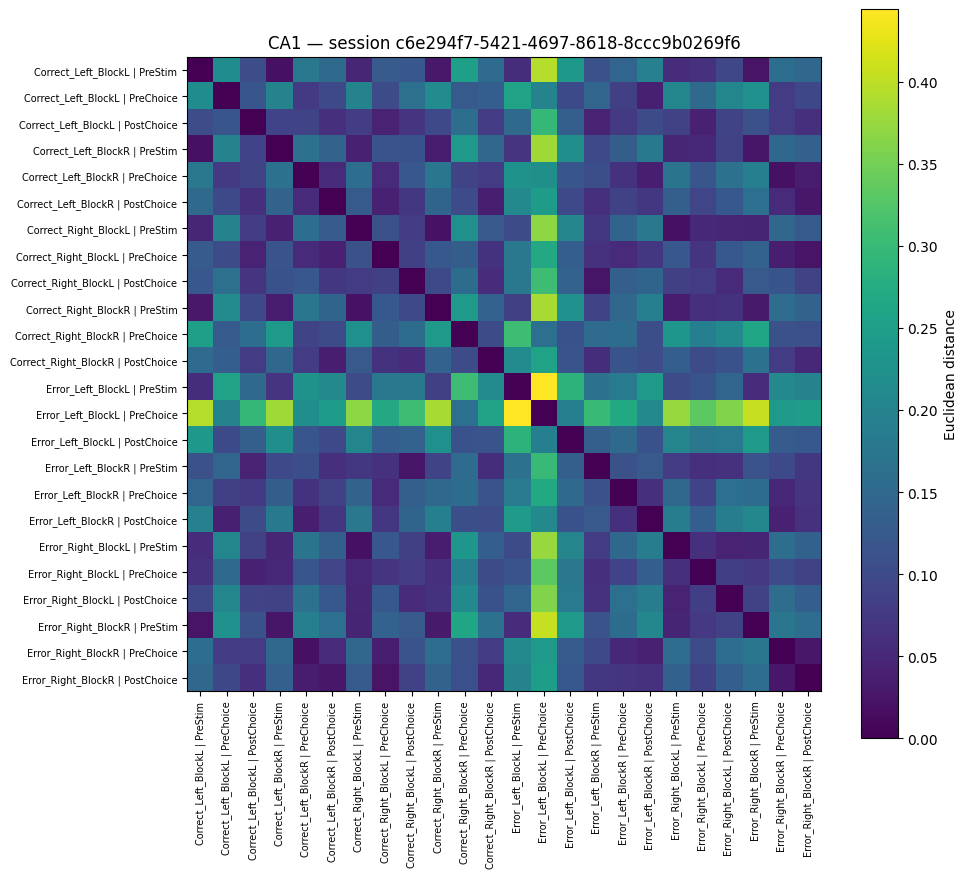

Session 53b3a7c6-ae42-49da-b69c-69e55a43a427: 21 / 24 trial types


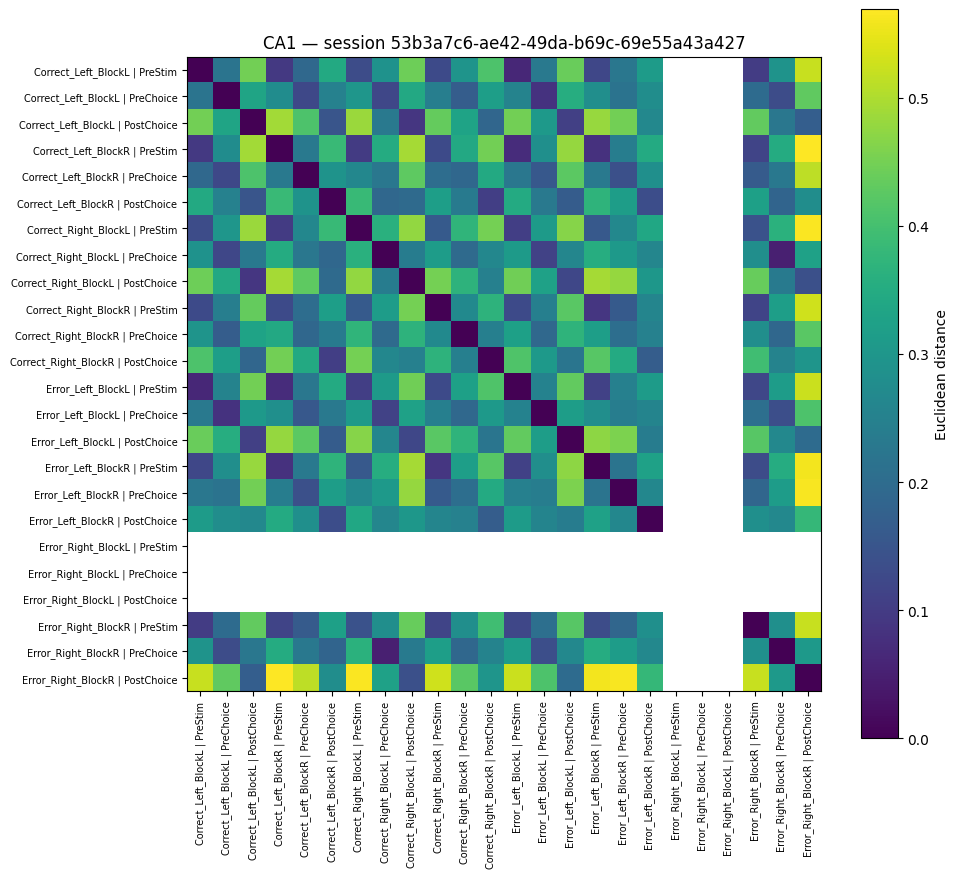

Session b73ef9cf-462c-4de3-ae61-5907790ebd0e: 24 / 24 trial types


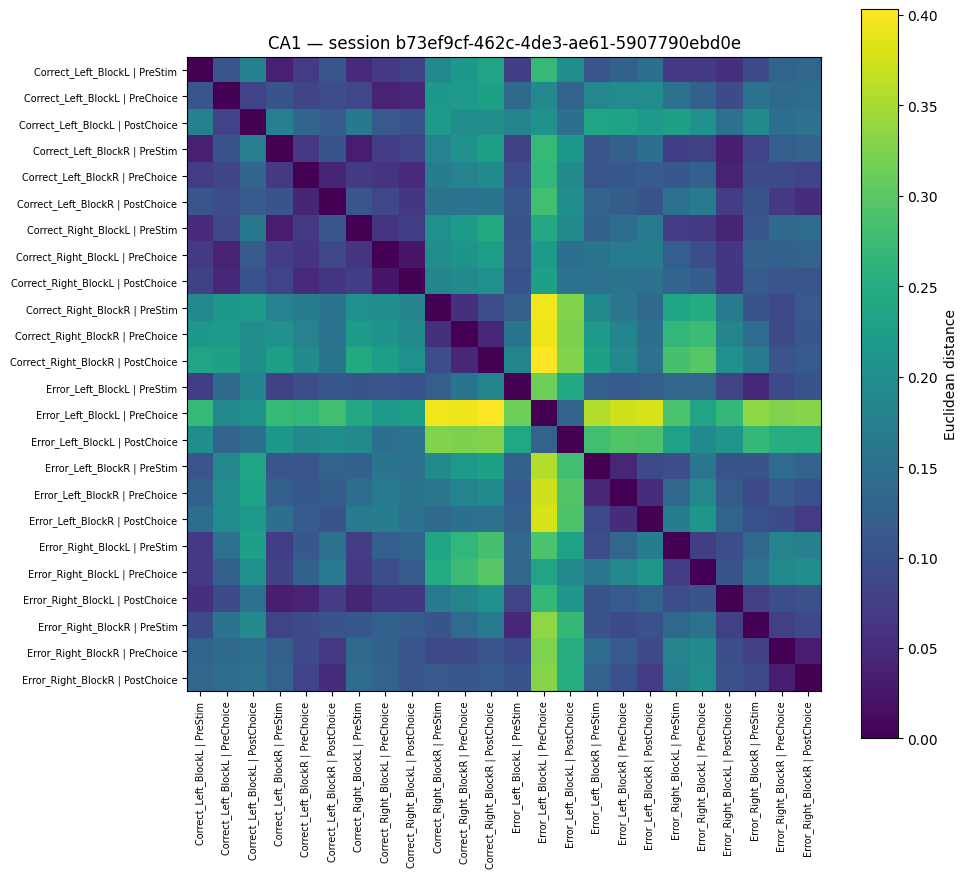

Session 19e0bf1e-018e-40cb-9acd-af8f0f66bd4a: 24 / 24 trial types


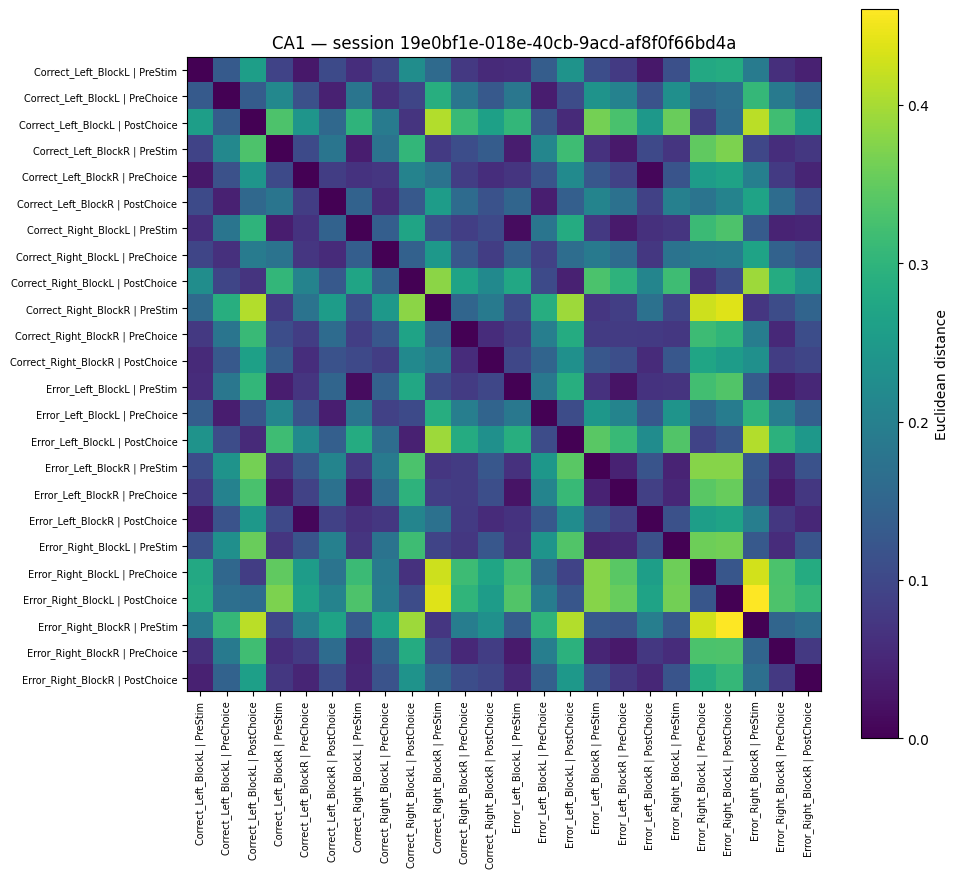

Session d585f4b5-d154-4666-92c4-eb219f1e0f02: 24 / 24 trial types


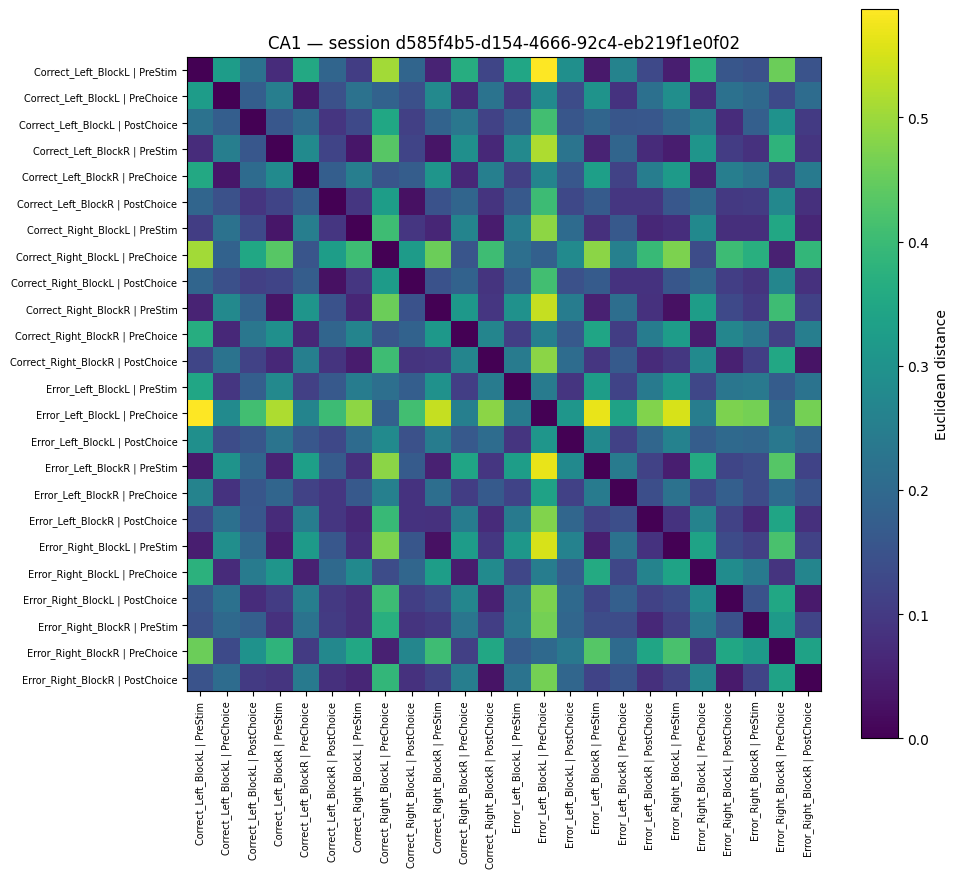

Session f68d9f26-ac40-4c67-9cbf-9ad1851292f7: 24 / 24 trial types


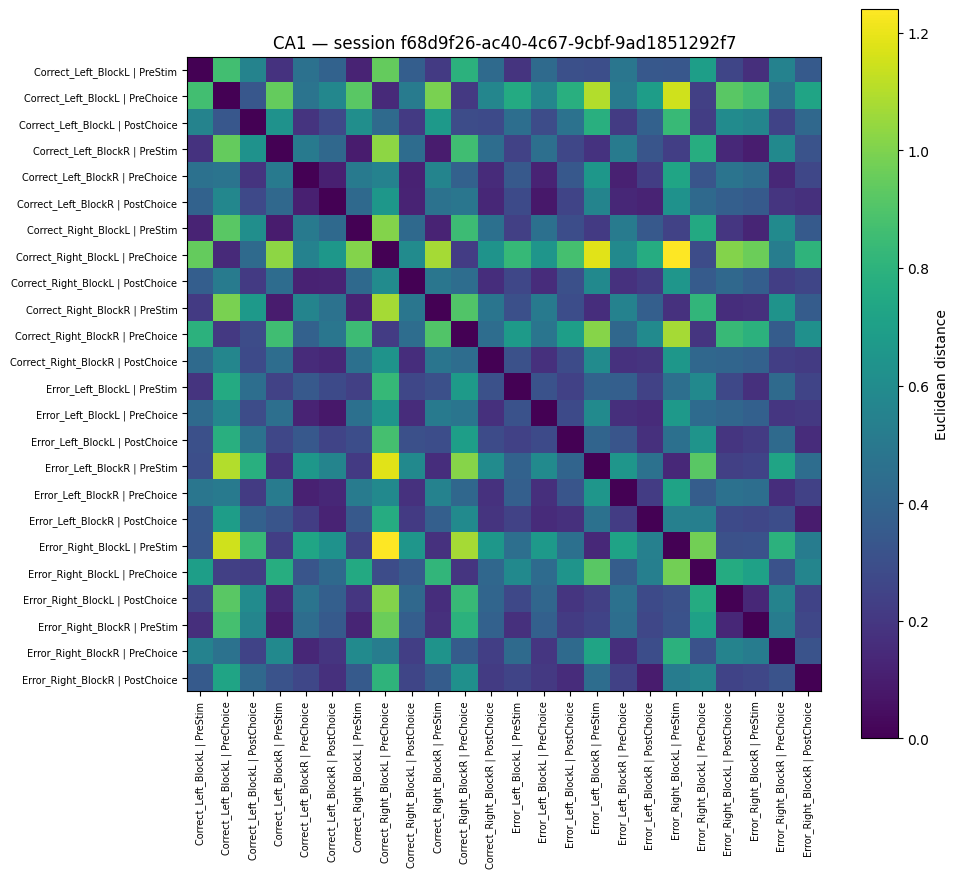

Session 18d316bf-d322-4c5c-814e-a58147f7bf5f: 24 / 24 trial types


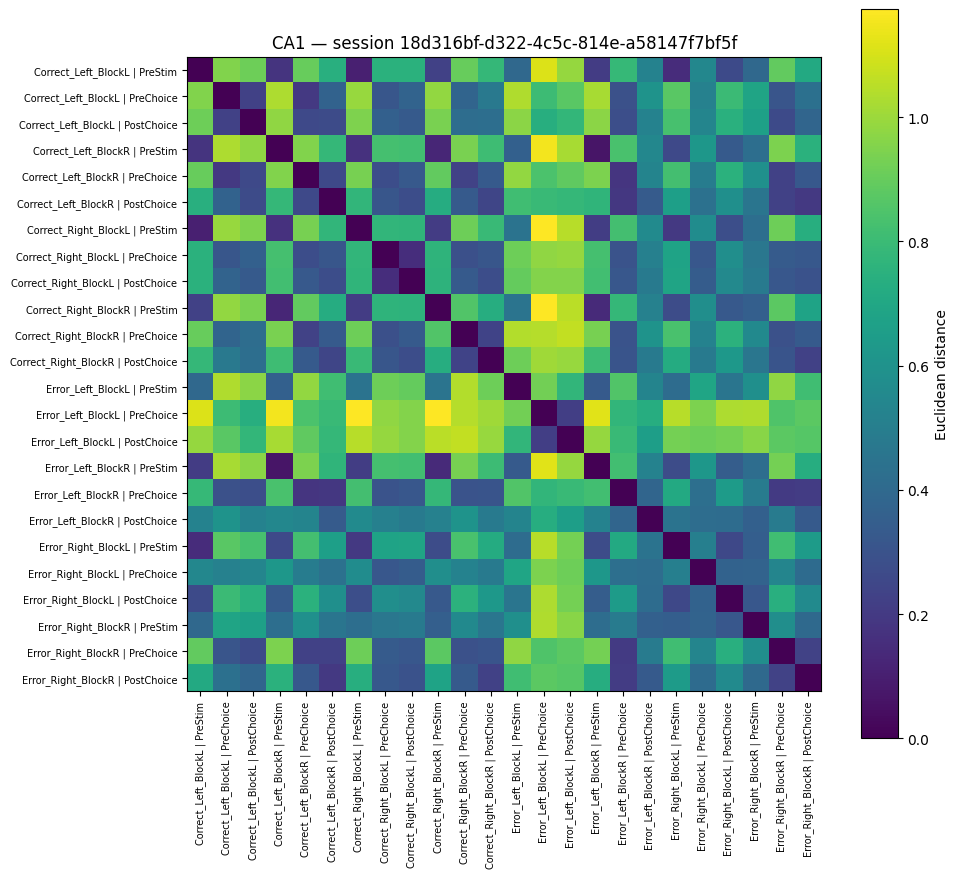

Session f2ee886d-5b9c-4d06-a9be-ee7ae8381114: 24 / 24 trial types


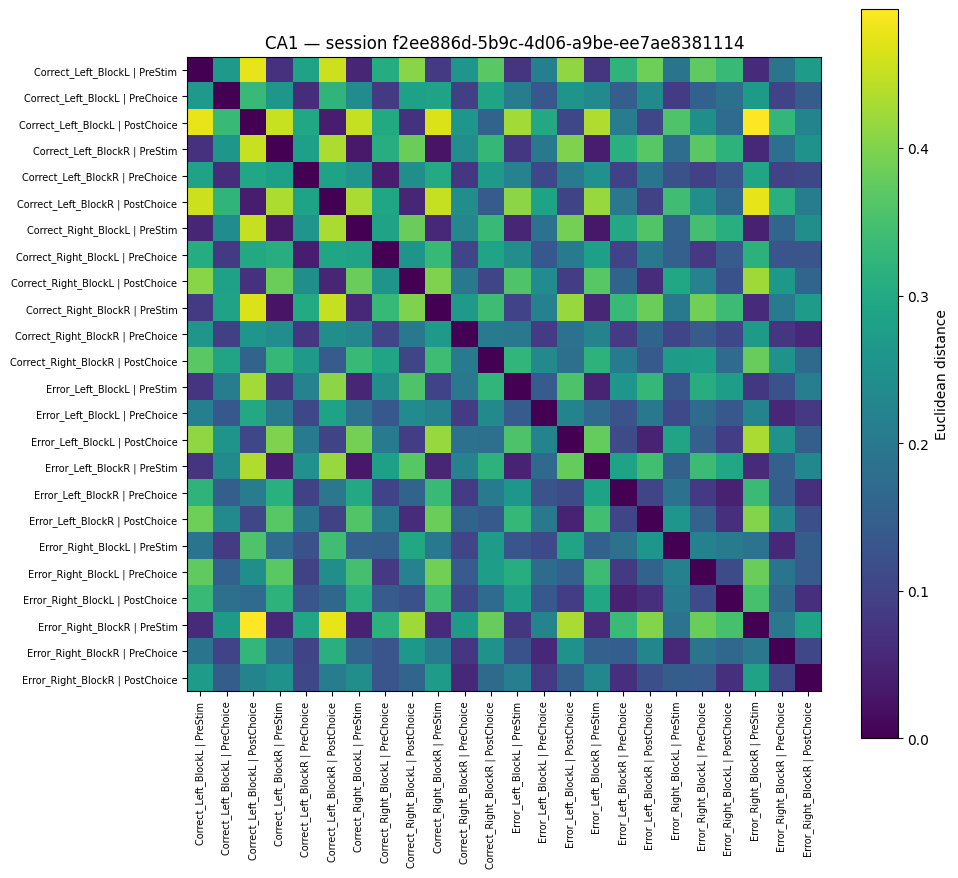

Session 5135e93f-2f1f-4301-9532-b5ad62548c49: 24 / 24 trial types


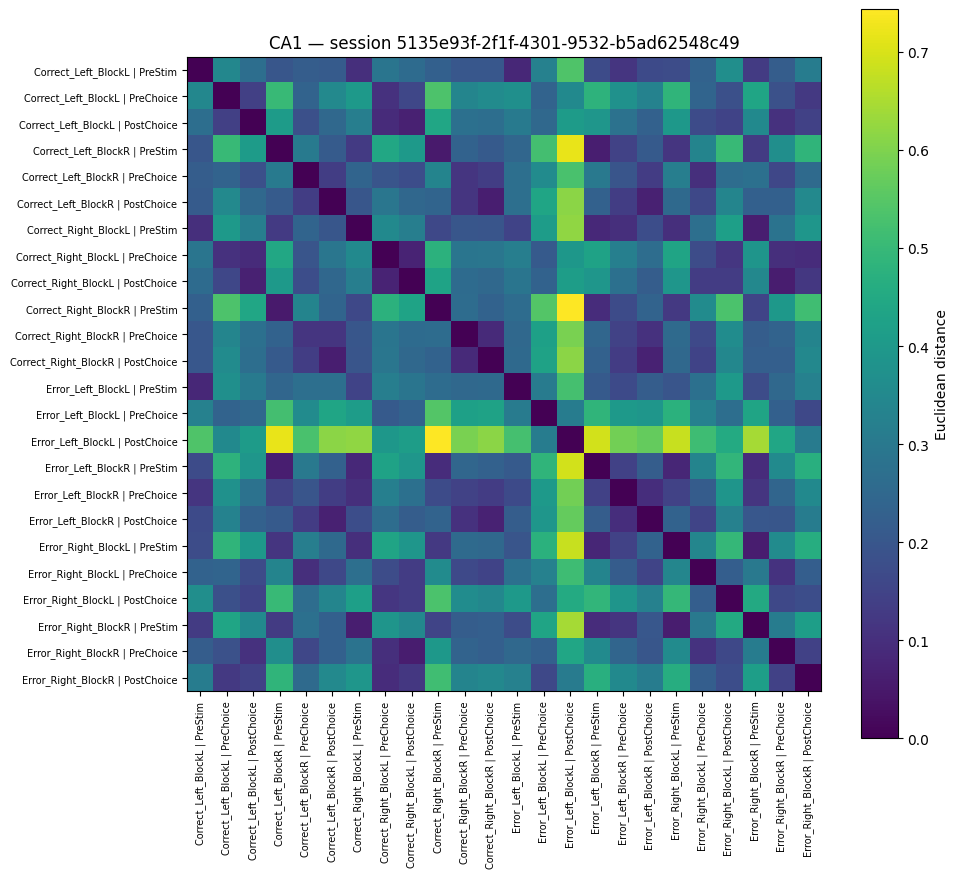

Session e31b4e39-e350-47a9-aca4-72496d99ff2a: 24 / 24 trial types


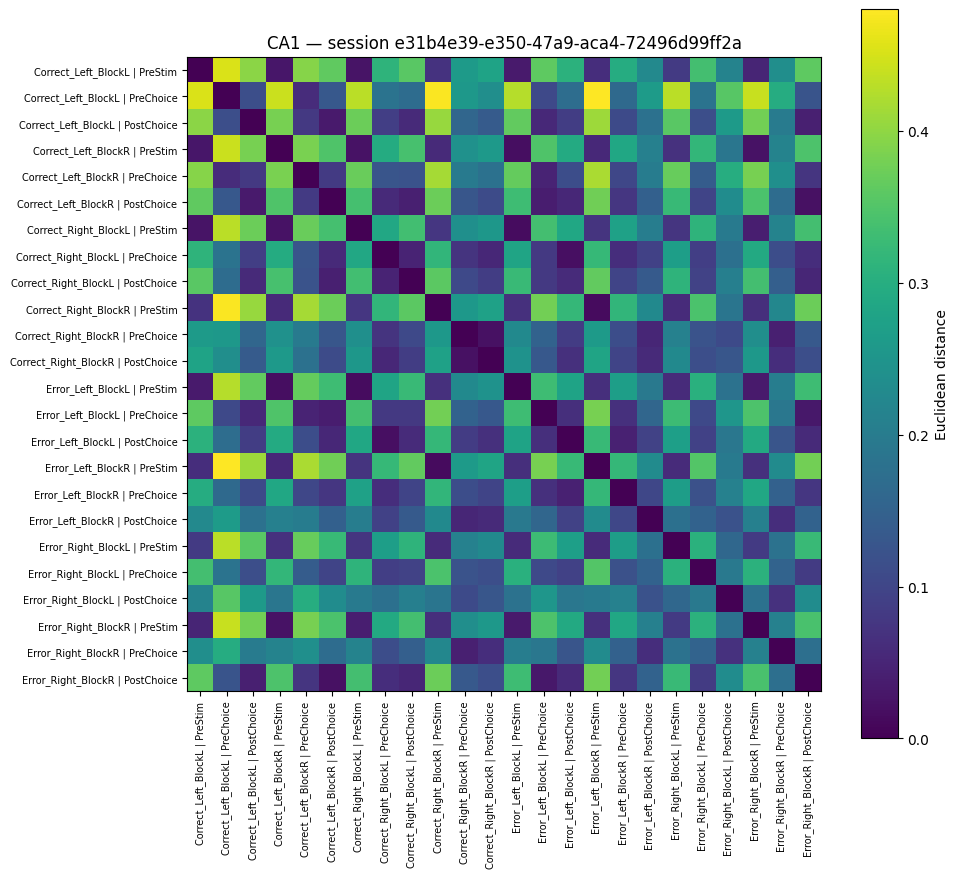

Session ccb501d1-a4fa-41c6-819e-54aaf74d439d: 24 / 24 trial types


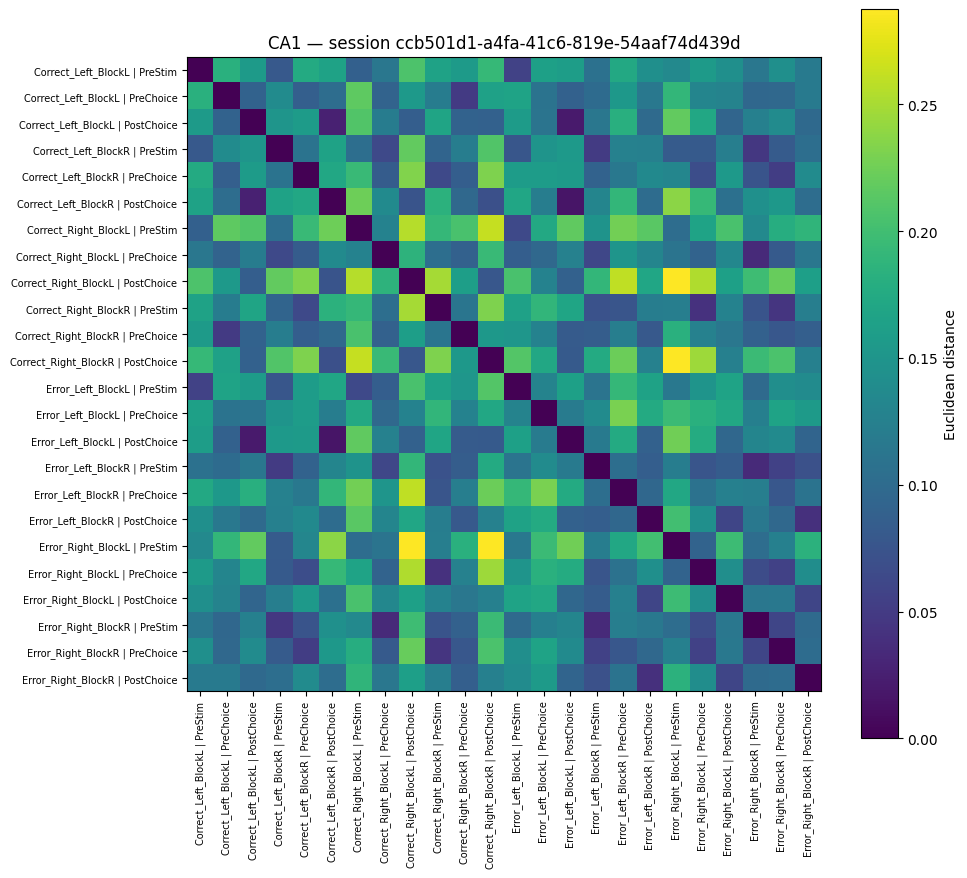

Session 6be21156-33b0-4f70-9a0f-65b3e3cd6d4a: 24 / 24 trial types


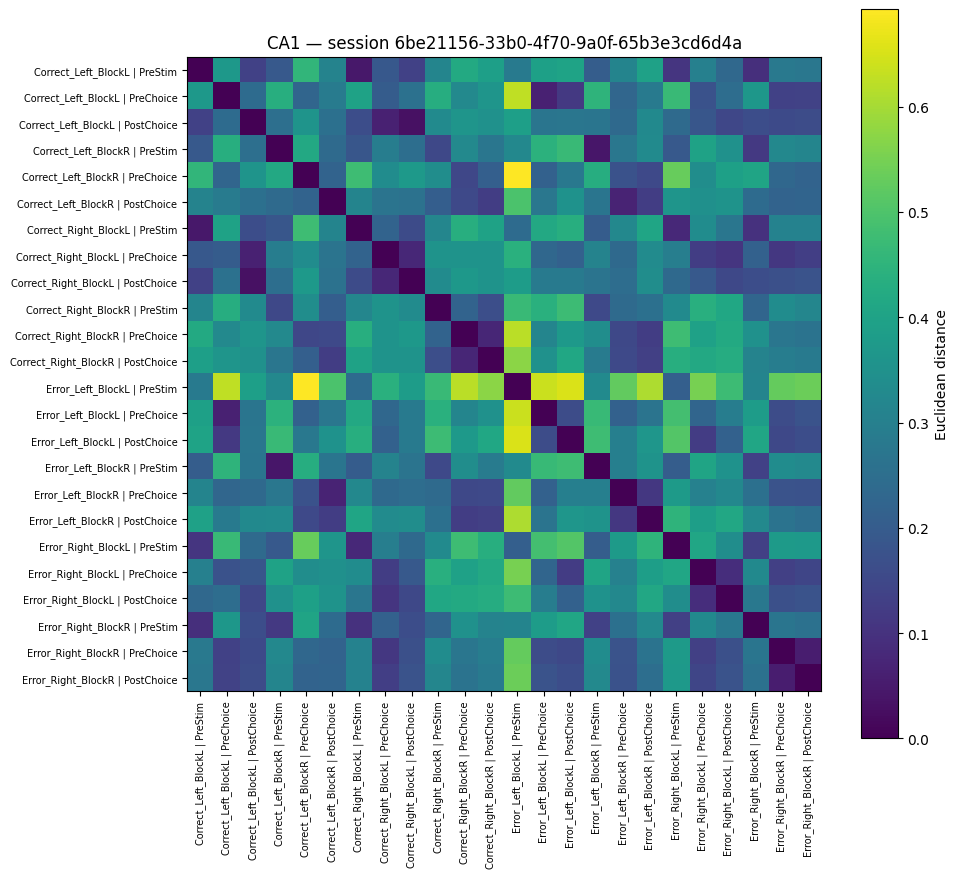

Session 6506252f-1141-4e11-8816-4db01b71dda0: 24 / 24 trial types


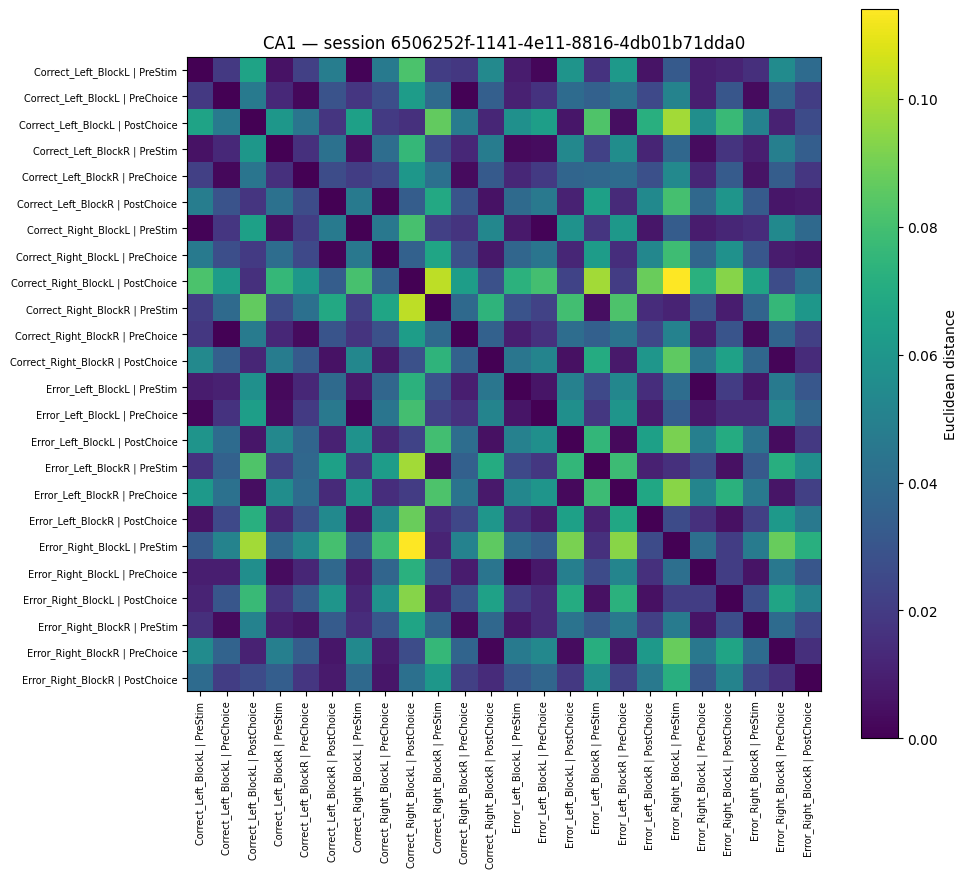

Session 0b877123-0902-4432-b789-c4c6cc681df4: 24 / 24 trial types


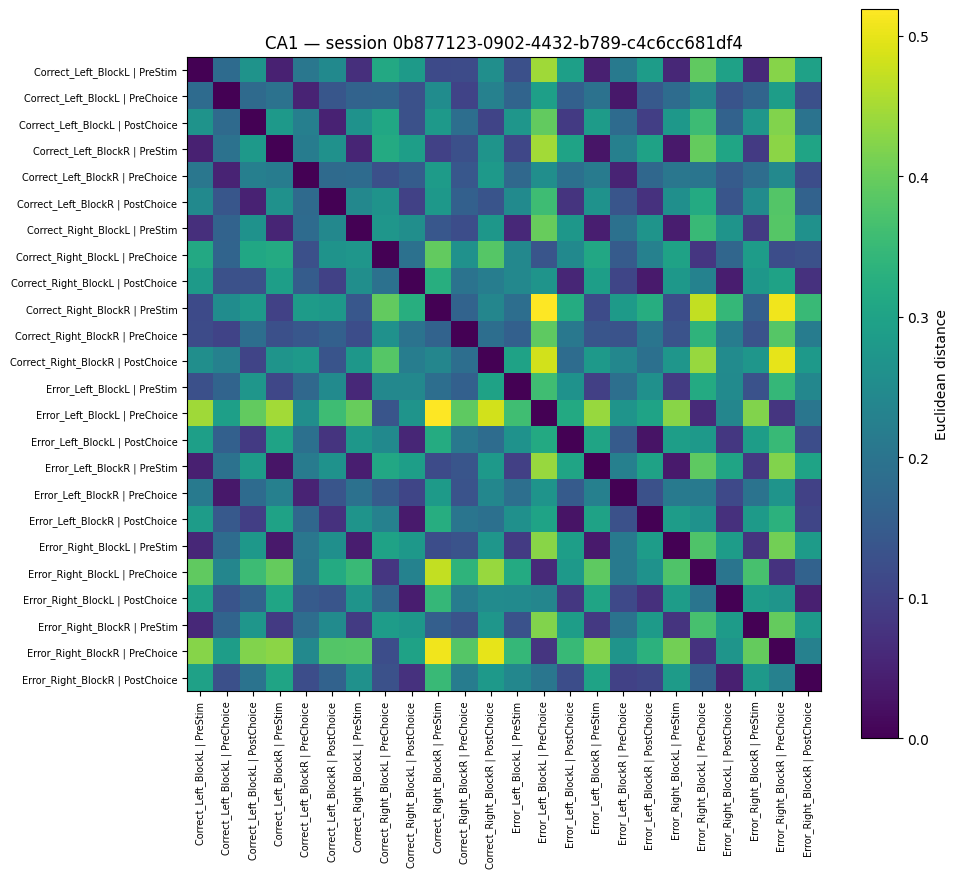

Session 523f8301-4f56-4faf-ab33-a9ff11331118: 24 / 24 trial types


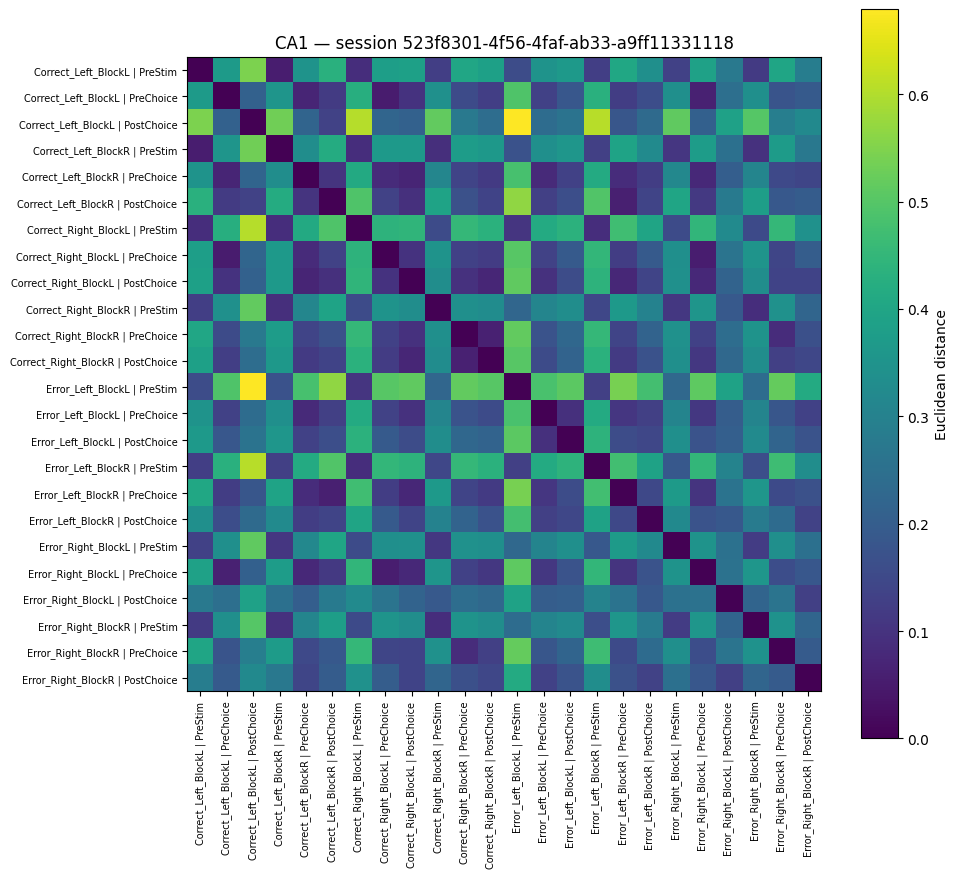

Session 8fbfa285-d721-4a1a-8c18-f36652c17909: 24 / 24 trial types


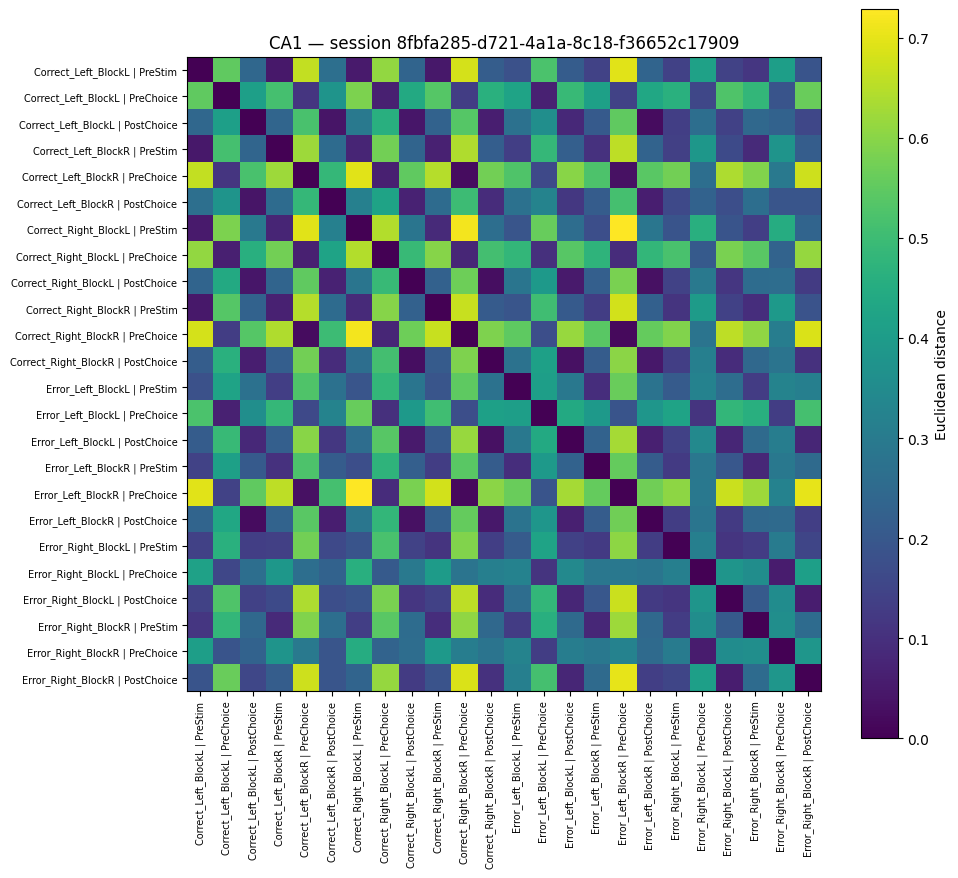

Session d151b391-e6e4-4daf-bd9c-191f4ad837b4: 24 / 24 trial types


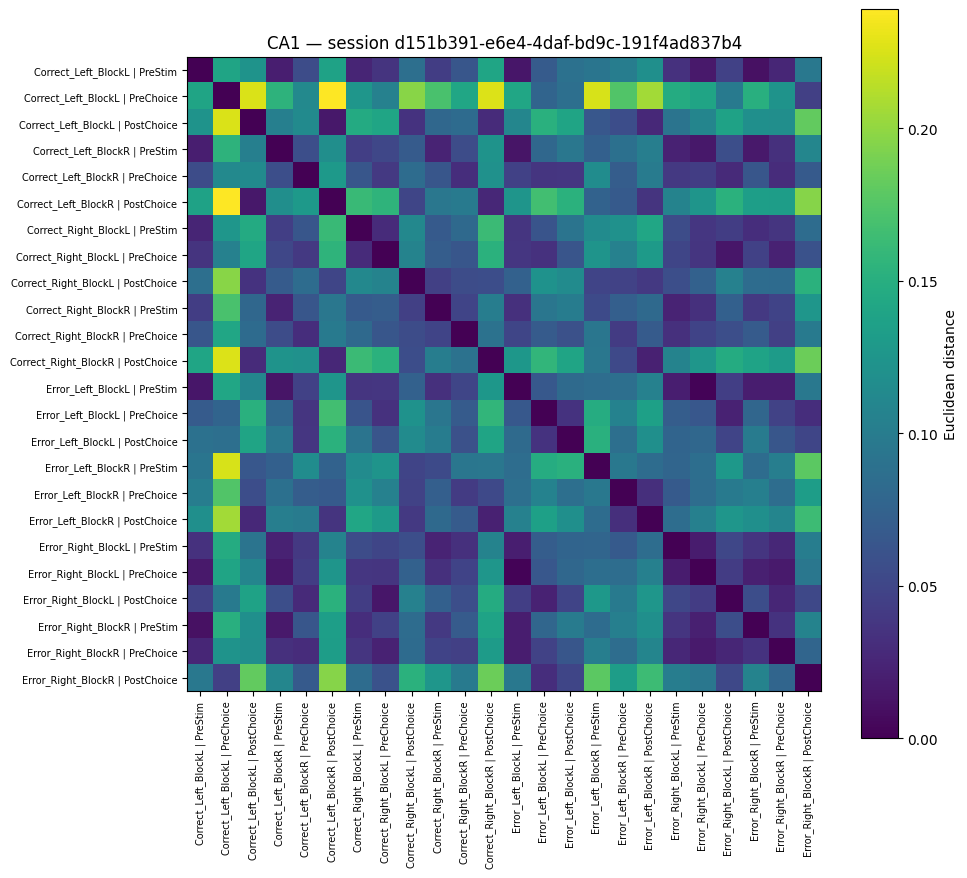

Session eeb27b45-5b85-4e5c-b6ff-f639ca5687de: 24 / 24 trial types


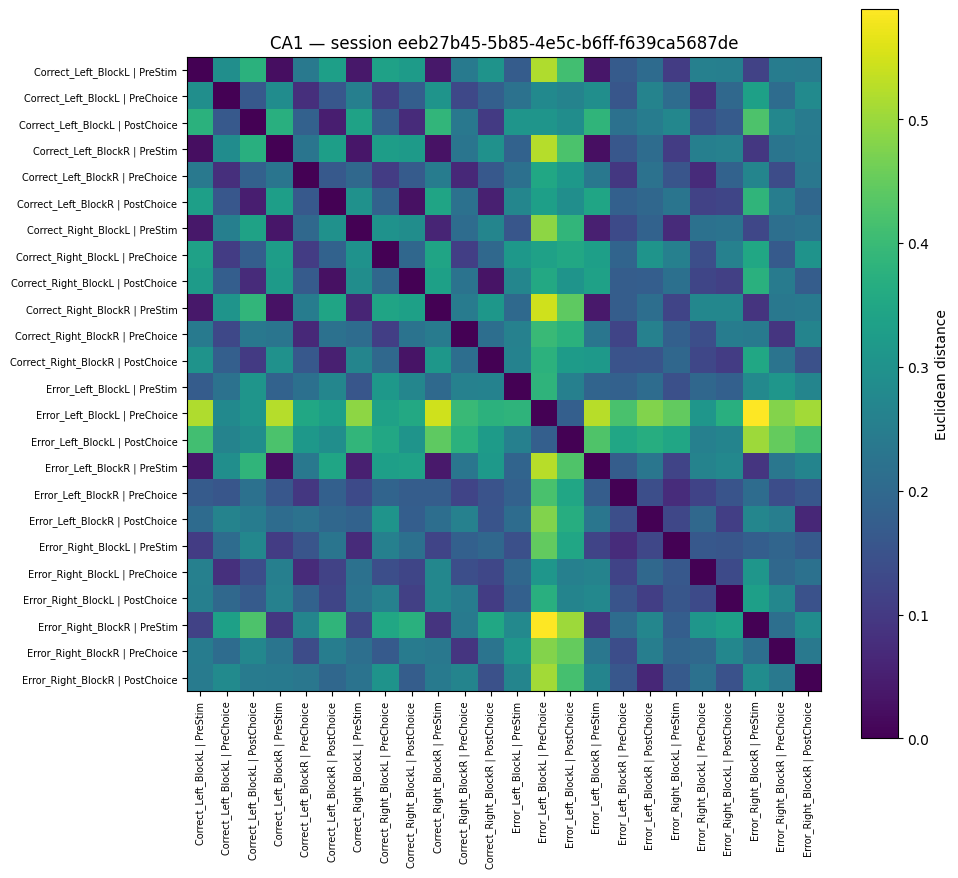

Session a6fe3779-2b77-4b66-a625-a6078720e412: 24 / 24 trial types


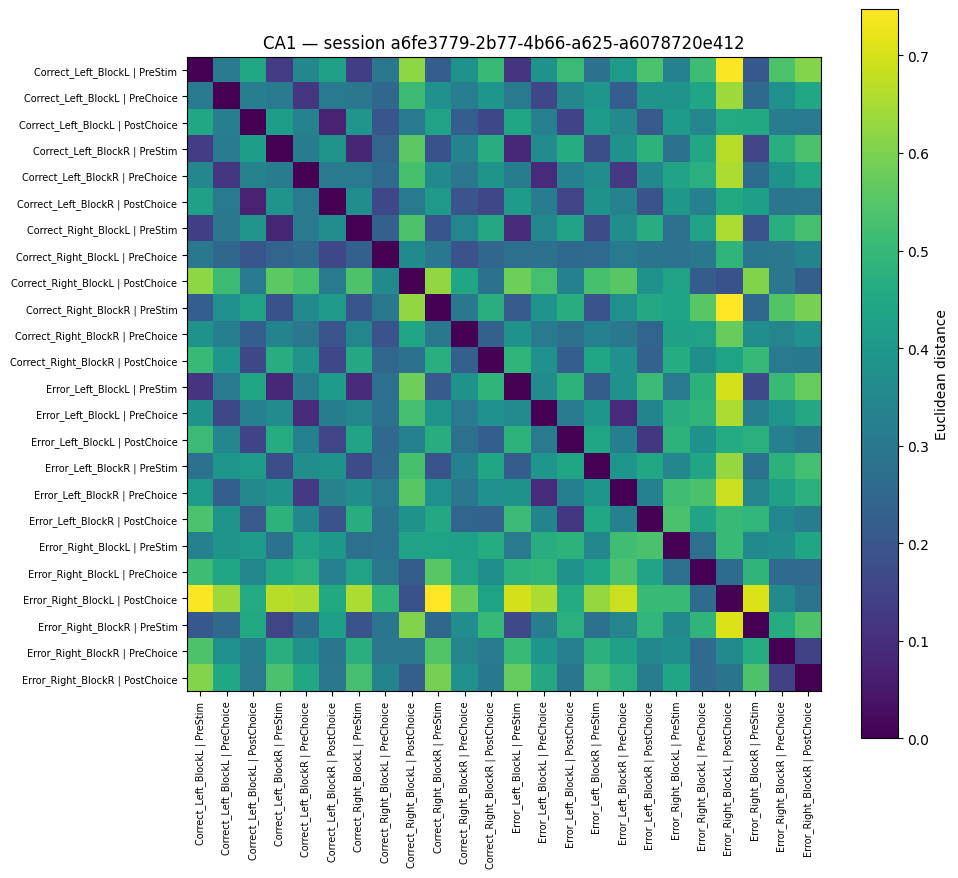

Session 4762e8ed-4d94-4fd7-9522-e927f5ffca74: 24 / 24 trial types


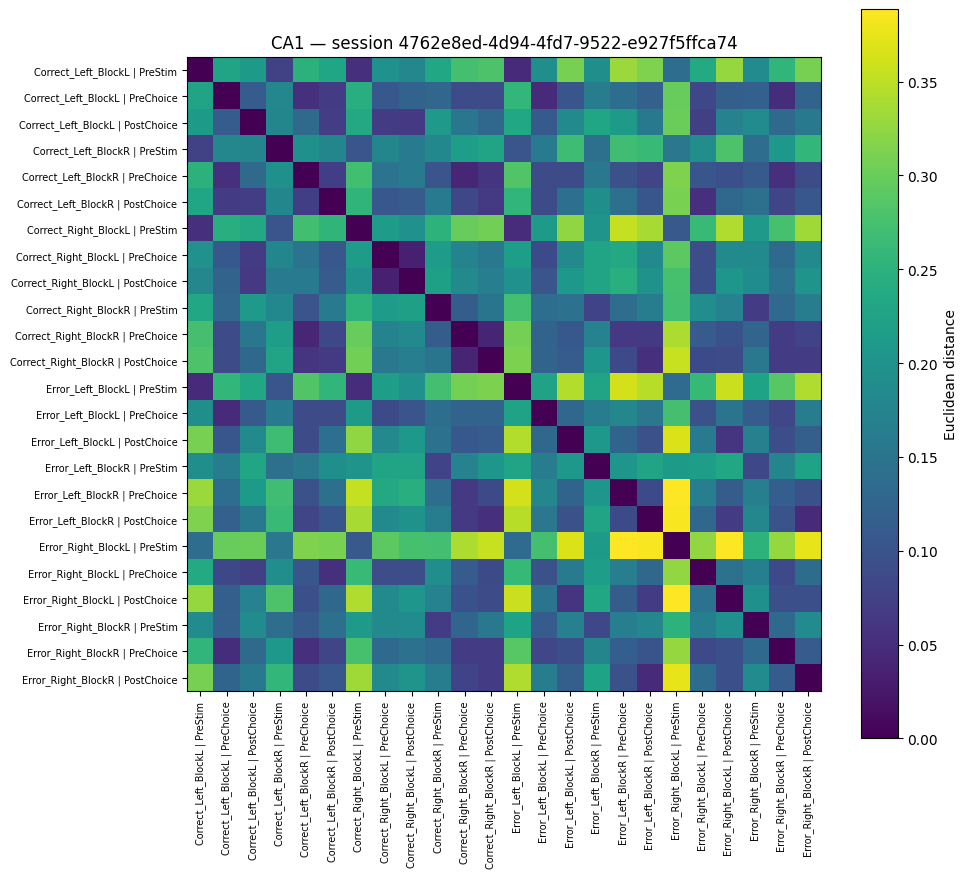

Session 1841cf1f-725d-499e-ab8e-7f6fc8c308b6: 24 / 24 trial types


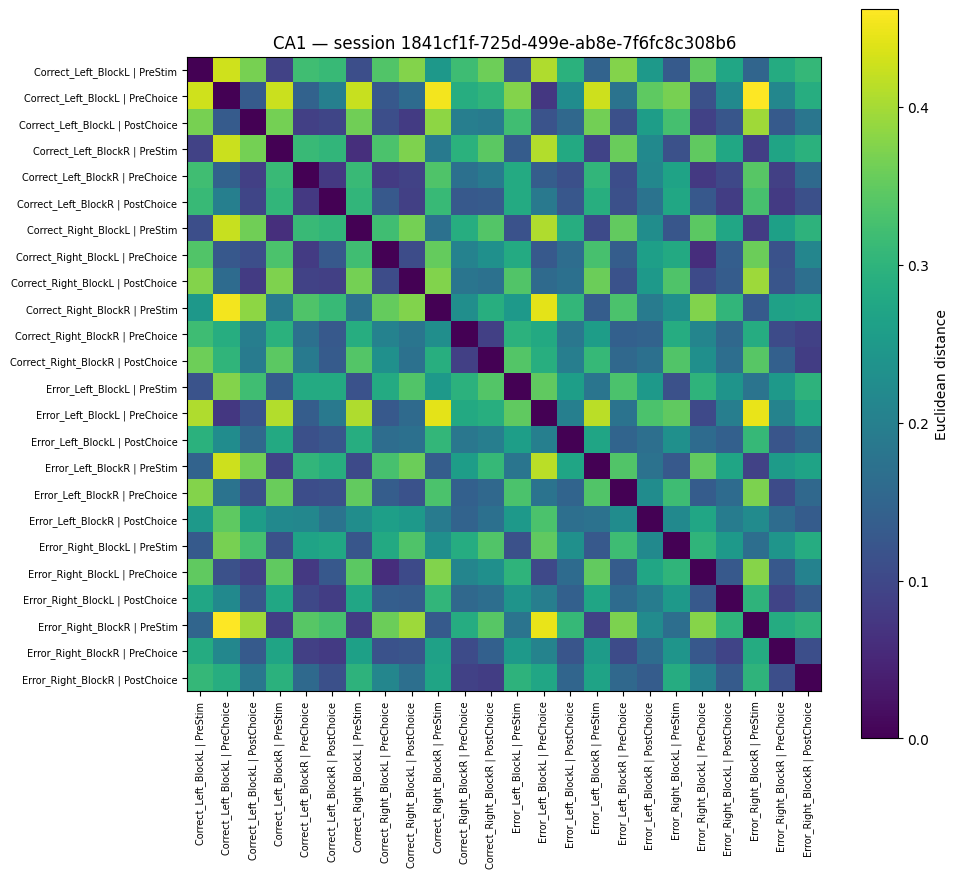

Session 69f42a9c-095d-4a25-bca8-61a9869871d3: 21 / 24 trial types


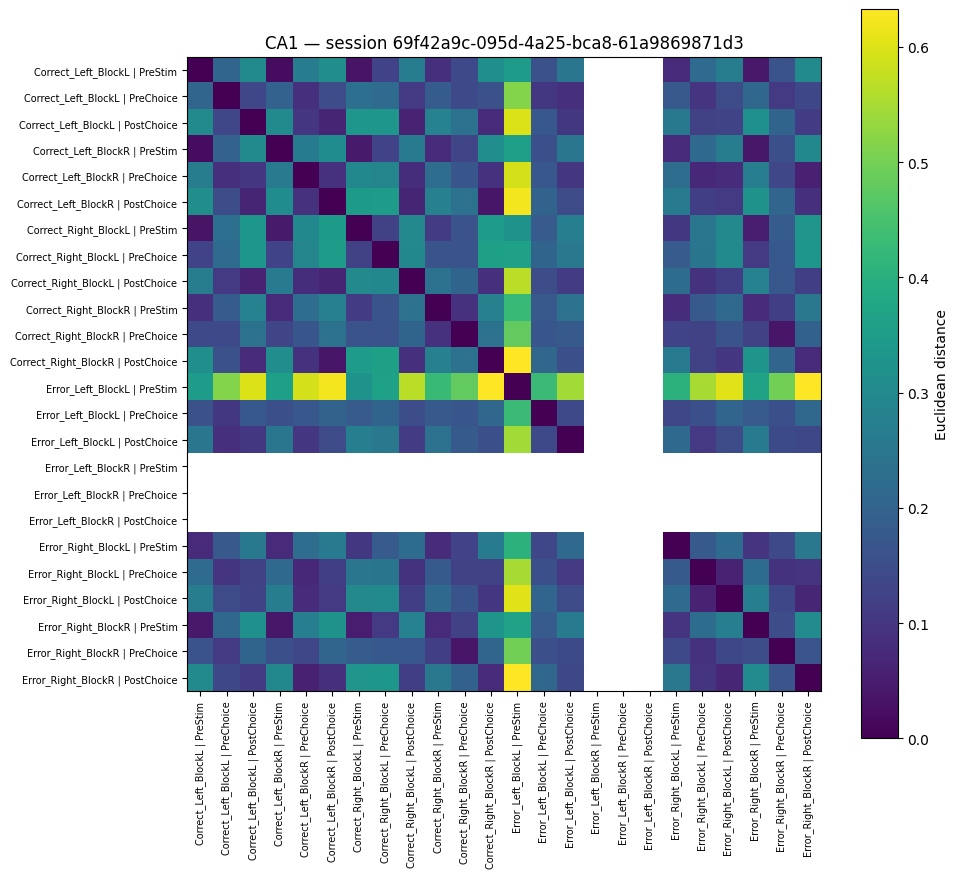

Session 3fded122-619c-4e65-aadd-d5420978d167: 24 / 24 trial types


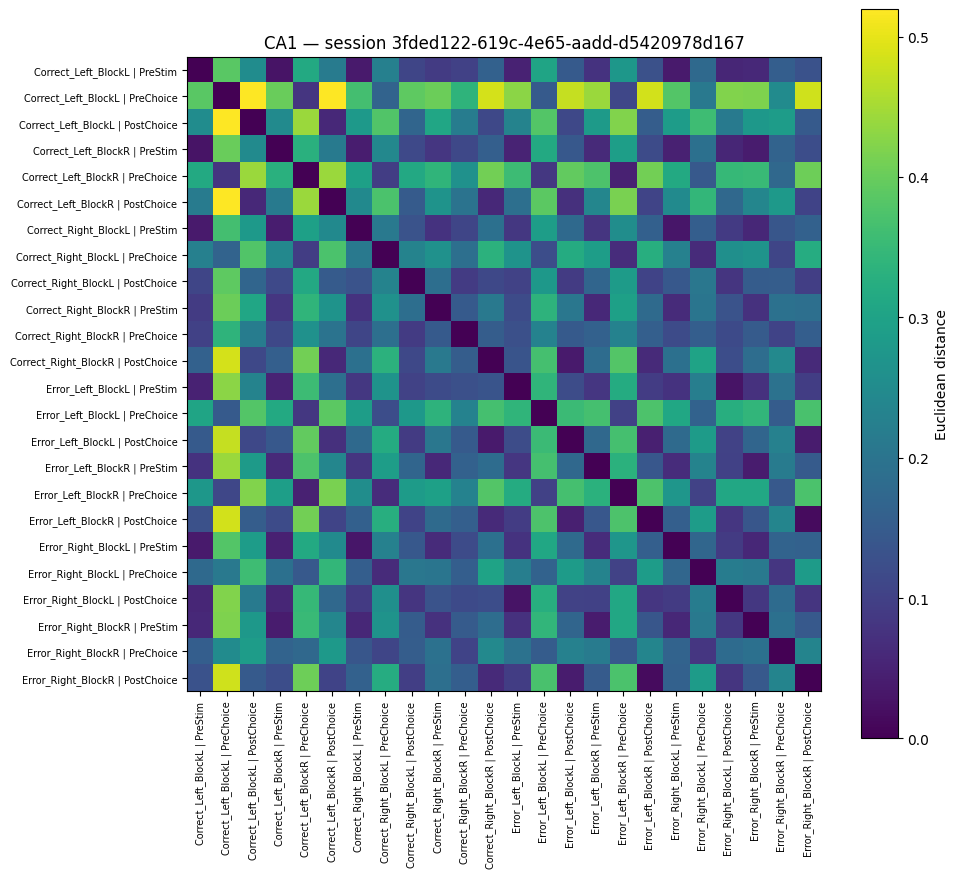

Session 0393f34c-a2bd-4c01-99c9-f6b4ec6e786d: 24 / 24 trial types


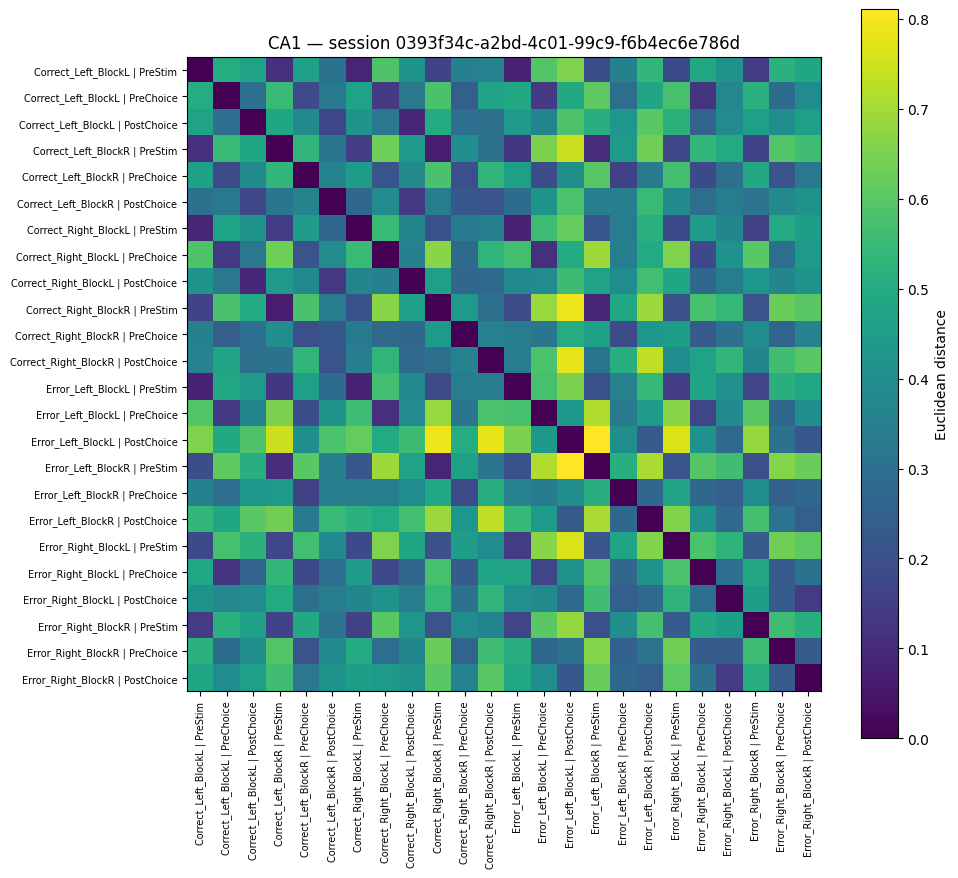

Session e9cf749b-85dc-4b59-834b-325cec608c48: 24 / 24 trial types


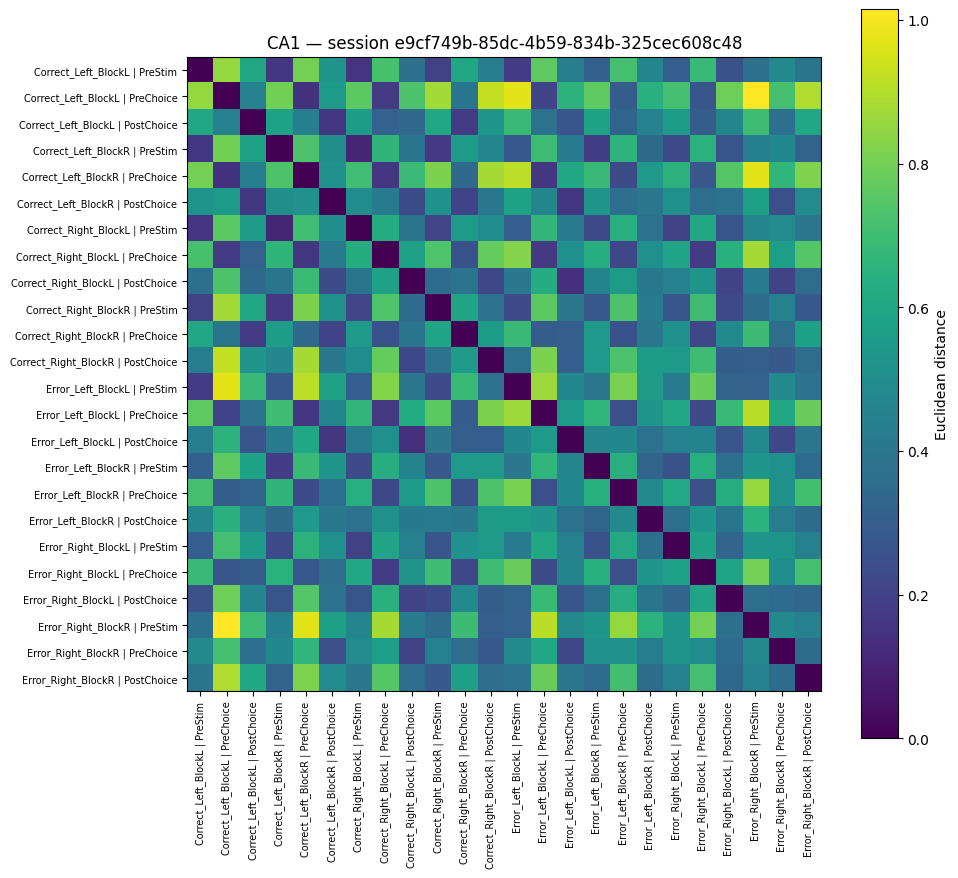

Session 61ed1a53-2f33-4a83-82ba-ec7dfa65bf60: 24 / 24 trial types


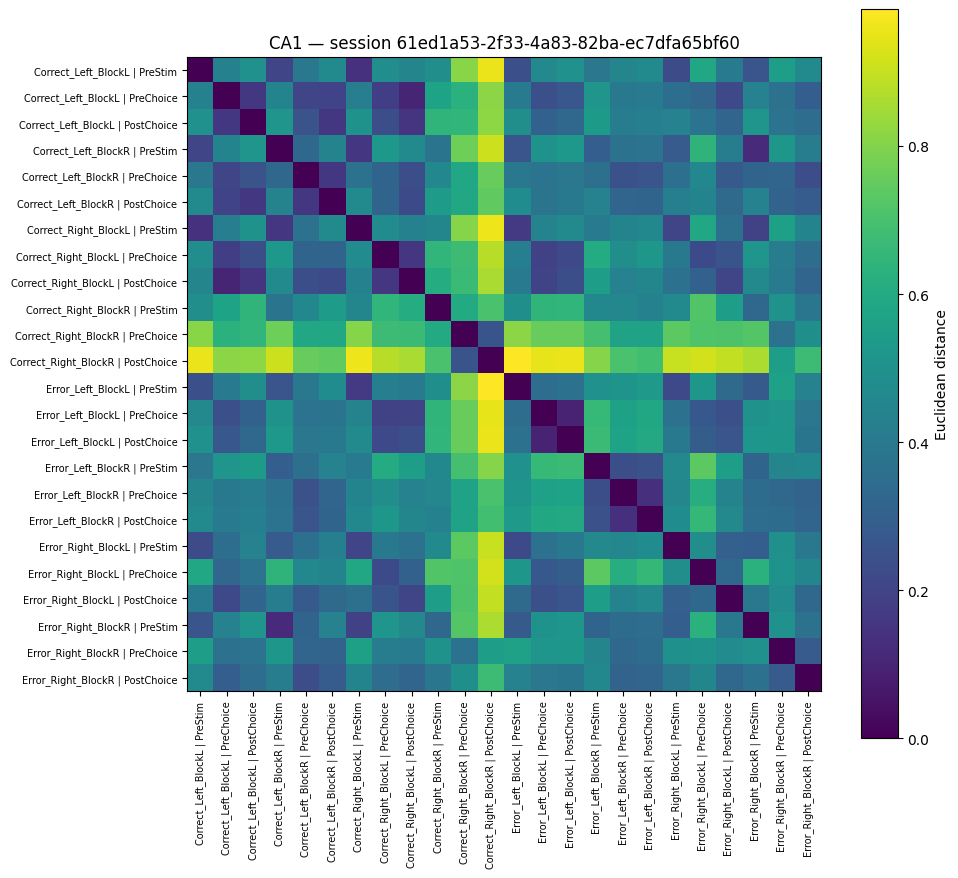

Session 27bac116-ea57-4512-ad35-714a62d259cd: 24 / 24 trial types


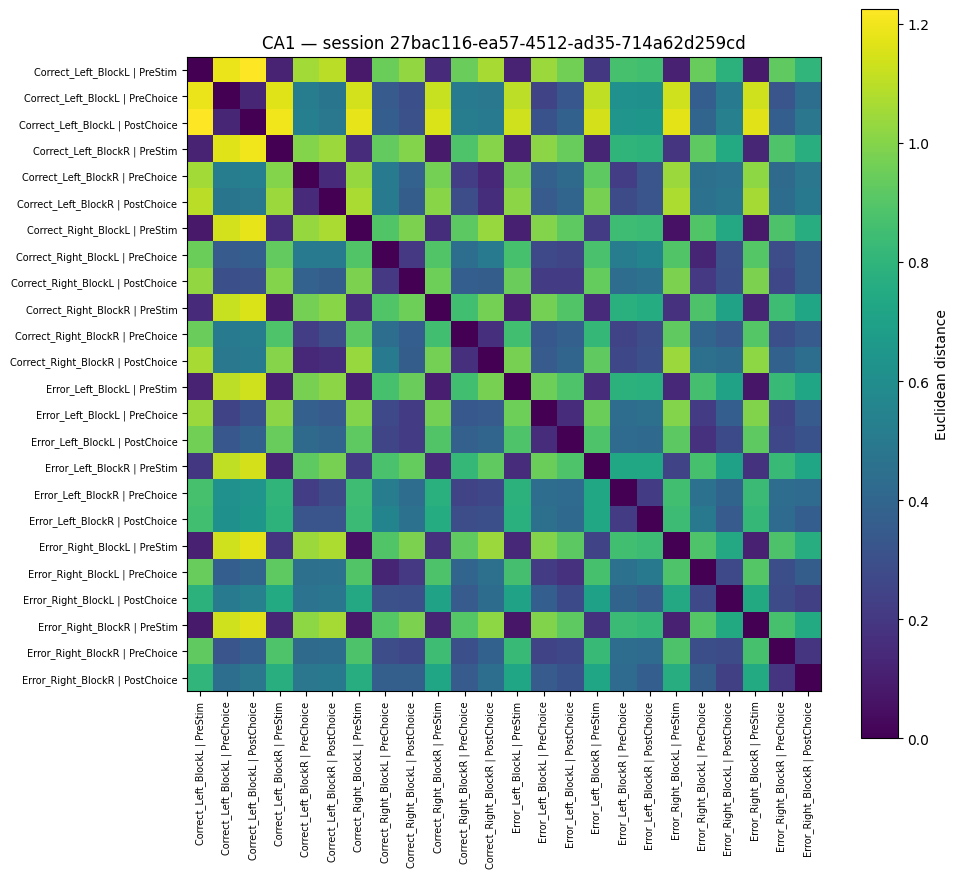

Session febb430e-2d50-4f83-87a0-b5ffbb9a4943: 21 / 24 trial types


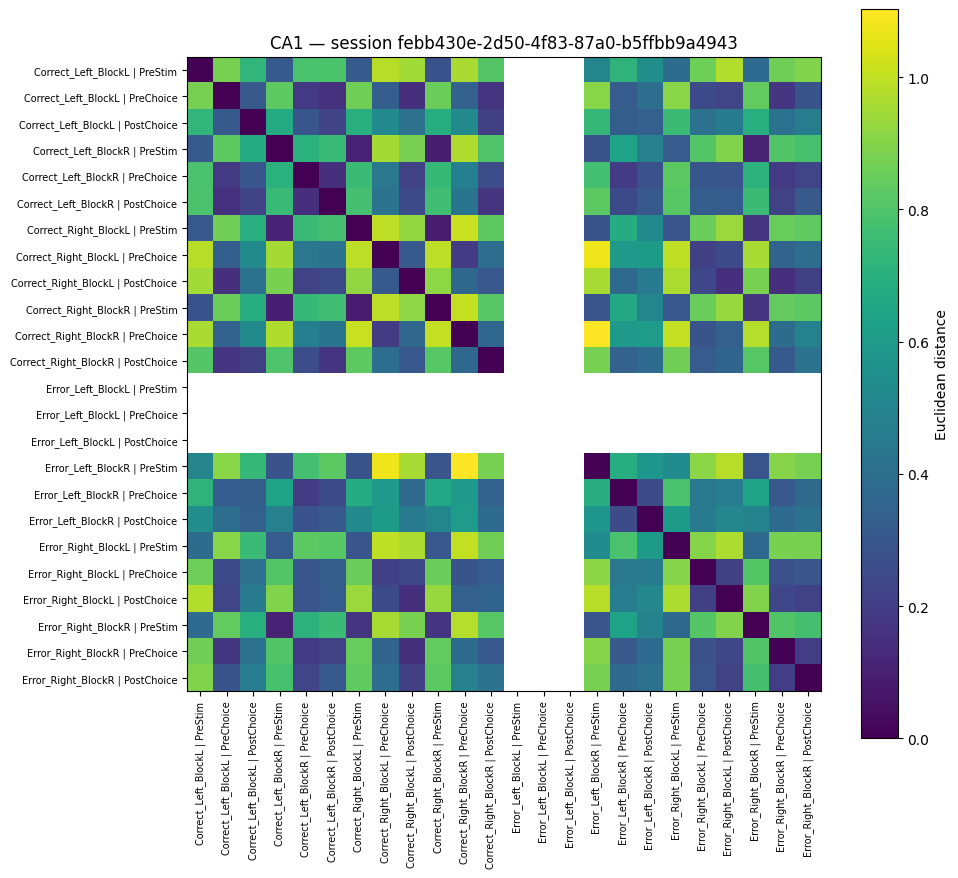

Session 64f4afa4-ec5f-4ad6-ab28-415a9a8098ed: 24 / 24 trial types


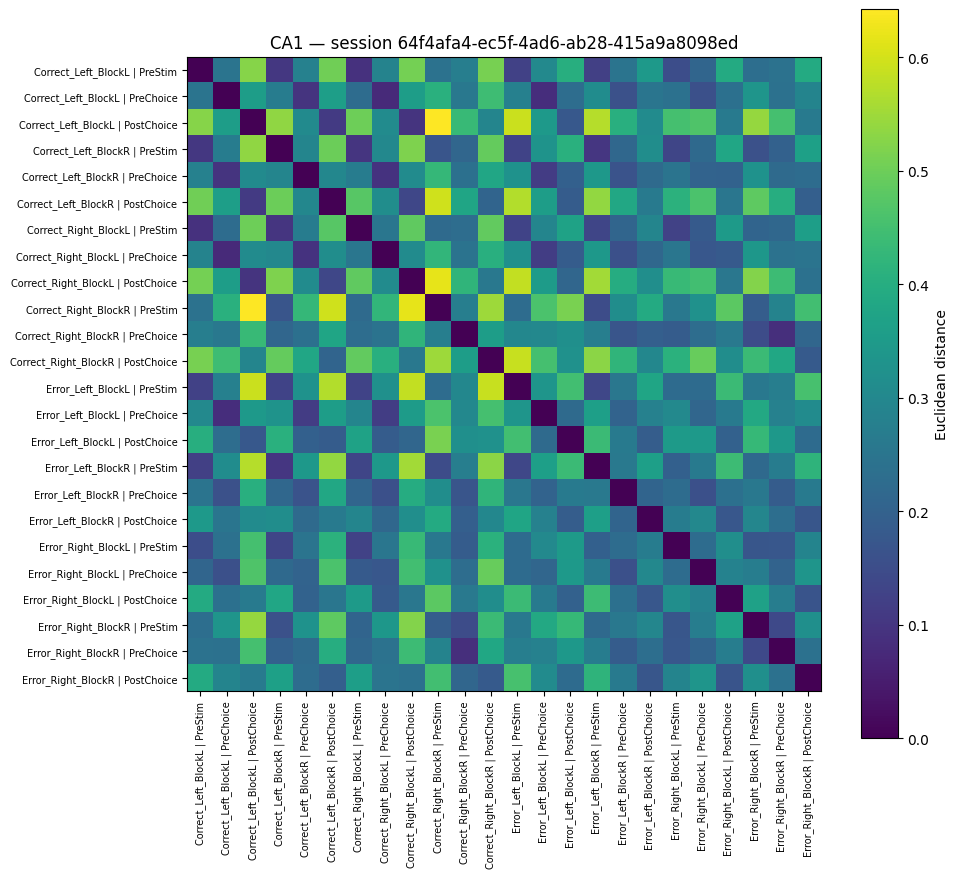

Session 81f0087b-2bd1-4e48-8e86-e8206aee3d9d: 21 / 24 trial types


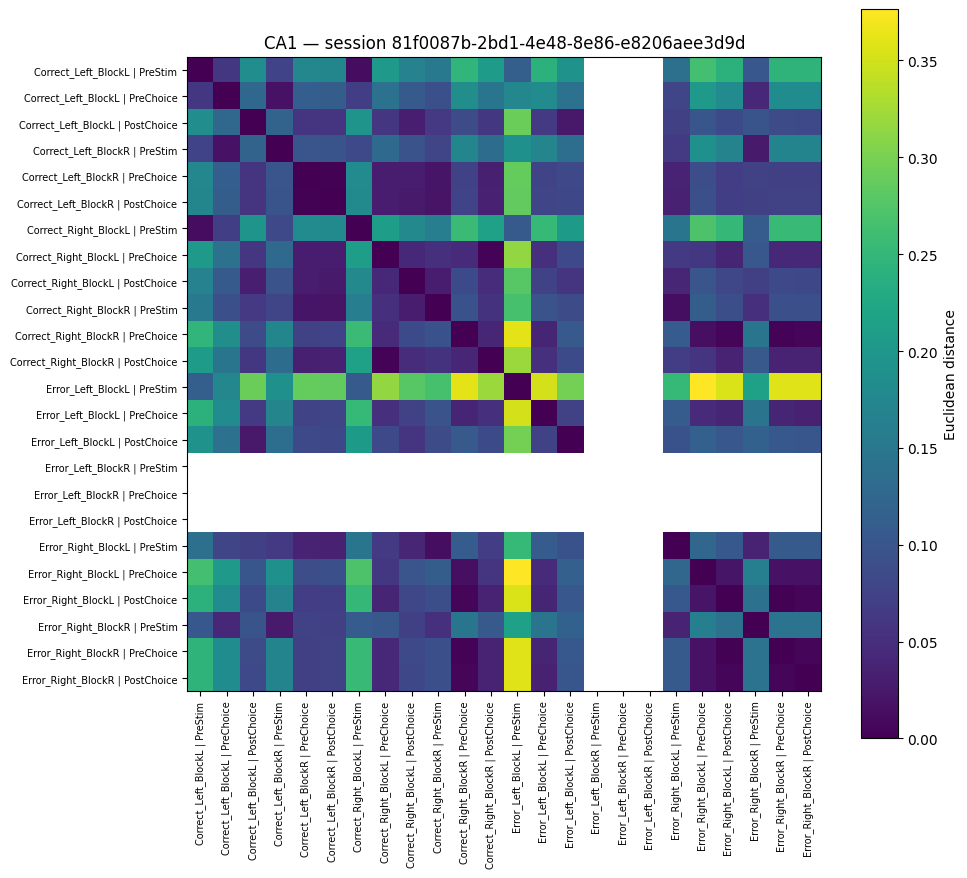

Session 84fd7fa3-6c2d-4233-b265-46a427d3d68d: 24 / 24 trial types


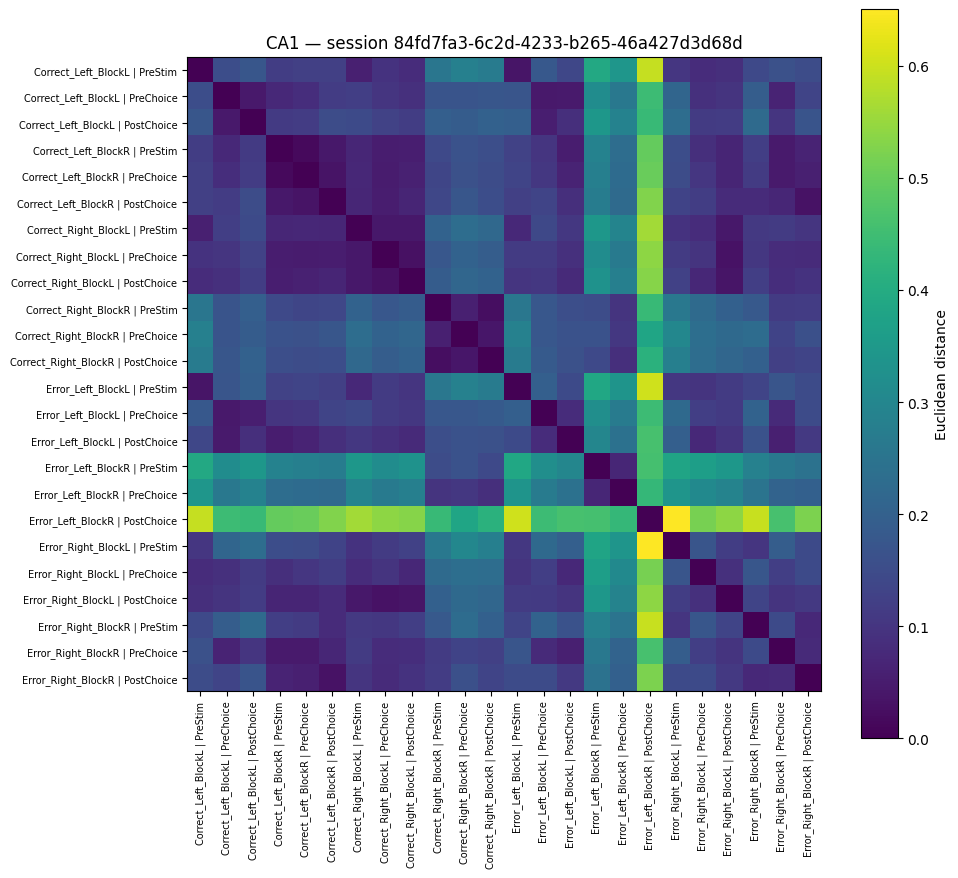

Session c536b0a9-b710-43c3-ba2c-5a0cccf98ec2: 24 / 24 trial types


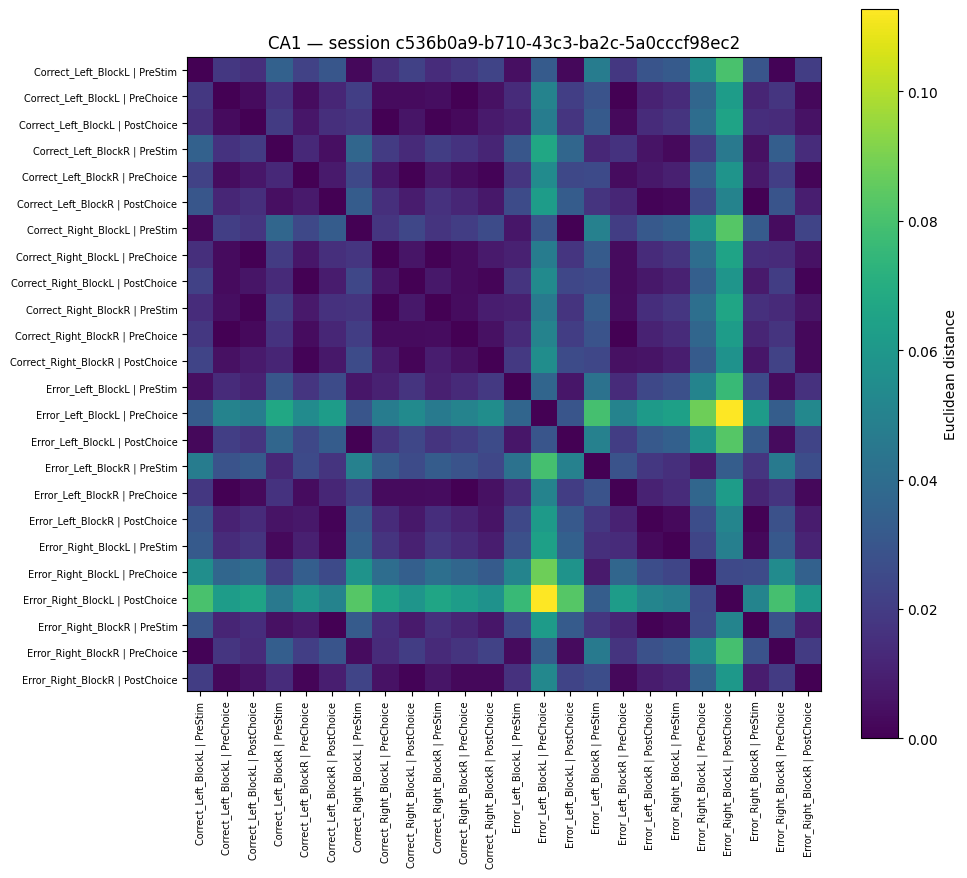

Session 80f6ffdd-f692-450f-ab19-cd6d45bfd73e: 24 / 24 trial types


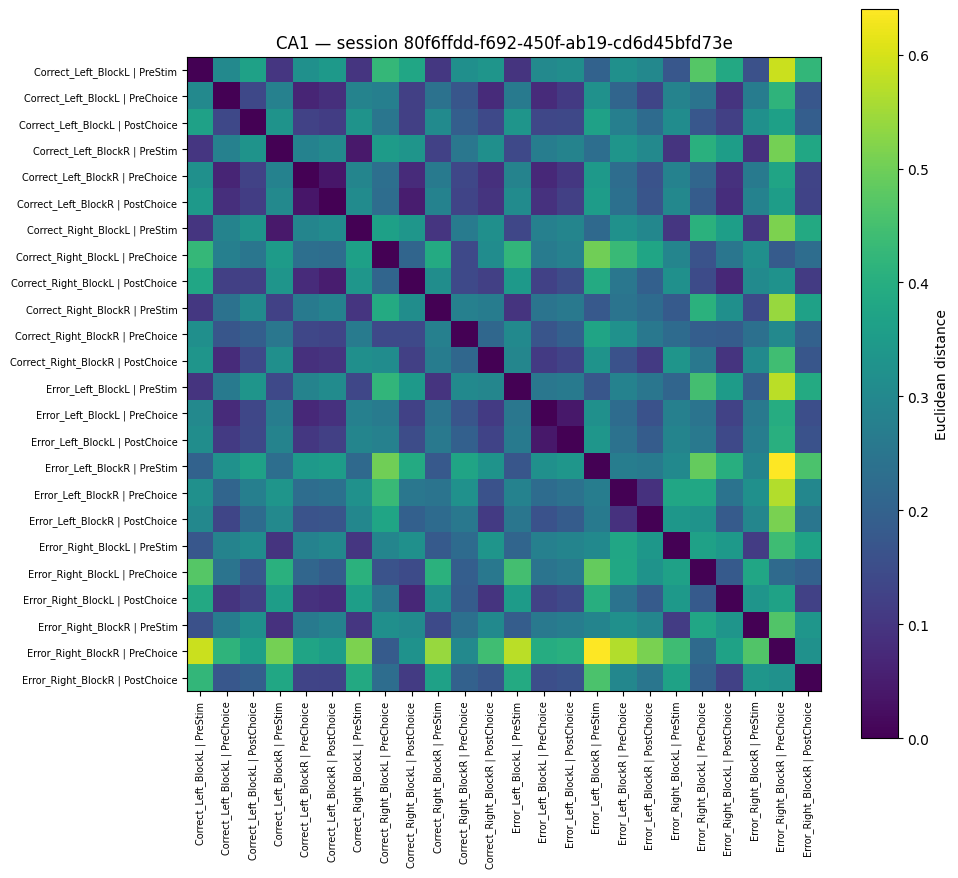

Session 55001cb4-e10f-4657-9760-1228b590a69c: 24 / 24 trial types


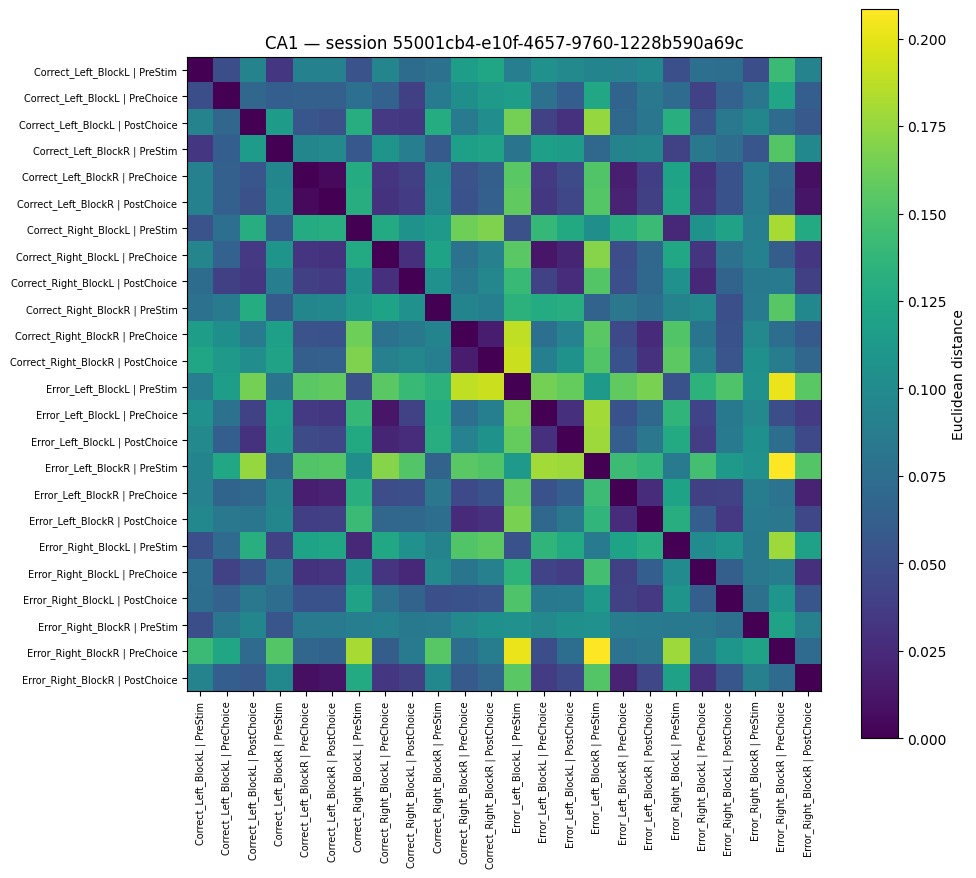

Session 6d24683c-da42-4610-baf0-7ceee7014394: 24 / 24 trial types


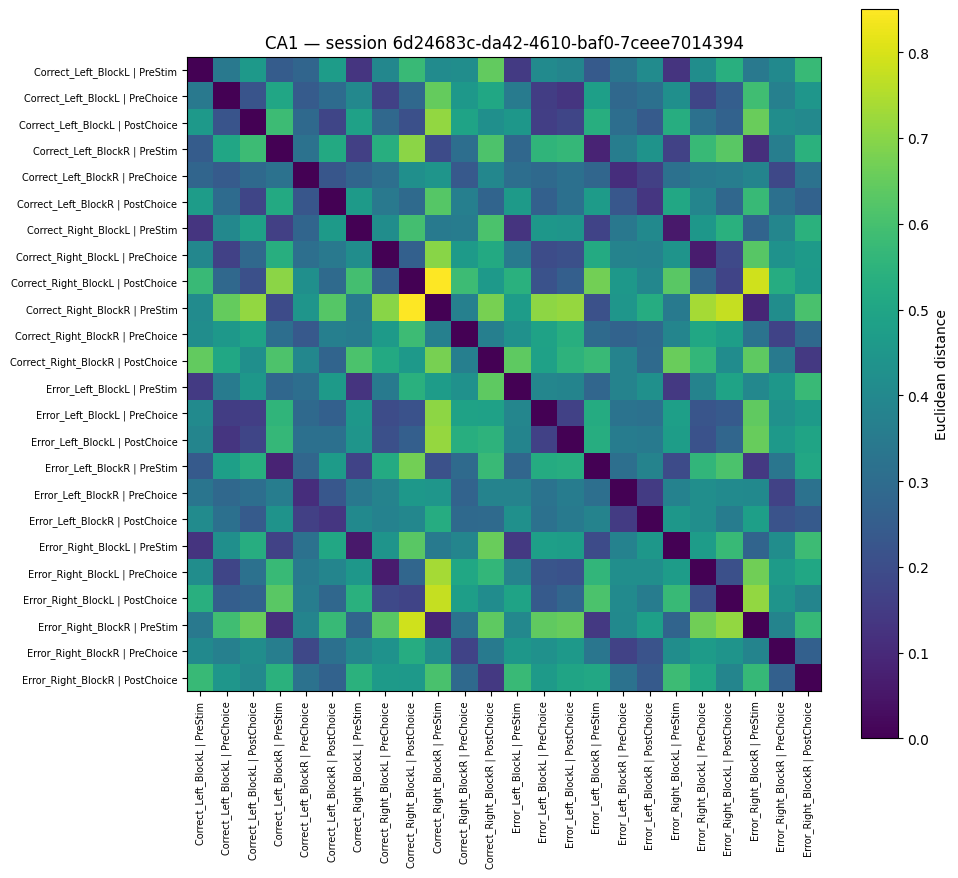

Session df7d2ca7-068b-4df2-9782-8f6bb7d67f18: 24 / 24 trial types


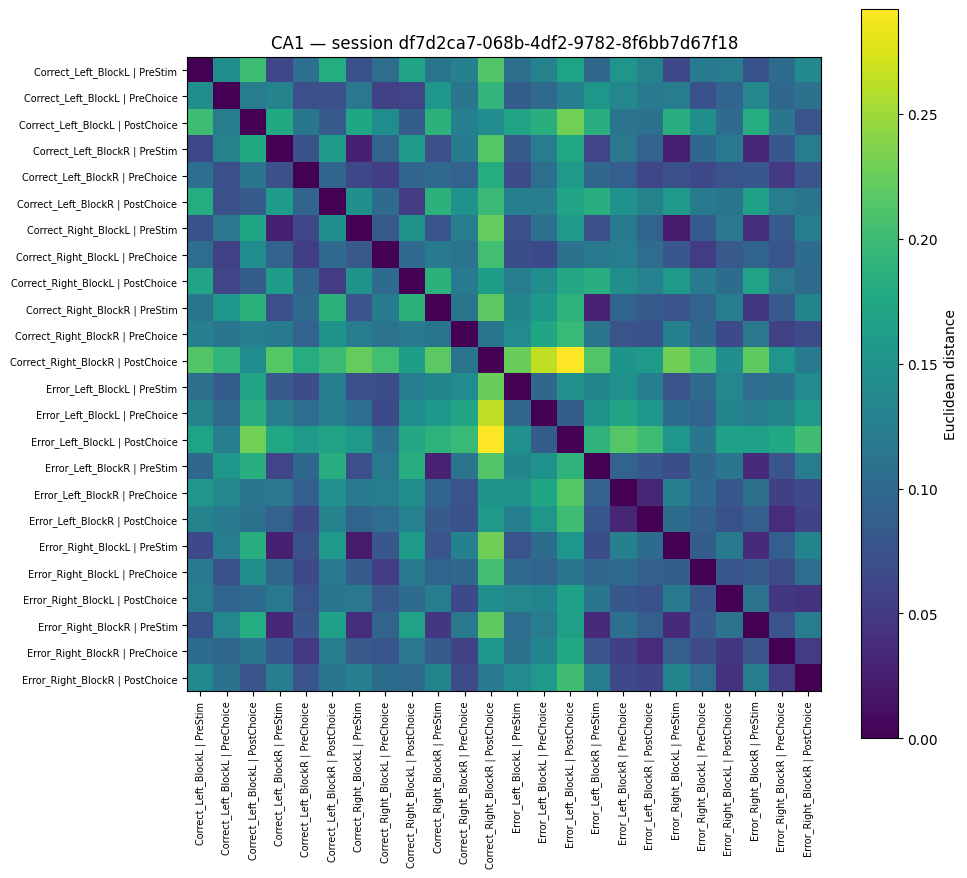

Session 9338f8bb-e097-46d8-81b4-7f37beb4d308: 24 / 24 trial types


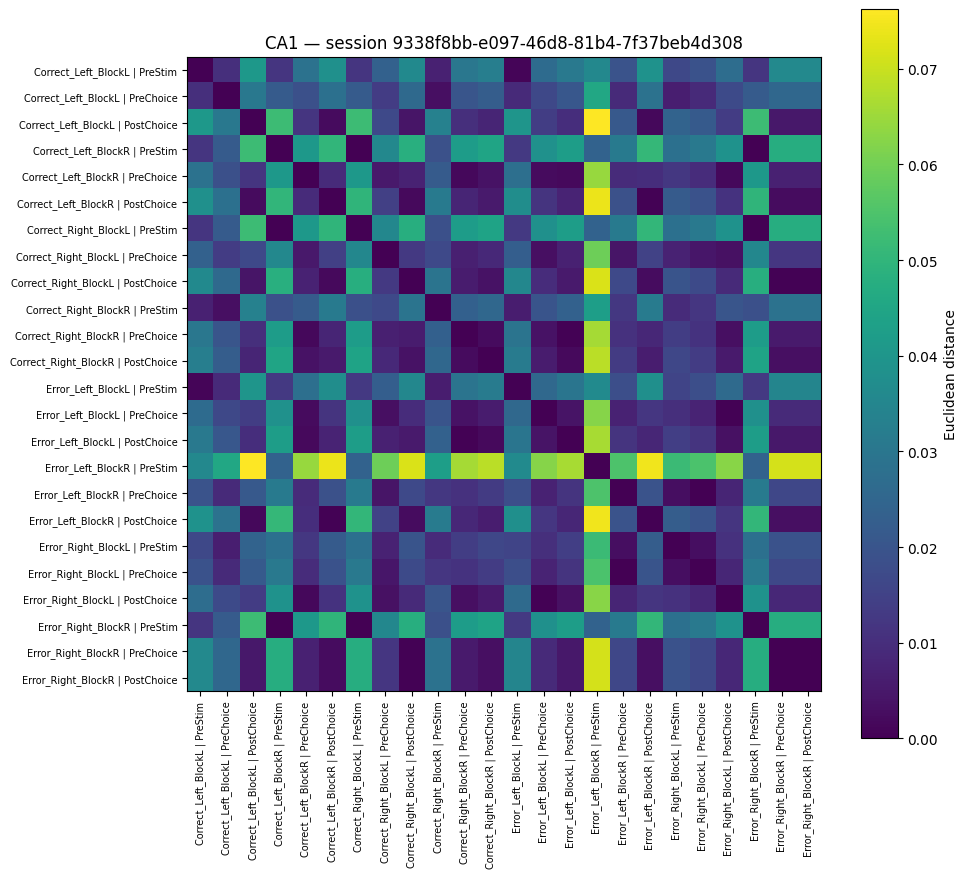

Session eb99c2c8-e614-4240-931b-169bed23e9f5: 24 / 24 trial types


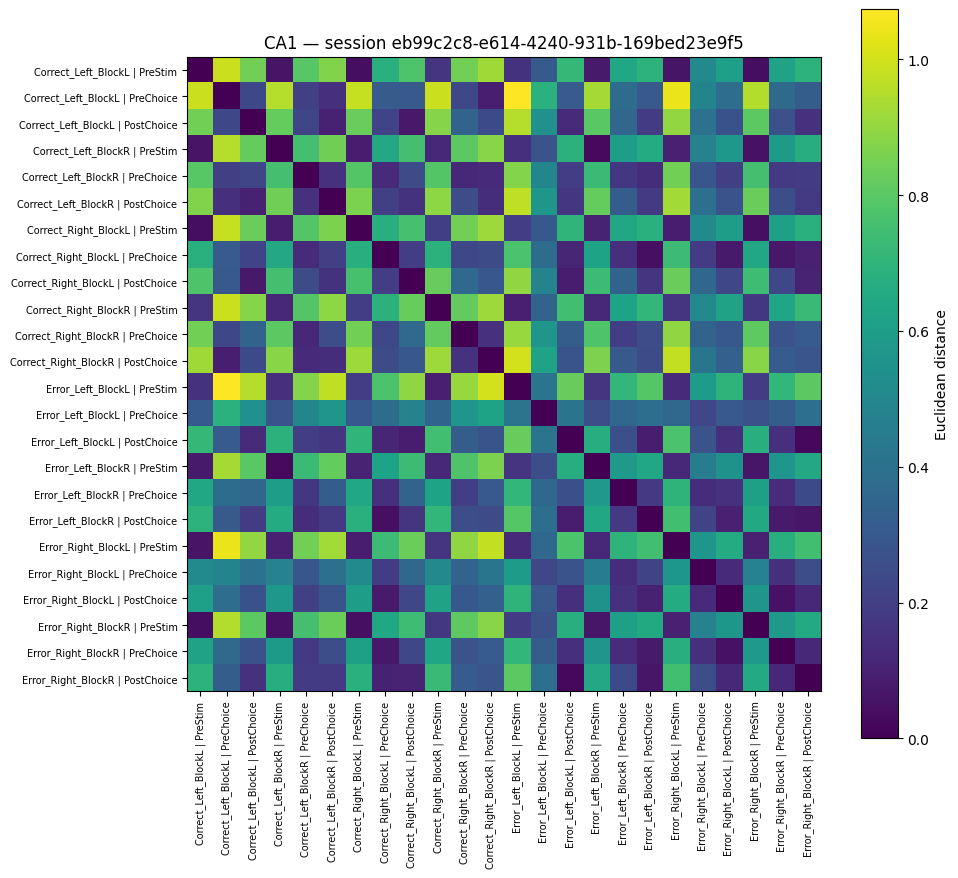

Session 531423f6-d36d-472b-8234-c8f7b8293f79: 24 / 24 trial types


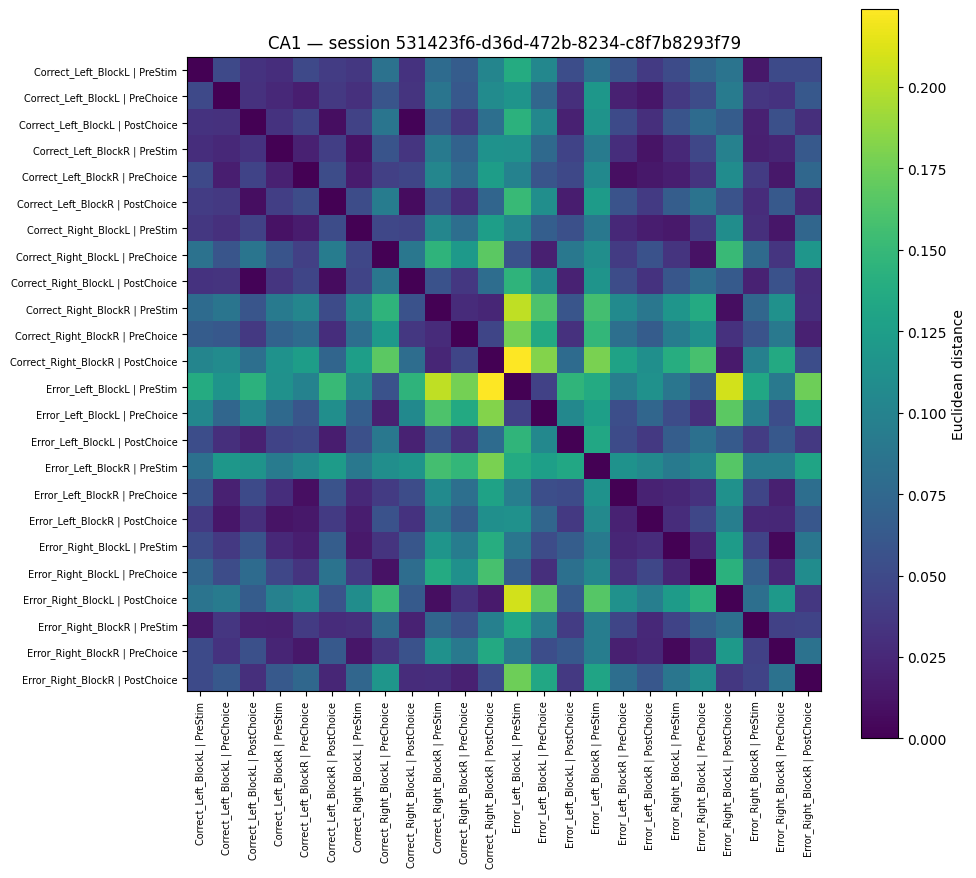

Session a63a7248-9393-478b-9478-64f421ef5eb8: 24 / 24 trial types


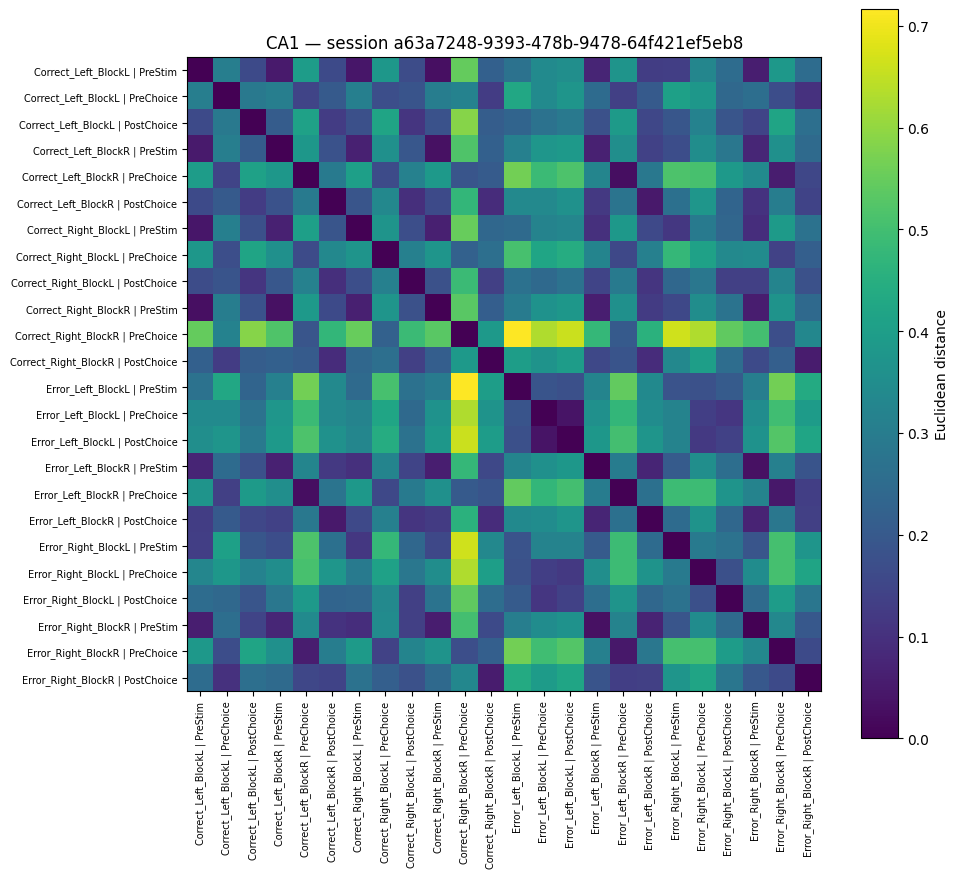

Session 0aafb6f1-6c10-4886-8f03-543988e02d9e: 24 / 24 trial types


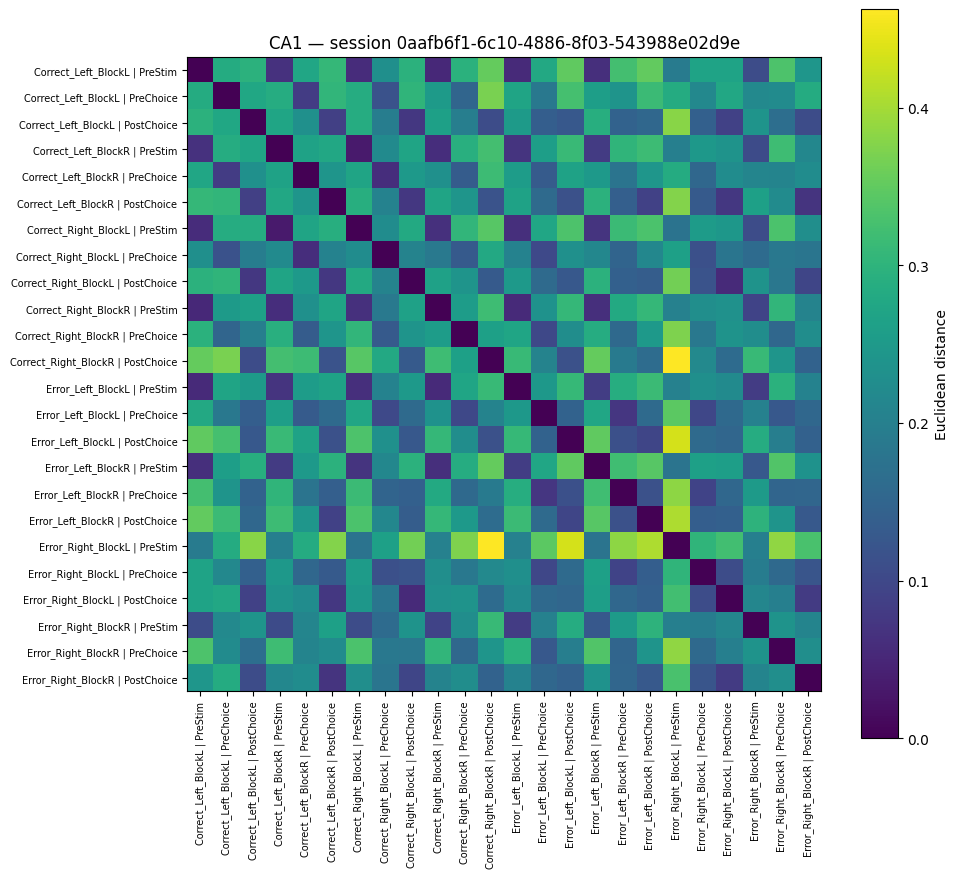

Session 8169d556-f994-4735-b4c8-f7c85ddc39b0: 21 / 24 trial types


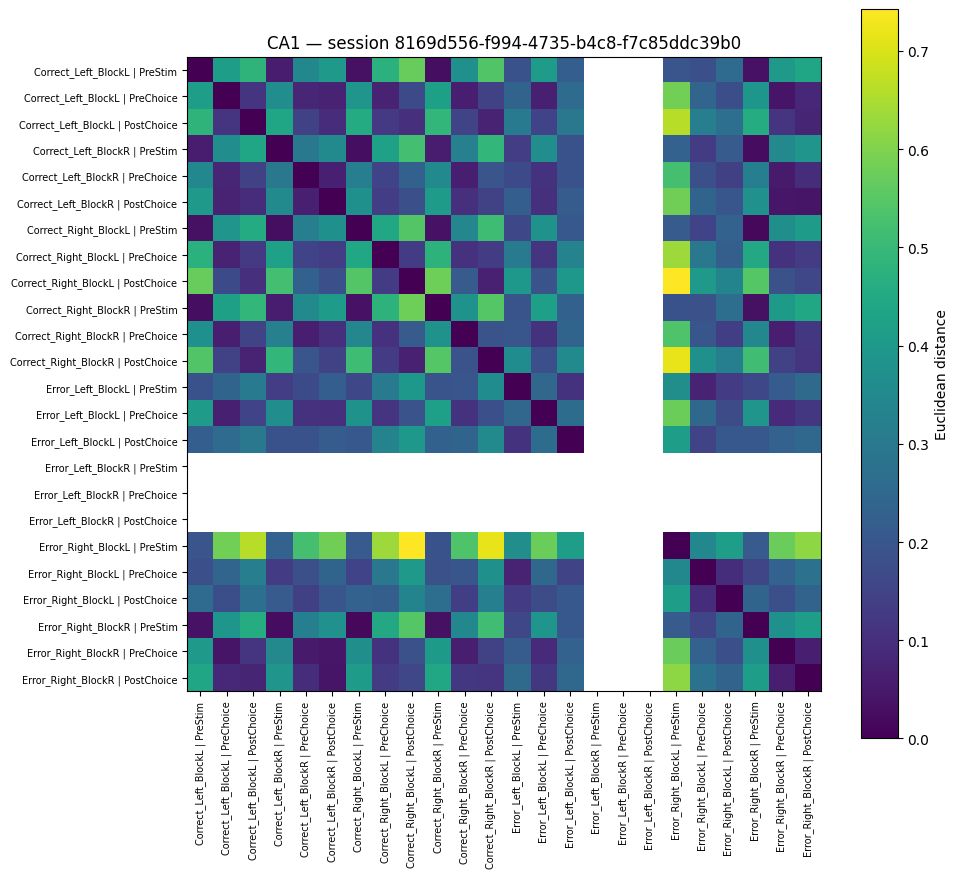

Session 12c0f3a9-518e-4dac-9651-5d95c2b4730f: 21 / 24 trial types


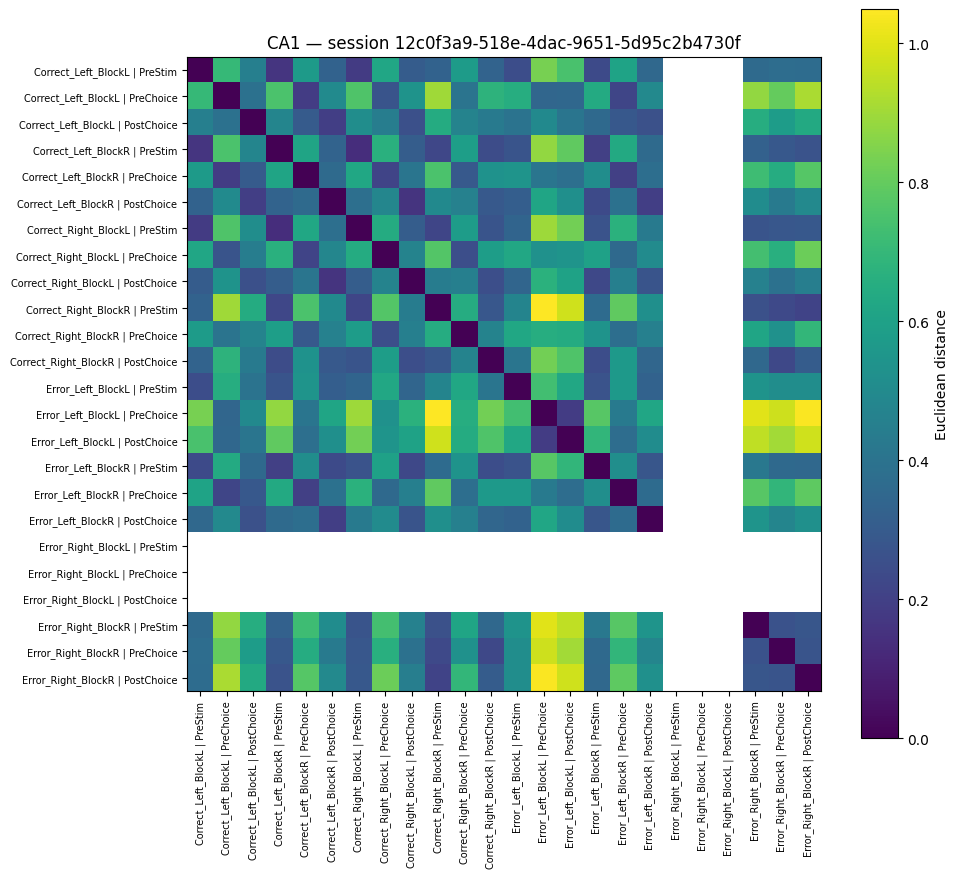

Session f9d8aacd-b2a0-49f2-bd71-c2f5aadcfdd1: 24 / 24 trial types


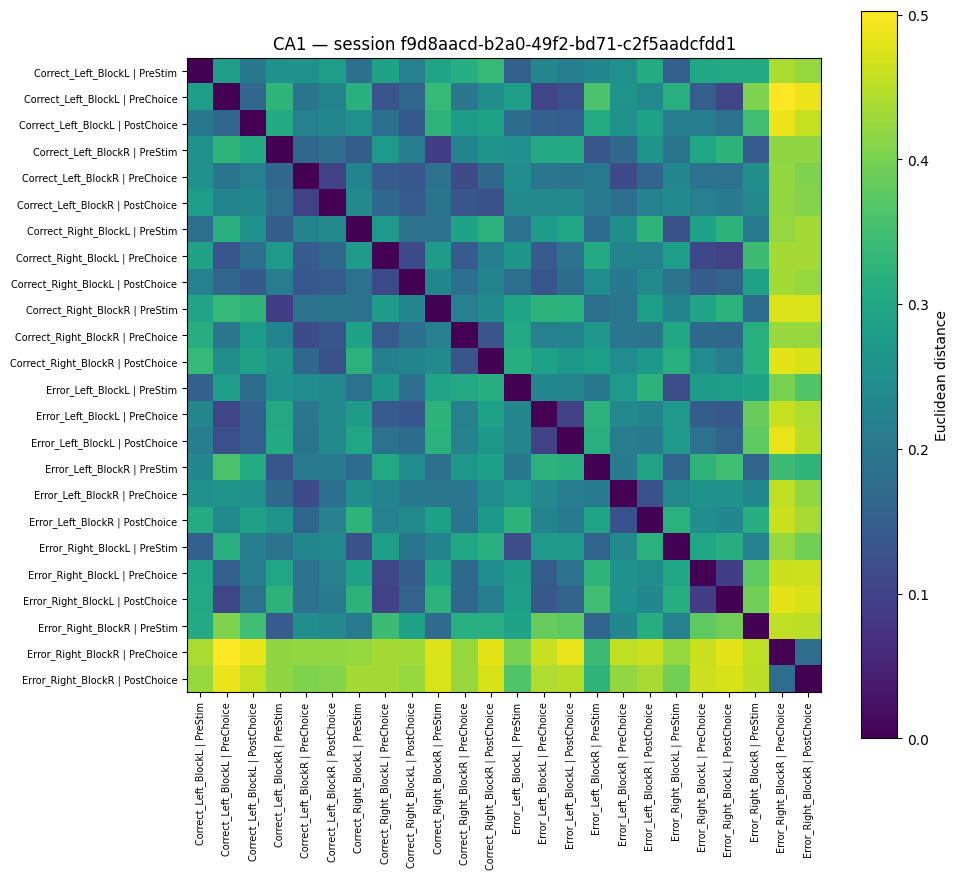

Session e55266c7-eb05-47bb-b263-1cc08dc3c00c: 24 / 24 trial types


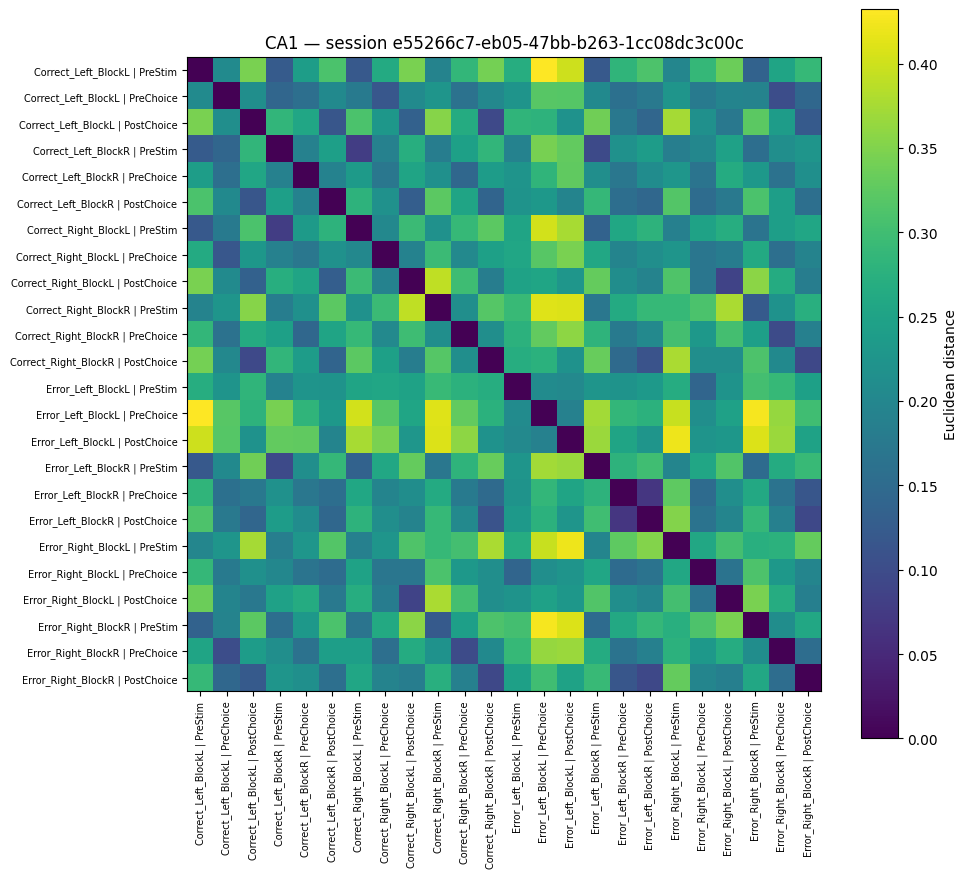

Session 0f306cdc-878a-4ea0-9e91-b97736731637: 24 / 24 trial types


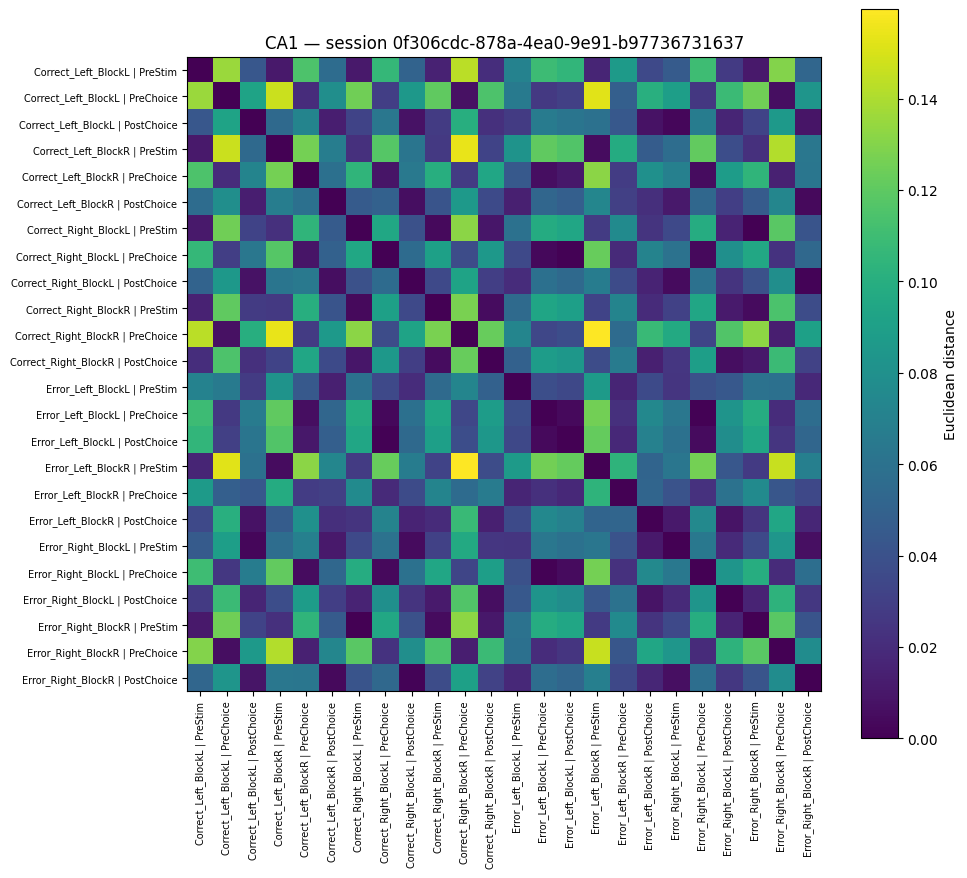

Session 7be00744-2e27-4062-8f56-3969e24e9990: 24 / 24 trial types


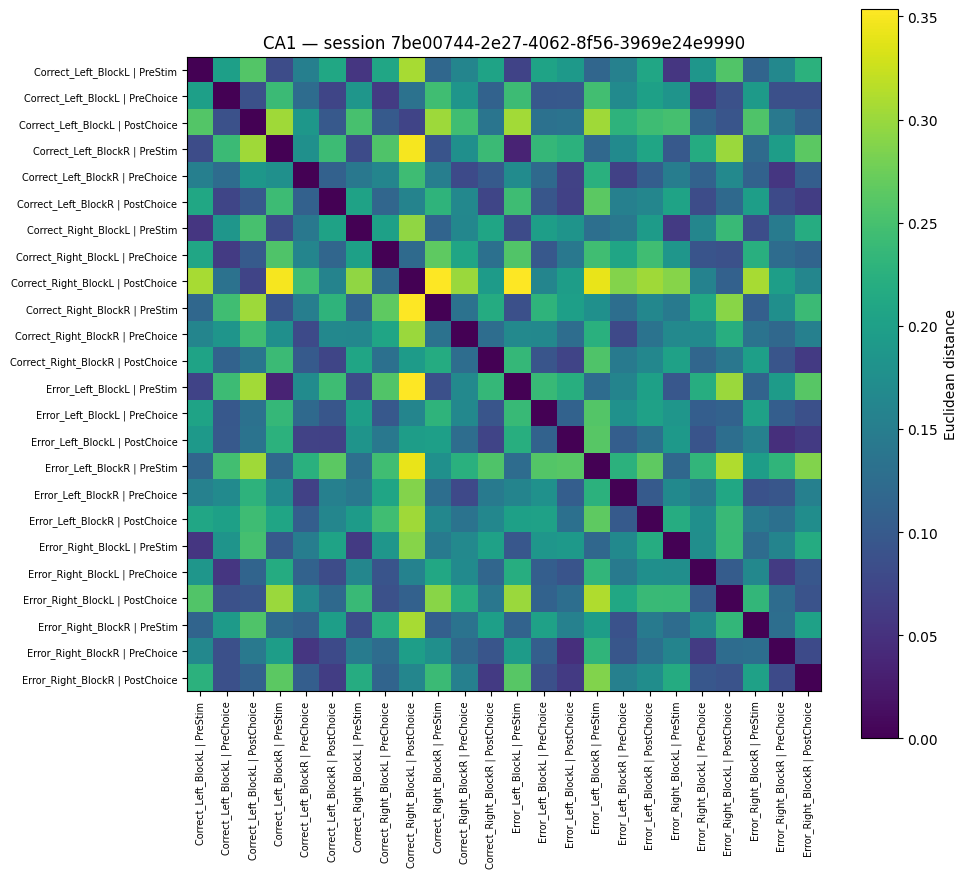

Session 07c79864-6fff-4e72-9fce-1c982e3457f9: 21 / 24 trial types


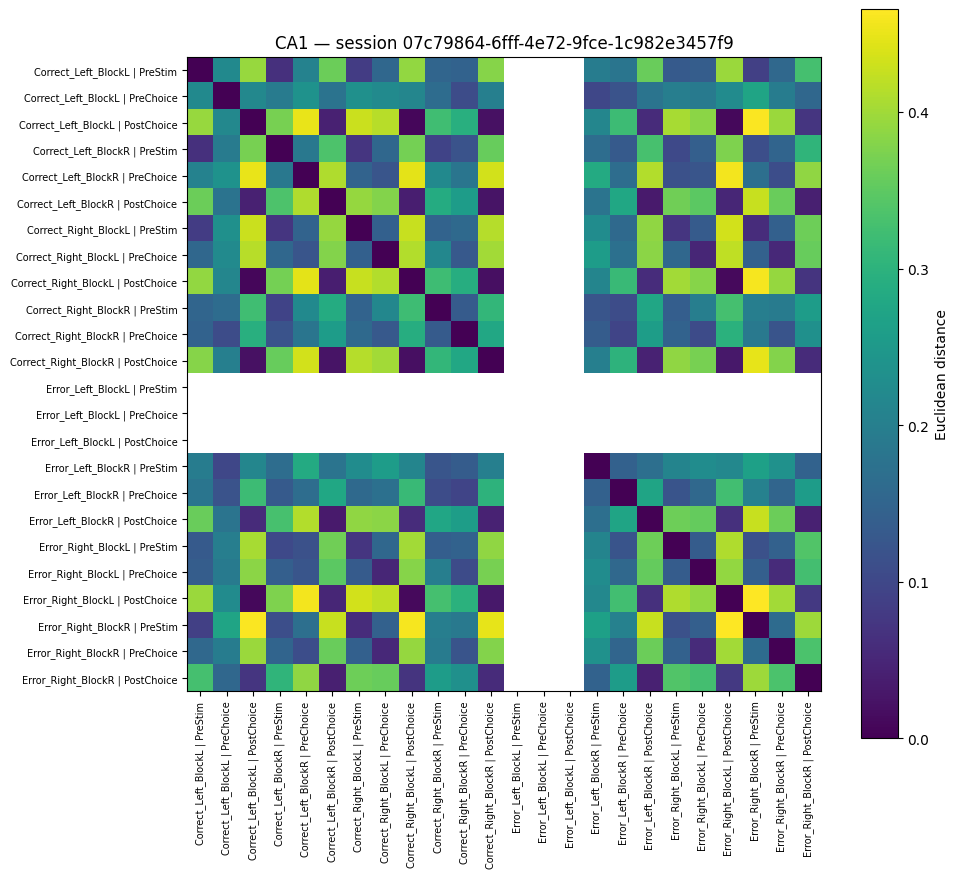

Session c4f6665f-8be5-476b-a6e8-d81eeae9279d: 24 / 24 trial types


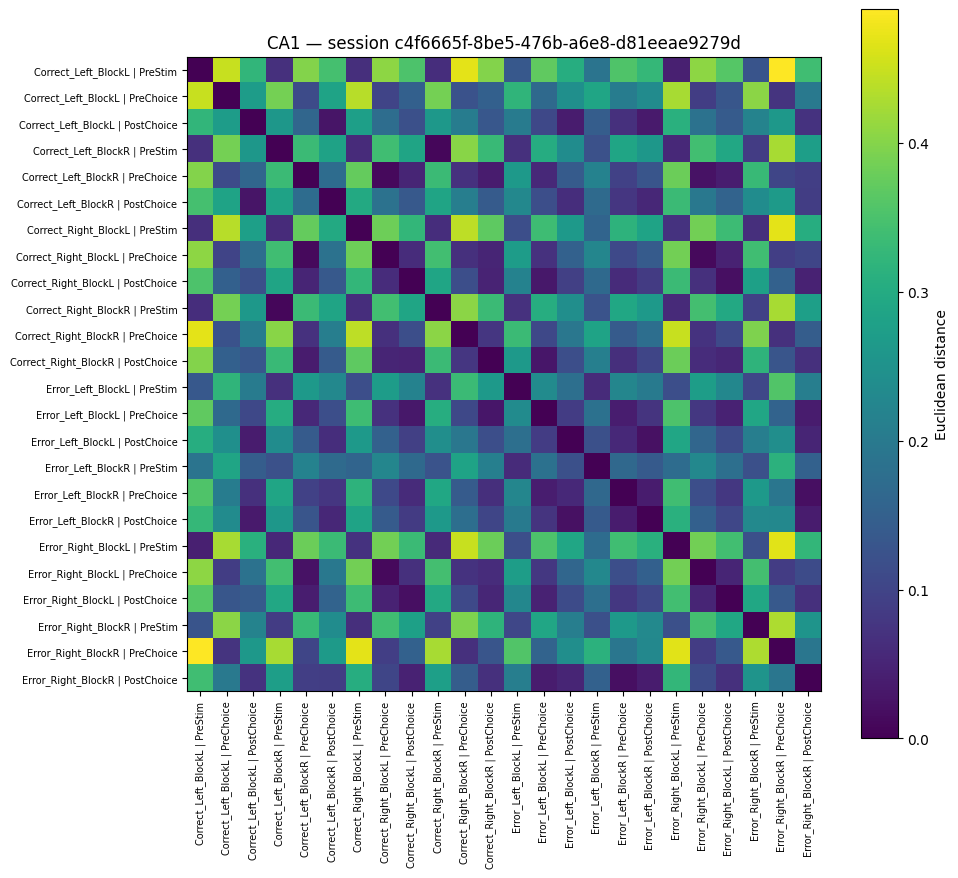

Session 1e104bf4-7a24-4624-a5b2-c2c8289c0de7: 24 / 24 trial types


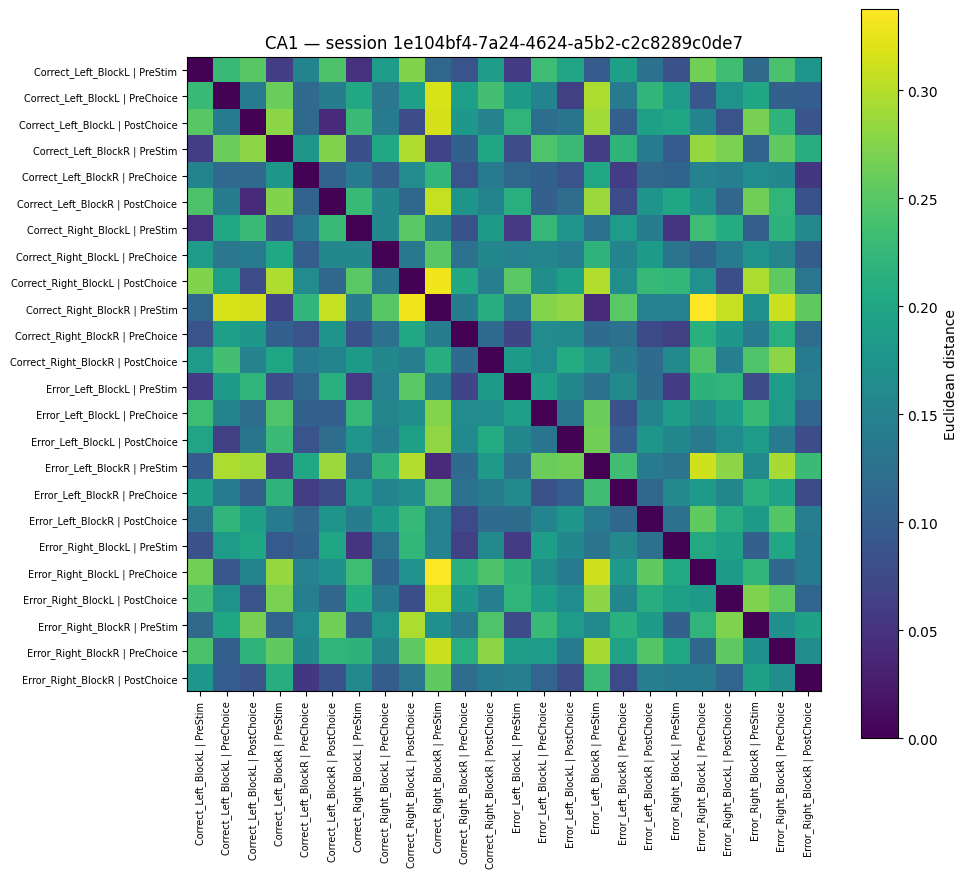

Session ce397420-3cd2-4a55-8fd1-5e28321981f4: 24 / 24 trial types


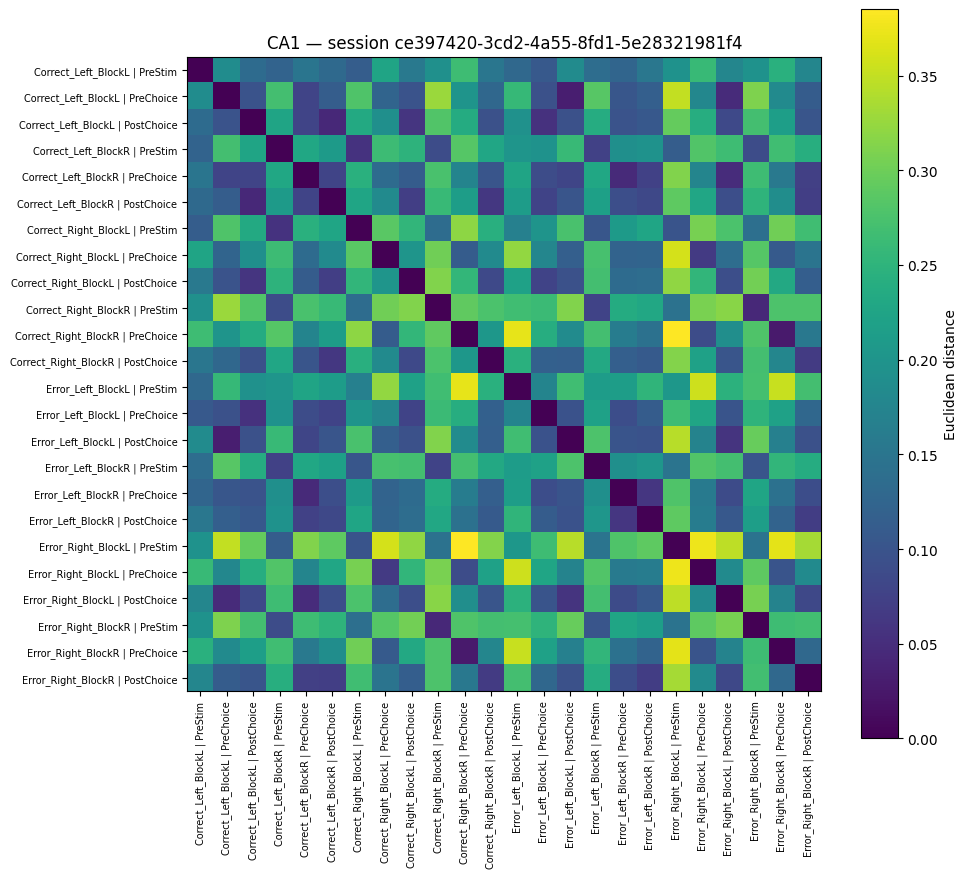

Session 63a32e5c-f63a-450d-85cb-140947b67eaf: 24 / 24 trial types


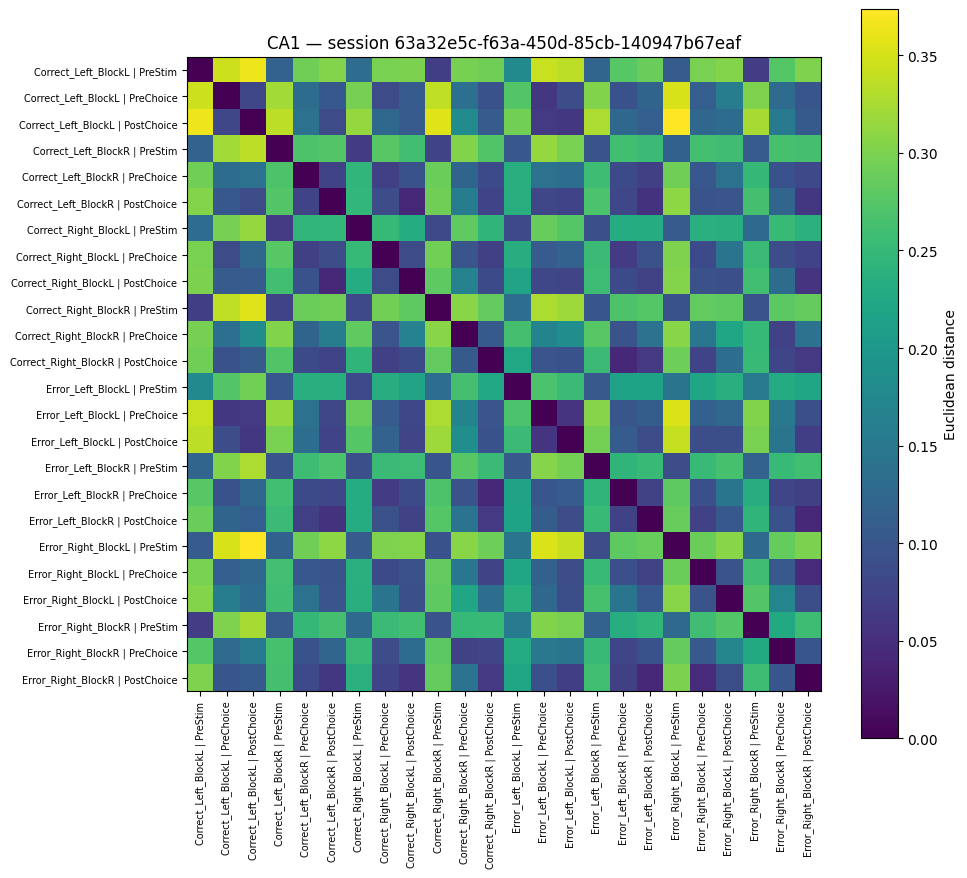

Session dec6ad00-01c8-4bfd-bcdc-b37c5e0cdb0e: 21 / 24 trial types


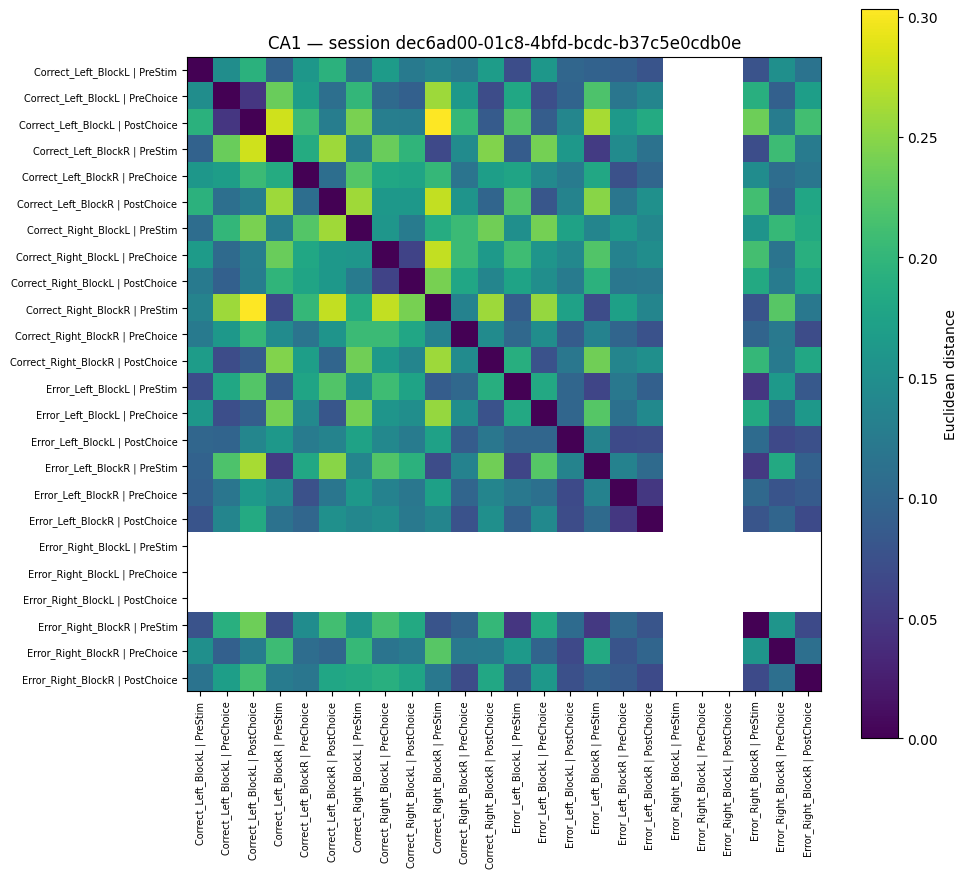

Session 5544da75-8d34-47cb-9092-1f91e713e79c: 21 / 24 trial types


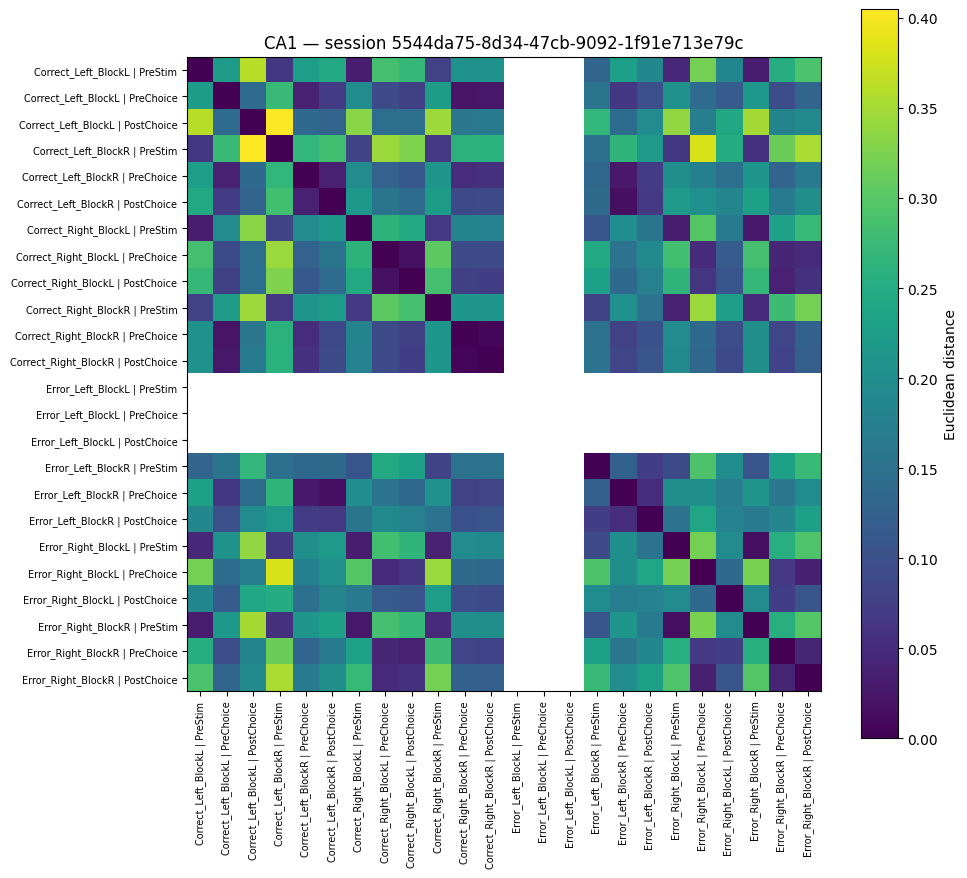

Session 7beb9419-113d-4e47-938c-68ab2657031e: 24 / 24 trial types


KeyboardInterrupt: 

In [65]:
rsa_df = pd.DataFrame(rsa_records)
region = 'CA1'

rsa_df['trial_condition'] = rsa_df['trial_type'] + rsa_df['epoch']  # master list across all sessions
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']
all_trial_conditions = rsa_df['condition_label'].unique()  # master list across all sessions

for s, session in enumerate(rsa_df['pid'].unique()):

    subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == session)]
    if len(subset) > 0:
        print(f"Session {session}: {len(subset.trial_condition.unique())} / {len(all_trial_conditions)} trial types")

        # Build a mapping from trial_type to index in the full matrix
        tt_to_idx = {tt: i for i, tt in enumerate(condition_labels)}
        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]

        # Compute pairwise distances only for present trial types
        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))

        # Place into a full NaN matrix
        n_conds = len(condition_labels)
        dist = np.full((n_conds, n_conds), np.nan)
        for i_small, i_full in enumerate(present_indices):
            for j_small, j_full in enumerate(present_indices):
                dist[i_full, j_full] = small_dist[i_small, j_small]

        # Plot with NaN as white
        cmap = plt.cm.viridis.copy()
        cmap.set_bad(color='white')

        fig, ax = plt.subplots(figsize=(10, 9))
        im = ax.imshow(dist, cmap=cmap, aspect='equal')
        ax.set_xticks(range(n_conds))
        ax.set_xticklabels(condition_labels, rotation=90, fontsize=7)
        ax.set_yticks(range(n_conds))
        ax.set_yticklabels(condition_labels, fontsize=7)
        ax.set_title(f'{region} — session {session}')
        fig.colorbar(im, ax=ax, label='Euclidean distance')
        plt.tight_layout()
        plt.show()

## Neural x behavioral similarity

In [133]:
rsa_df

,session,pid,region,n_neurons,trial_type,correct,choice,block,epoch,neuron_vector,condition_label
0,3638d102-e8b6-4230-8742-e548cd87a949,143dd7cf-6a47-47a1-906d-927ad7fe9117,LP,33,Correct_Left_BlockL,Correct,Left,BlockL,PreStim,"[0.026143790849673203, 0.042483660130718956, 0...",Correct_Left_BlockL | PreStim
1,3638d102-e8b6-4230-8742-e548cd87a949,143dd7cf-6a47-47a1-906d-927ad7fe9117,LP,33,Correct_Left_BlockL,Correct,Left,BlockL,PreChoice,"[0.10620915032679738, 0.05555555555555555, 0.1...",Correct_Left_BlockL | PreChoice
2,3638d102-e8b6-4230-8742-e548cd87a949,143dd7cf-6a47-47a1-906d-927ad7fe9117,LP,33,Correct_Left_BlockL,Correct,Left,BlockL,PostChoice,"[0.021241830065359478, 0.06209150326797386, 0....",Correct_Left_BlockL | PostChoice
3,3638d102-e8b6-4230-8742-e548cd87a949,143dd7cf-6a47-47a1-906d-927ad7fe9117,LP,33,Correct_Left_BlockR,Correct,Left,BlockR,PreStim,"[0.06666666666666667, 0.03648648648648649, 0.0...",Correct_Left_BlockR | PreStim
4,3638d102-e8b6-4230-8742-e548cd87a949,143dd7cf-6a47-47a1-906d-927ad7fe9117,LP,33,Correct_Left_BlockR,Correct,Left,BlockR,PreChoice,"[0.11531531531531532, 0.057207207207207206, 0....",Correct_Left_BlockR | PreChoice
...,...,...,...,...,...,...,...,...,...,...,...
7003,d23a44ef-1402-4ed7-97f5-47e9a7a504d9,dab512bd-a02d-4c1f-8dbc-9155a163efc0,VISa/am,7,Error_Left_BlockL,Error,Left,BlockL,PreChoice,"[0.038461538461538464, 0.017628205128205128, 0...",Error_Left_BlockL | PreChoice
7004,d23a44ef-1402-4ed7-97f5-47e9a7a504d9,dab512bd-a02d-4c1f-8dbc-9155a163efc0,VISa/am,7,Error_Left_BlockL,Error,Left,BlockL,PostChoice,"[0.03205128205128205, 0.016025641025641024, 0....",Error_Left_BlockL | PostChoice
7005,d23a44ef-1402-4ed7-97f5-47e9a7a504d9,dab512bd-a02d-4c1f-8dbc-9155a163efc0,VISa/am,7,Error_Left_BlockR,Error,Left,BlockR,PreStim,"[0.0673758865248227, 0.0017730496453900709, 0....",Error_Left_BlockR | PreStim
7006,d23a44ef-1402-4ed7-97f5-47e9a7a504d9,dab512bd-a02d-4c1f-8dbc-9155a163efc0,VISa/am,7,Error_Left_BlockR,Error,Left,BlockR,PreChoice,"[0.07801418439716312, 0.0, 0.06028368794326241...",Error_Left_BlockR | PreChoice


LP: ρ = 0.021, p = 0.3512 (Mantel, 41 sessions, 820 pairs)
DG: ρ = 0.037, p = 0.2126 (Mantel, 57 sessions, 1596 pairs)
VISa/am: ρ = -0.074, p = 0.9020 (Mantel, 25 sessions, 300 pairs)
CA1: ρ = -0.017, p = 0.6622 (Mantel, 66 sessions, 2145 pairs)
PO: ρ = -0.035, p = 0.6103 (Mantel, 25 sessions, 300 pairs)


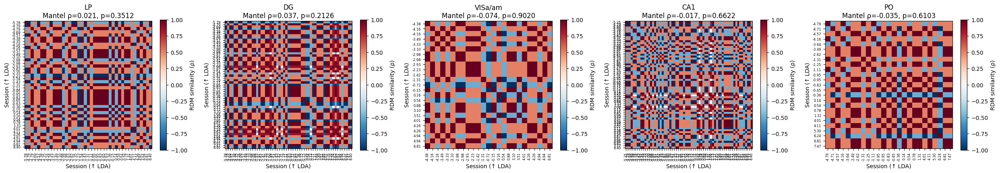

In [120]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr
import matplotlib.pyplot as plt

# --- Helper functions ---

def pairwise_complete_correlation(rdm_matrix):
    """Correlation between all session pairs using only mutually valid RDM entries.
    Uses Spearman so no z-scoring is needed."""
    n_sessions = rdm_matrix.shape[0]
    sim = np.full((n_sessions, n_sessions), np.nan)
    for i in range(n_sessions):
        sim[i, i] = 1.0
        for j in range(i + 1, n_sessions):
            valid = ~(np.isnan(rdm_matrix[i]) | np.isnan(rdm_matrix[j]))
            if valid.sum() < 3:
                continue
            r, _ = spearmanr(rdm_matrix[i, valid], rdm_matrix[j, valid])
            sim[i, j] = r
            sim[j, i] = r
    return sim


def mantel_test(mat_a, mat_b, n_perm=10000, seed=42):
    """Mantel permutation test between two symmetric distance/similarity matrices.
    Permutes rows/columns of mat_a to build a null distribution."""
    n = mat_a.shape[0]
    idx = np.triu_indices(n, k=1)
    observed_r, _ = spearmanr(mat_a[idx], mat_b[idx])

    rng = np.random.default_rng(seed)
    count = 0
    for _ in range(n_perm):
        perm = rng.permutation(n)
        r_perm, _ = spearmanr(mat_a[np.ix_(perm, perm)][idx], mat_b[idx])
        if r_perm >= observed_r:
            count += 1

    p = (count + 1) / (n_perm + 1)  # +1 for observed itself
    return observed_r, p


# --- Setup ---

lda_per_session = dict(zip(lda['session'], lda[0]))
rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']
rsa_df['condition_label'] = rsa_df['epoch']

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

results = []

for region in regions:
    rdm_vectors = []
    lda_list = []
    session_labels = []

    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]

        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]

        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))

        dist = np.full((n_conds, n_conds), np.nan)
        for i_small, i_full in enumerate(present_indices):
            for j_small, j_full in enumerate(present_indices):
                dist[i_full, j_full] = small_dist[i_small, j_small]

        upper = dist[np.triu_indices_from(dist, k=1)]
        rdm_vectors.append(upper)
        lda_list.append(lda_per_session[session])
        session_labels.append(session)

    if len(rdm_vectors) < 5:
        print(f'{region}: not enough sessions ({len(rdm_vectors)}), skipping')
        continue

    rdm_matrix = np.stack(rdm_vectors)

    # --- Pairwise-complete correlation (replaces conservative valid_mask + z-scoring) ---
    rdm_sim = pairwise_complete_correlation(rdm_matrix)

    # Drop sessions that have any NaN row in rdm_sim (couldn't be compared to someone)
    # Mantel test requires a complete matrix
    complete_mask = ~np.any(np.isnan(rdm_sim), axis=1)
    if complete_mask.sum() < 5:
        print(f'{region}: not enough fully-comparable sessions ({complete_mask.sum()}), skipping')
        continue

    rdm_sim = rdm_sim[np.ix_(complete_mask, complete_mask)]
    lda_arr = np.array(lda_list)[complete_mask]
    labels_clean = np.array(session_labels)[complete_mask]

    # LDA similarity
    lda_diff = squareform(pdist(lda_arr.reshape(-1, 1), metric='euclidean'))
    lda_sim = -lda_diff

    # --- Mantel test (replaces naive spearmanr p-value) ---
    r, p = mantel_test(rdm_sim, lda_sim)

    n_pairs = len(lda_arr) * (len(lda_arr) - 1) // 2
    print(f'{region}: ρ = {r:.3f}, p = {p:.4f} (Mantel, {len(lda_arr)} sessions, {n_pairs} pairs)')
    results.append(dict(region=region, r=r, p=p, rdm_sim=rdm_sim,
                        lda_arr=lda_arr, labels=labels_clean))

# --- Visualization ---

n_results = len(results)
if n_results > 0:
    fig, axes = plt.subplots(1, n_results, figsize=(5 * n_results, 4.5), squeeze=False)
    for i, res in enumerate(results):
        ax = axes[0, i]
        # Sort by LDA performance so any gradient is visually apparent
        order = np.argsort(res['lda_arr'])
        rdm_sorted = res['rdm_sim'][np.ix_(order, order)]

        im = ax.imshow(rdm_sorted, cmap='RdBu_r', vmin=-1, vmax=1)
        ax.set_title(f"{res['region']}\nMantel ρ={res['r']:.3f}, p={res['p']:.4f}")
        ax.set_xlabel('Session (↑ LDA)')
        ax.set_ylabel('Session (↑ LDA)')
        # Tick labels = rounded LDA values
        tick_labels = [f"{res['lda_arr'][o]:.2f}" for o in order]
        ax.set_xticks(range(len(order)))
        ax.set_xticklabels(tick_labels, rotation=90, fontsize=6)
        ax.set_yticks(range(len(order)))
        ax.set_yticklabels(tick_labels, fontsize=6)
        plt.colorbar(im, ax=ax, shrink=0.8, label='RDM similarity (ρ)')

    plt.tight_layout()
    plt.show()

Dropping 1767 rows with < 5 neurons:
region   session                             
CA1      12dc8b34-b18e-4cdd-90a9-da134a9be79c    24
         3d59aa1a-b4ba-47fe-b9cf-741b5fdb0c7b    24
         4b00df29-3769-43be-bb40-128b1cba6d35    24
         4b7fbad4-f6de-43b4-9b15-c7c7ef44db4b    24
         4fa70097-8101-4f10-b585-db39429c5ed0    24
                                                 ..
VISa/am  51e53aff-1d5d-4182-a684-aba783d50ae5    24
         6c6b0d06-6039-4525-a74b-58cfaa1d3a60    24
         6ed57216-498d-48a6-b48b-a243a34710ea    21
         9b528ad0-4599-4a55-9148-96cc1d93fb24    24
         dda5fc59-f09a-4256-9fb5-66c67667a466    21
Length: 74, dtype: int64
LP: ρ = 0.109, p = 0.1413 (Mantel, 32 sessions, 496 pairs)
DG: ρ = 0.031, p = 0.3327 (Mantel, 26 sessions, 325 pairs)
CA1: ρ = 0.042, p = 0.2551 (Mantel, 40 sessions, 780 pairs)
VISa/am: ρ = 0.028, p = 0.3253 (Mantel, 19 sessions, 171 pairs)
PO: ρ = -0.053, p = 0.6288 (Mantel, 22 sessions, 231 pairs)


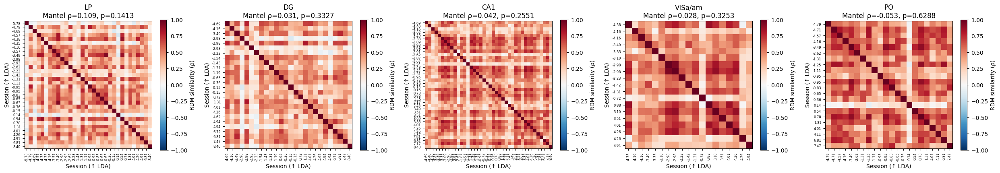

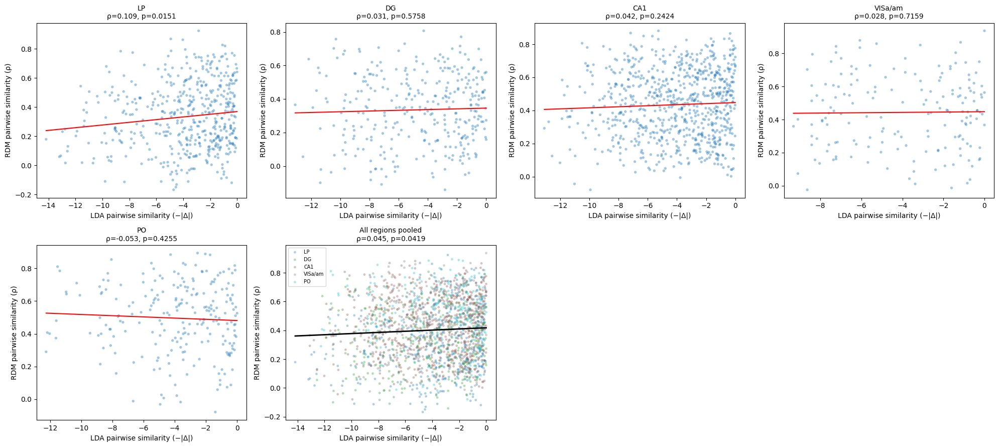

In [142]:
# --- Setup ---
lda_per_session = dict(zip(lda['session'], lda[0]))
rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']
# rsa_df['condition_label'] = rsa_df['correct'] + ' | ' + rsa_df['choice'] + ' | ' + rsa_df['epoch']
# rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']

# --- Filter out regions with < 10 neurons per session ---
rsa_df['n_neurons'] = rsa_df['neuron_vector'].apply(len)
min_neurons = 5
low_neuron_mask = rsa_df['n_neurons'] < min_neurons
if low_neuron_mask.any():
    dropped = rsa_df[low_neuron_mask].groupby(['region', 'session']).size()
    print(f"Dropping {low_neuron_mask.sum()} rows with < {min_neurons} neurons:")
    print(dropped)
rsa_df = rsa_df[~low_neuron_mask].copy()

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

# --- Store per-session RDMs for visualization ---
session_rdms = {}  # {session: {region: full_dist_matrix}}

results = []

for region in regions:
    rdm_vectors = []
    lda_list = []
    session_labels = []

    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]

        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]

        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))

        dist = np.full((n_conds, n_conds), np.nan)
        for i_small, i_full in enumerate(present_indices):
            for j_small, j_full in enumerate(present_indices):
                dist[i_full, j_full] = small_dist[i_small, j_small]

        # Store for per-session visualization
        if session not in session_rdms:
            session_rdms[session] = {}
        session_rdms[session][region] = dist

        upper = dist[np.triu_indices_from(dist, k=1)]
        rdm_vectors.append(upper)
        lda_list.append(lda_per_session[session])
        session_labels.append(session)

    if len(rdm_vectors) < 5:
        print(f'{region}: not enough sessions ({len(rdm_vectors)}), skipping')
        continue

    rdm_matrix = np.stack(rdm_vectors)

    # --- Pairwise-complete correlation ---
    rdm_sim = pairwise_complete_correlation(rdm_matrix)

    complete_mask = ~np.any(np.isnan(rdm_sim), axis=1)
    if complete_mask.sum() < 5:
        print(f'{region}: not enough fully-comparable sessions ({complete_mask.sum()}), skipping')
        continue

    rdm_sim = rdm_sim[np.ix_(complete_mask, complete_mask)]
    lda_arr = np.array(lda_list)[complete_mask]
    labels_clean = np.array(session_labels)[complete_mask]

    # LDA similarity
    lda_diff = squareform(pdist(lda_arr.reshape(-1, 1), metric='euclidean'))
    lda_sim = -lda_diff

    # --- Mantel test ---
    r, p = mantel_test(rdm_sim, lda_sim)

    n_pairs = len(lda_arr) * (len(lda_arr) - 1) // 2
    print(f'{region}: ρ = {r:.3f}, p = {p:.4f} (Mantel, {len(lda_arr)} sessions, {n_pairs} pairs)')
    results.append(dict(region=region, r=r, p=p, rdm_sim=rdm_sim,
                        lda_arr=lda_arr, labels=labels_clean,
                        lda_sim=lda_sim))

# --- Visualization 1: Mantel heatmaps (original) ---

n_results = len(results)
if n_results > 0:
    fig, axes = plt.subplots(1, n_results, figsize=(5 * n_results, 4.5), squeeze=False)
    for i, res in enumerate(results):
        ax = axes[0, i]
        order = np.argsort(res['lda_arr'])
        rdm_sorted = res['rdm_sim'][np.ix_(order, order)]

        im = ax.imshow(rdm_sorted, cmap='RdBu_r', vmin=-1, vmax=1)
        ax.set_title(f"{res['region']}\nMantel ρ={res['r']:.3f}, p={res['p']:.4f}")
        ax.set_xlabel('Session (↑ LDA)')
        ax.set_ylabel('Session (↑ LDA)')
        tick_labels = [f"{res['lda_arr'][o]:.2f}" for o in order]
        ax.set_xticks(range(len(order)))
        ax.set_xticklabels(tick_labels, rotation=90, fontsize=6)
        ax.set_yticks(range(len(order)))
        ax.set_yticklabels(tick_labels, fontsize=6)
        plt.colorbar(im, ax=ax, shrink=0.8, label='RDM similarity (ρ)')

    plt.tight_layout()
    plt.show()

# --- Visualization 2: Per-session RDMs (one figure per session, subplots for regions) ---

# all_rdm_regions = sorted({r for s in session_rdms for r in session_rdms[s]})

# for session in sorted(session_rdms.keys()):
#     region_dict = session_rdms[session]
#     present_regions = [r for r in all_rdm_regions if r in region_dict]
#     n_reg = len(present_regions)
#     if n_reg == 0:
#         continue

#     lda_val = lda_per_session.get(session, np.nan)
#     ncols = min(n_reg, 5)
#     nrows = int(np.ceil(n_reg / ncols))
#     fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3.5 * nrows), squeeze=False)
#     fig.suptitle(f'Session {session}  (LDA = {lda_val:.3f})', fontsize=13)

#     for k, reg in enumerate(present_regions):
#         ax = axes[k // ncols, k % ncols]
#         mat = region_dict[reg]
#         im = ax.imshow(mat, cmap='viridis')
#         ax.set_title(reg, fontsize=10)
#         ax.set_xticks(range(n_conds))
#         ax.set_xticklabels(all_condition_labels, rotation=90, fontsize=5)
#         ax.set_yticks(range(n_conds))
#         ax.set_yticklabels(all_condition_labels, fontsize=5)
#         plt.colorbar(im, ax=ax, shrink=0.7)

#     # Hide unused axes
#     for k in range(n_reg, nrows * ncols):
#         axes[k // ncols, k % ncols].axis('off')

#     plt.tight_layout(rect=[0, 0, 1, 0.95])
#     plt.show()

# --- Visualization 3: Global scatter – LDA pairwise distance vs RDM pairwise similarity ---

if len(results) > 0:
    n_res = len(results)
    ncols = min(n_res, 4)
    nrows = int(np.ceil((n_res + 1) / ncols))  # +1 for pooled panel
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows), squeeze=False)

    all_lda_dists = []
    all_rdm_sims = []
    all_region_labels = []

    for i, res in enumerate(results):
        ax = axes[i // ncols, i % ncols]
        idx = np.triu_indices(len(res['lda_arr']), k=1)
        lda_pw = res['lda_sim'][idx]           # negative distance = similarity
        rdm_pw = res['rdm_sim'][idx]

        valid = ~(np.isnan(lda_pw) | np.isnan(rdm_pw))
        lda_v, rdm_v = lda_pw[valid], rdm_pw[valid]

        ax.scatter(lda_v, rdm_v, alpha=0.4, s=15, edgecolors='none')
        if len(lda_v) >= 3:
            rho, pval = spearmanr(lda_v, rdm_v)
            # regression line
            z = np.polyfit(lda_v, rdm_v, 1)
            x_line = np.linspace(lda_v.min(), lda_v.max(), 50)
            ax.plot(x_line, np.polyval(z, x_line), 'r-', lw=1.5)
            ax.set_title(f"{res['region']}\nρ={rho:.3f}, p={pval:.4f}", fontsize=10)
        else:
            ax.set_title(res['region'], fontsize=10)

        ax.set_xlabel('LDA pairwise similarity (−|Δ|)')
        ax.set_ylabel('RDM pairwise similarity (ρ)')

        all_lda_dists.append(lda_v)
        all_rdm_sims.append(rdm_v)
        all_region_labels.extend([res['region']] * len(lda_v))

    # Pooled panel
    ax_pool = axes[(n_res) // ncols, (n_res) % ncols]
    pool_lda = np.concatenate(all_lda_dists)
    pool_rdm = np.concatenate(all_rdm_sims)
    unique_regs = list(dict.fromkeys(all_region_labels))  # preserve order
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_regs)))
    color_map = {r: c for r, c in zip(unique_regs, colors)}

    offset = 0
    for res_i, res in enumerate(results):
        n_pts = len(all_lda_dists[res_i])
        ax_pool.scatter(pool_lda[offset:offset + n_pts], pool_rdm[offset:offset + n_pts],
                        alpha=0.35, s=12, edgecolors='none',
                        color=color_map[res['region']], label=res['region'])
        offset += n_pts

    if len(pool_lda) >= 3:
        rho_all, p_all = spearmanr(pool_lda, pool_rdm)
        z = np.polyfit(pool_lda, pool_rdm, 1)
        x_line = np.linspace(pool_lda.min(), pool_lda.max(), 50)
        ax_pool.plot(x_line, np.polyval(z, x_line), 'k-', lw=2)
        ax_pool.set_title(f"All regions pooled\nρ={rho_all:.3f}, p={p_all:.4f}", fontsize=10)
    else:
        ax_pool.set_title("All regions pooled", fontsize=10)

    ax_pool.set_xlabel('LDA pairwise similarity (−|Δ|)')
    ax_pool.set_ylabel('RDM pairwise similarity (ρ)')
    ax_pool.legend(fontsize=7, loc='best')

    # Hide unused axes
    for k in range(n_res + 1, nrows * ncols):
        axes[k // ncols, k % ncols].axis('off')

    plt.tight_layout()
    plt.show()

LP: 0/276 pairs significant (FDR q<0.05), 41 sessions


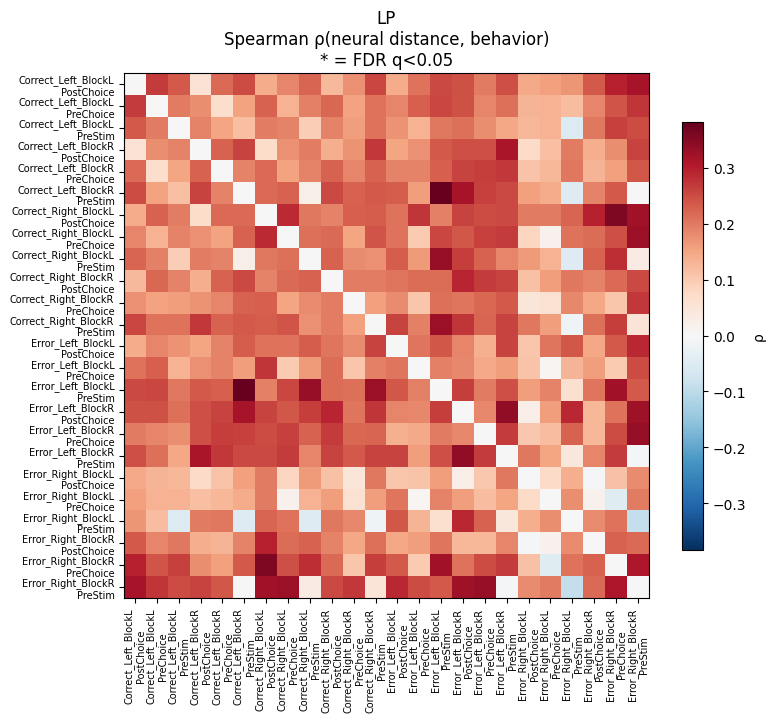

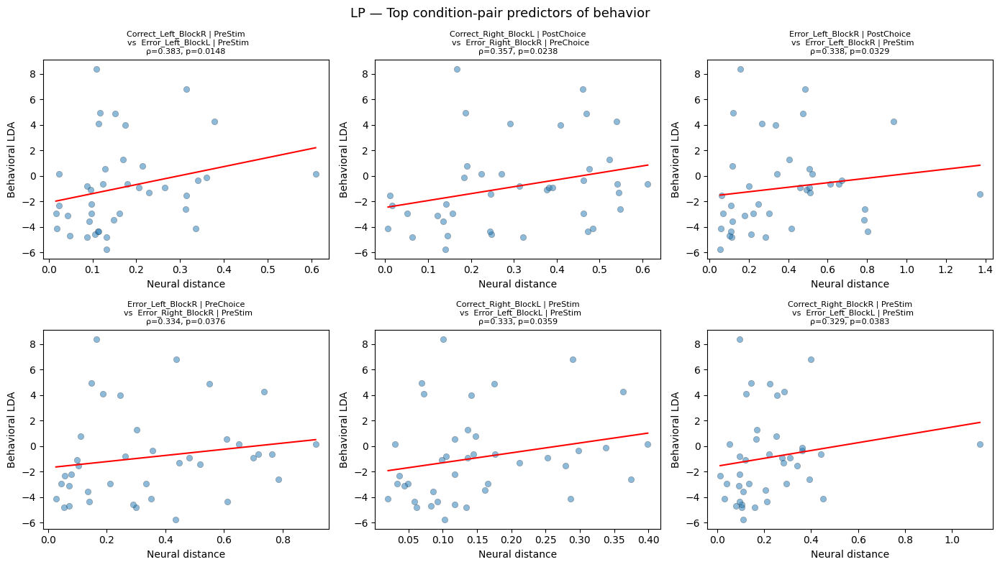

DG: 1/276 pairs significant (FDR q<0.05), 57 sessions


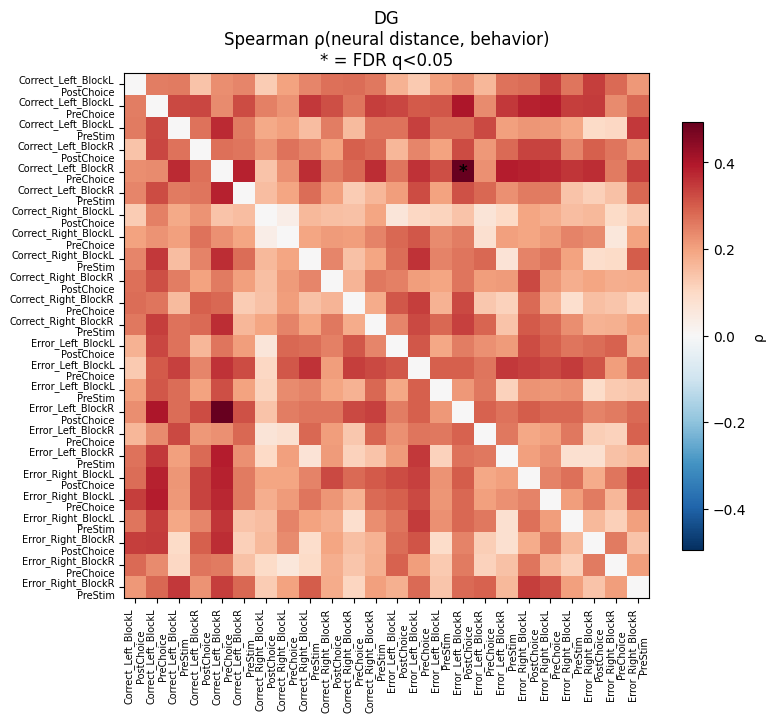

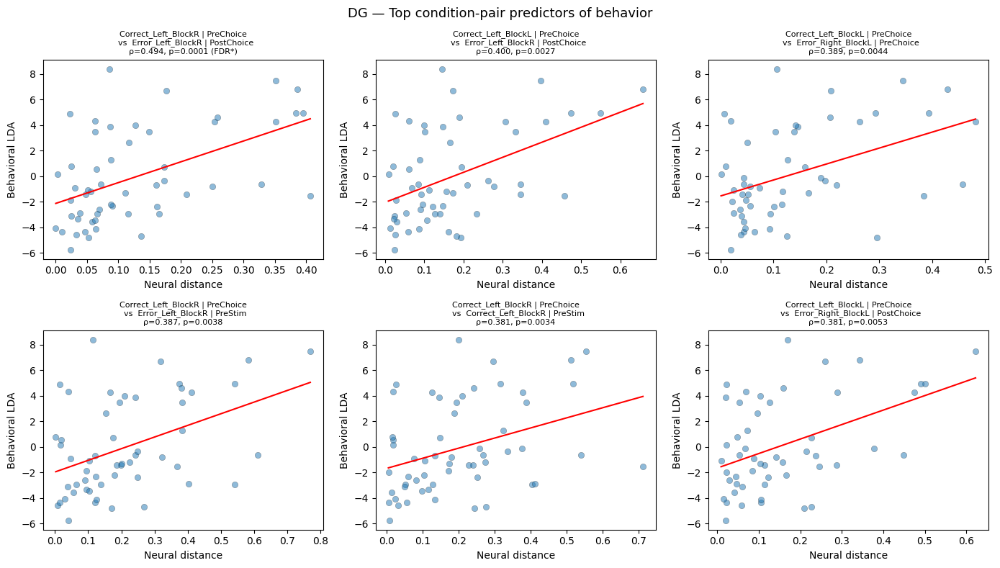

VISa/am: 0/276 pairs significant (FDR q<0.05), 25 sessions


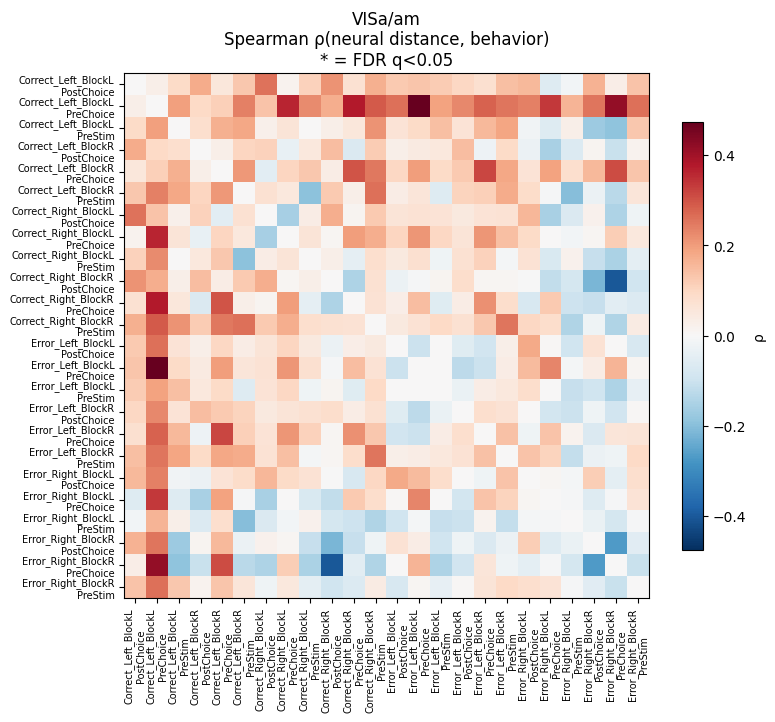

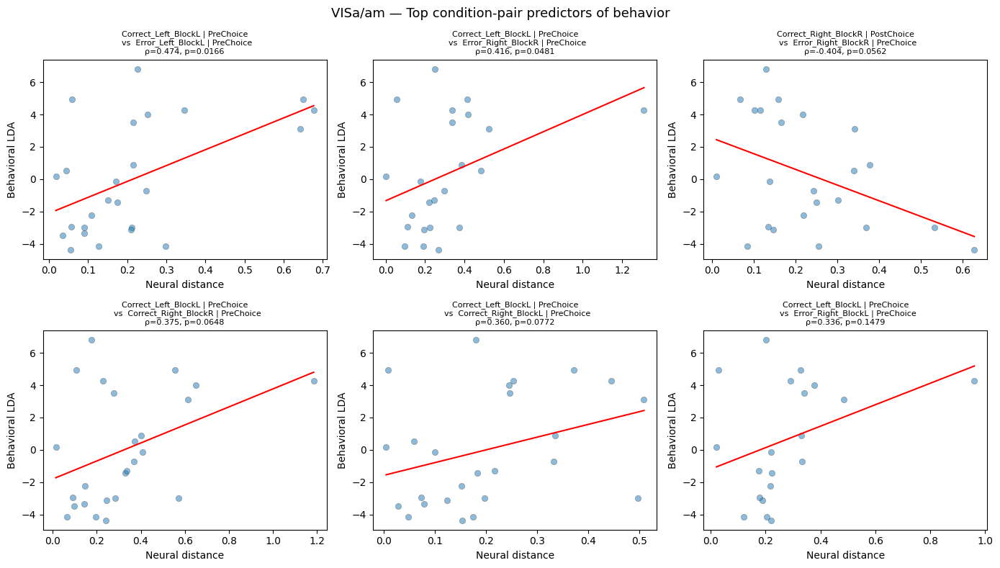

CA1: 0/276 pairs significant (FDR q<0.05), 66 sessions


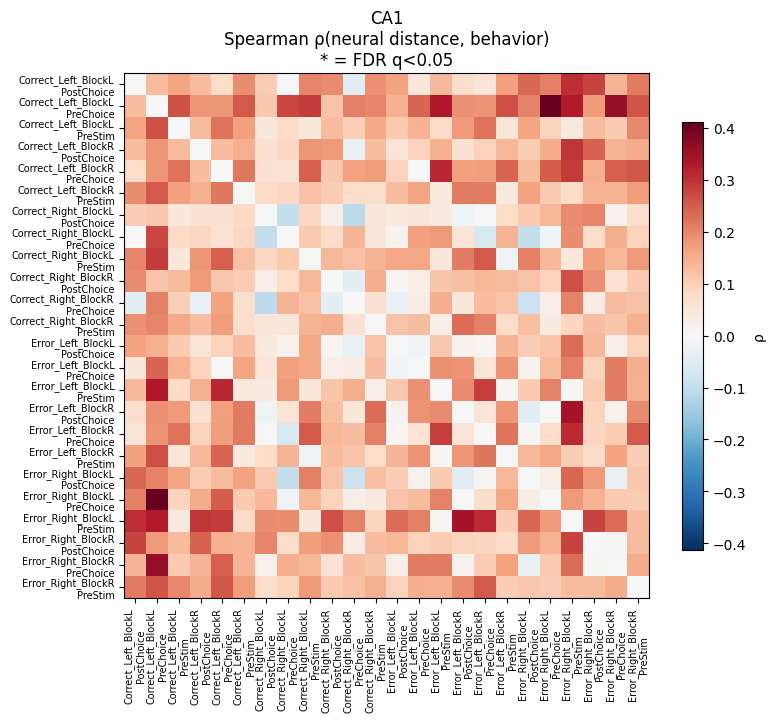

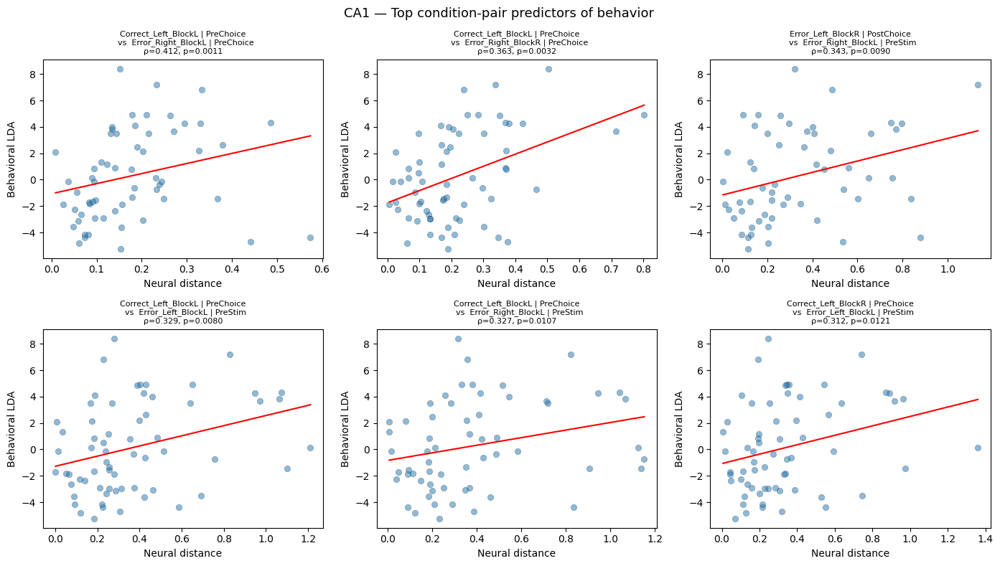

PO: 0/276 pairs significant (FDR q<0.05), 25 sessions


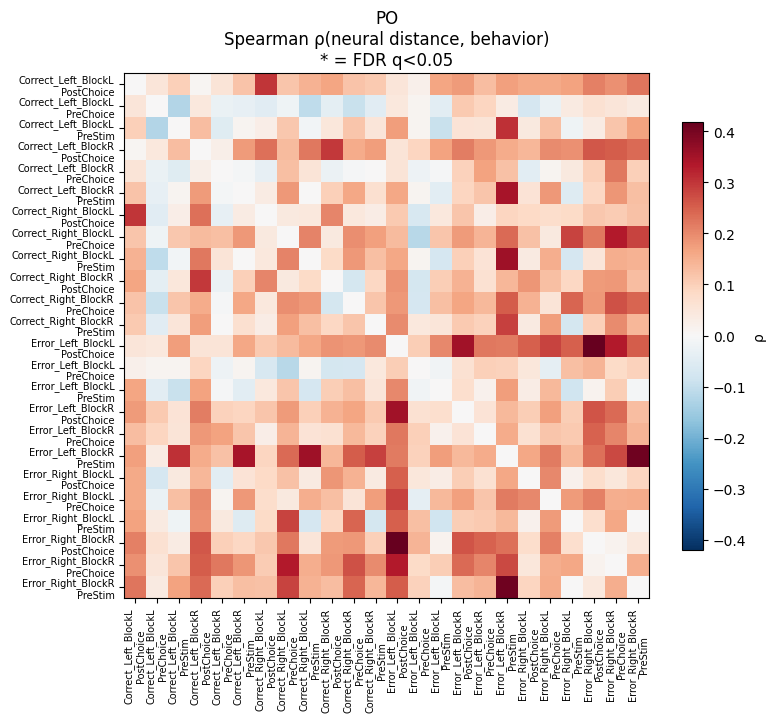

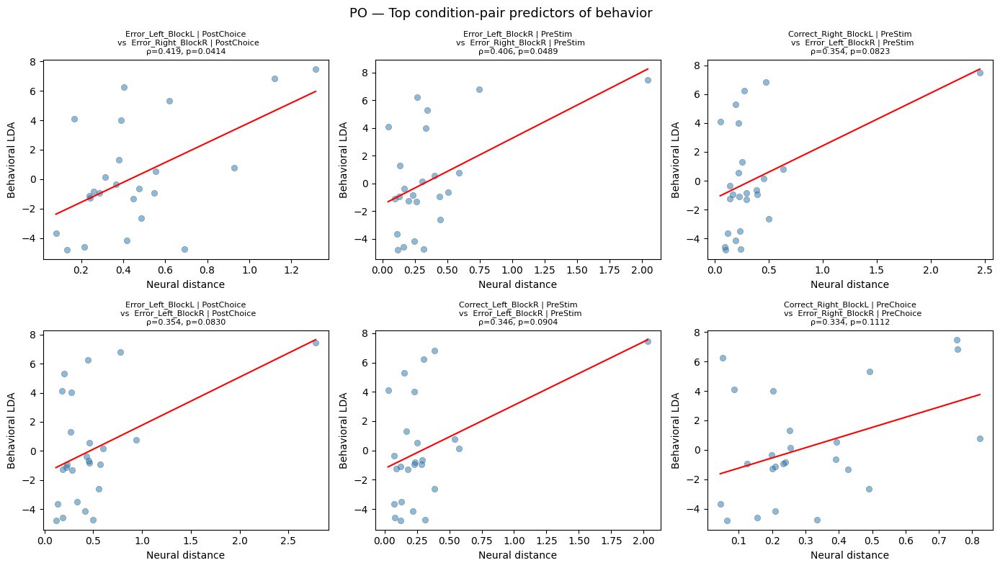

In [107]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# --- Setup ---

lda_per_session = dict(zip(lda['session'], lda[0]))
rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

MIN_SESSIONS = 10  # minimum sessions for a meaningful correlation


# --- Build per-session full RDMs ---

def build_session_rdms(rsa_df, pids, region, tt_to_idx, n_conds, lda_per_session):
    rdm_cubes = []  # each entry: full n_conds x n_conds matrix with NaN
    lda_list = []

    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]

        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]

        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))

        full = np.full((n_conds, n_conds), np.nan)
        for i_s, i_f in enumerate(present_indices):
            for j_s, j_f in enumerate(present_indices):
                full[i_f, j_f] = small_dist[i_s, j_s]

        rdm_cubes.append(full)
        lda_list.append(lda_per_session[session])

    return np.stack(rdm_cubes), np.array(lda_list)  # (n_sessions, n_conds, n_conds)


# --- Element-wise brain-behavior correlation ---

def elementwise_brain_behavior(rdm_cube, behavior, min_n=MIN_SESSIONS):
    """For each RDM cell (i,j), correlate neural distance with behavior across sessions.
    Returns correlation matrix, p-value matrix, and count matrix."""
    n_sessions, n_conds, _ = rdm_cube.shape
    r_mat = np.full((n_conds, n_conds), np.nan)
    p_mat = np.full((n_conds, n_conds), np.nan)
    n_mat = np.zeros((n_conds, n_conds), dtype=int)

    for i in range(n_conds):
        for j in range(i + 1, n_conds):
            dists = rdm_cube[:, i, j]
            valid = ~np.isnan(dists)
            n_valid = valid.sum()
            n_mat[i, j] = n_mat[j, i] = n_valid

            if n_valid < min_n:
                continue

            r, p = spearmanr(dists[valid], behavior[valid])
            r_mat[i, j] = r_mat[j, i] = r
            p_mat[i, j] = p_mat[j, i] = p

    return r_mat, p_mat, n_mat


def fdr_correct_rdm(p_mat):
    """Apply FDR correction to upper triangle of a symmetric p-value matrix."""
    idx = np.triu_indices_from(p_mat, k=1)
    p_vals = p_mat[idx]
    valid = ~np.isnan(p_vals)

    sig_mat = np.full_like(p_mat, False, dtype=bool)
    if valid.sum() == 0:
        return sig_mat

    reject = np.full(len(p_vals), False)
    reject[valid], _, _, _ = multipletests(p_vals[valid], method='fdr_bh', alpha=0.05)

    # Fill symmetric matrix
    for k, (i, j) in enumerate(zip(idx[0], idx[1])):
        sig_mat[i, j] = sig_mat[j, i] = reject[k]

    return sig_mat


# --- Visualization ---

def plot_brain_behavior_rdm(r_mat, sig_mat, n_mat, condition_labels, region, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 7))

    masked_r = r_mat.copy()
    np.fill_diagonal(masked_r, 0)

    vmax = np.nanmax(np.abs(masked_r[np.triu_indices_from(masked_r, k=1)]))
    vmax = max(vmax, 0.1)  # avoid degenerate color scale

    im = ax.imshow(masked_r, cmap='RdBu_r', vmin=-vmax, vmax=vmax)

    # Mark significant cells
    for i in range(len(condition_labels)):
        for j in range(i + 1, len(condition_labels)):
            if sig_mat[i, j]:
                ax.text(j, i, '*', ha='center', va='center',
                        fontsize=12, fontweight='bold', color='black')

    # Labels
    short_labels = [c.replace(' | ', '\n') for c in condition_labels]
    ax.set_xticks(range(len(condition_labels)))
    ax.set_xticklabels(short_labels, rotation=90, fontsize=7)
    ax.set_yticks(range(len(condition_labels)))
    ax.set_yticklabels(short_labels, fontsize=7)
    ax.set_title(f'{region}\nSpearman ρ(neural distance, behavior)\n* = FDR q<0.05')
    plt.colorbar(im, ax=ax, shrink=0.8, label='ρ')

    return ax


def plot_top_pairs_scatter(rdm_cube, behavior, r_mat, p_mat, sig_mat,
                           condition_labels, region, n_top=6):
    """Scatter plots for the top brain-behavior pairs."""
    idx = np.triu_indices_from(r_mat, k=1)
    pairs = list(zip(idx[0], idx[1]))
    r_vals = np.array([r_mat[i, j] for i, j in pairs])
    p_vals = np.array([p_mat[i, j] for i, j in pairs])
    valid = ~np.isnan(r_vals)

    # Sort by absolute correlation
    order = np.argsort(-np.abs(np.where(valid, r_vals, 0)))
    top = order[:n_top]

    fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    fig.suptitle(f'{region} — Top condition-pair predictors of behavior', fontsize=13)

    for ax, k in zip(axes.ravel(), top):
        i, j = pairs[k]
        dists = rdm_cube[:, i, j]
        vmask = ~np.isnan(dists)

        ax.scatter(dists[vmask], behavior[vmask], alpha=0.5, edgecolors='k', linewidths=0.3)
        z = np.polyfit(dists[vmask], behavior[vmask], 1)
        x_line = np.linspace(np.nanmin(dists[vmask]), np.nanmax(dists[vmask]), 50)
        ax.plot(x_line, np.polyval(z, x_line), 'r-', lw=1.5)

        sig_label = ' (FDR*)' if sig_mat[i, j] else ''
        ax.set_title(f'{condition_labels[i]}\n  vs  {condition_labels[j]}\n'
                     f'ρ={r_vals[k]:.3f}, p={p_vals[k]:.4f}{sig_label}', fontsize=8)
        ax.set_xlabel('Neural distance')
        ax.set_ylabel('Behavioral LDA')

    plt.tight_layout()
    plt.show()


# --- Main loop ---

for region in regions:
    rdm_cube, lda_arr = build_session_rdms(rsa_df, pids, region, tt_to_idx,
                                            n_conds, lda_per_session)
    if len(lda_arr) < MIN_SESSIONS:
        print(f'{region}: only {len(lda_arr)} sessions, skipping')
        continue

    # Core analysis
    r_mat, p_mat, n_mat = elementwise_brain_behavior(rdm_cube, lda_arr)
    sig_mat = fdr_correct_rdm(p_mat)

    n_tested = np.sum(~np.isnan(r_mat[np.triu_indices_from(r_mat, k=1)]))
    n_sig = np.sum(sig_mat[np.triu_indices_from(sig_mat, k=1)])
    print(f'{region}: {n_sig}/{n_tested} pairs significant (FDR q<0.05), '
          f'{len(lda_arr)} sessions')

    # Panel 1: brain-behavior correlation RDM
    fig, ax = plt.subplots(figsize=(8, 7))
    plot_brain_behavior_rdm(r_mat, sig_mat, n_mat, all_condition_labels, region, ax=ax)
    plt.tight_layout()
    plt.show()

    # Panel 2: scatter plots for top pairs
    plot_top_pairs_scatter(rdm_cube, lda_arr, r_mat, p_mat, sig_mat,
                           all_condition_labels, region)

## Regression

Dropping 1767 rows with < 5 neurons:
region   session                             
CA1      12dc8b34-b18e-4cdd-90a9-da134a9be79c    24
         3d59aa1a-b4ba-47fe-b9cf-741b5fdb0c7b    24
         4b00df29-3769-43be-bb40-128b1cba6d35    24
         4b7fbad4-f6de-43b4-9b15-c7c7ef44db4b    24
         4fa70097-8101-4f10-b585-db39429c5ed0    24
                                                 ..
VISa/am  51e53aff-1d5d-4182-a684-aba783d50ae5    24
         6c6b0d06-6039-4525-a74b-58cfaa1d3a60    24
         6ed57216-498d-48a6-b48b-a243a34710ea    21
         9b528ad0-4599-4a55-9148-96cc1d93fb24    24
         dda5fc59-f09a-4256-9fb5-66c67667a466    21
Length: 74, dtype: int64
LP: 32 sessions, 66 RDM features — running permutation test...
  → LOO r = -0.930, p = 0.7465
DG: 26 sessions, 66 RDM features — running permutation test...
  → LOO r = -0.059, p = 0.2196
CA1: 40 sessions, 66 RDM features — running permutation test...
  → LOO r = -0.003, p = 0.1557
VISa/am: 19 sessions, 153 RDM feature

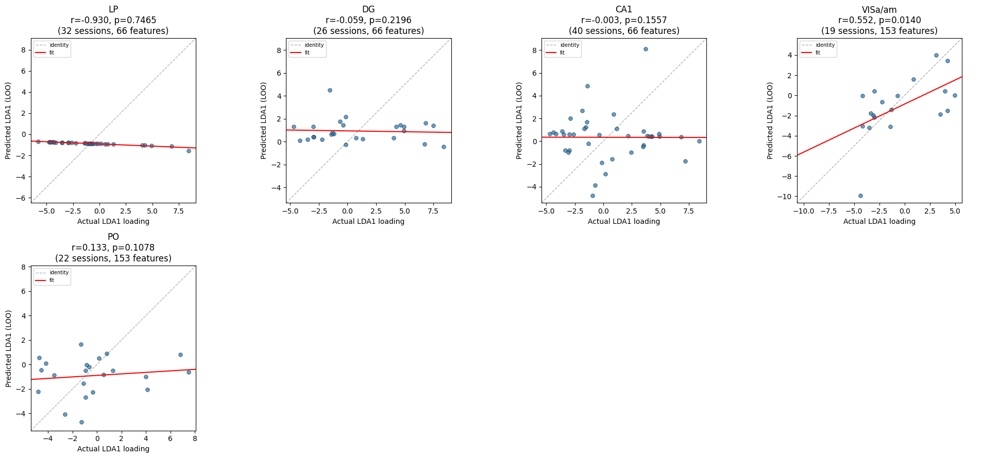

In [143]:
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import LeaveOneOut
from scipy.stats import pearsonr

# --- LOO Ridge regression with permutation test ---

def loo_ridge_predict(X, y, alphas=np.logspace(-3, 5, 50)):
    """Leave-one-out Ridge regression. Returns out-of-sample predictions."""
    loo = LeaveOneOut()
    y_pred = np.full_like(y, np.nan, dtype=float)
    for train_idx, test_idx in loo.split(X):
        scaler = StandardScaler()
        X_tr = scaler.fit_transform(X[train_idx])
        X_te = scaler.transform(X[test_idx])
        model = RidgeCV(alphas=alphas)
        model.fit(X_tr, y[train_idx])
        y_pred[test_idx] = model.predict(X_te)
    return y_pred


def regression_permutation_test(X, y, n_perm=500, seed=42):
    """Permutation test on LOO-CV Pearson r between predicted and actual y."""
    y_pred = loo_ridge_predict(X, y)
    observed_r, _ = pearsonr(y, y_pred)

    rng = np.random.default_rng(seed)
    count = 0
    for _ in range(n_perm):
        y_perm = rng.permutation(y)
        y_pred_perm = loo_ridge_predict(X, y_perm)
        r_perm, _ = pearsonr(y_perm, y_pred_perm)
        if r_perm >= observed_r:
            count += 1

    p = (count + 1) / (n_perm + 1)
    return y_pred, observed_r, p


# --- Setup ---
lda_per_session = dict(zip(lda['session'], lda[0]))
rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']
# rsa_df['condition_label'] = rsa_df['correct'] + ' | ' + rsa_df['choice'] + ' | ' + rsa_df['epoch']
# rsa_df['condition_label'] = rsa_df['epoch']

# --- Filter out regions with < x neurons per session ---
rsa_df['n_neurons'] = rsa_df['neuron_vector'].apply(len)
min_neurons = 5
low_neuron_mask = rsa_df['n_neurons'] < min_neurons
if low_neuron_mask.any():
    dropped = rsa_df[low_neuron_mask].groupby(['region', 'session']).size()
    print(f"Dropping {low_neuron_mask.sum()} rows with < {min_neurons} neurons:")
    print(dropped)
rsa_df = rsa_df[~low_neuron_mask].copy()

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

# --- Per-region regression: predict LDA1 from RDM features ---

regression_results = []

for region in regions:
    rdm_vectors = []
    lda_list = []
    session_labels = []

    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]

        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]

        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))

        dist = np.full((n_conds, n_conds), np.nan)
        for i_small, i_full in enumerate(present_indices):
            for j_small, j_full in enumerate(present_indices):
                dist[i_full, j_full] = small_dist[i_small, j_small]

        upper = dist[np.triu_indices_from(dist, k=1)]
        rdm_vectors.append(upper)
        lda_list.append(lda_per_session[session])
        session_labels.append(session)

    if len(rdm_vectors) < 5:
        print(f'{region}: not enough sessions ({len(rdm_vectors)}), skipping regression')
        continue

    X = np.stack(rdm_vectors)
    y = np.array(lda_list)

    # Keep only RDM features valid across ALL sessions
    valid_cols = ~np.any(np.isnan(X), axis=0)
    if valid_cols.sum() < 2:
        print(f'{region}: not enough valid RDM features ({valid_cols.sum()}), skipping')
        continue
    X_clean = X[:, valid_cols]

    print(f'{region}: {X_clean.shape[0]} sessions, {X_clean.shape[1]} RDM features — running permutation test...')
    y_pred, r_obs, p_val = regression_permutation_test(X_clean, y)

    print(f'  → LOO r = {r_obs:.3f}, p = {p_val:.4f}')
    regression_results.append(dict(
        region=region, r=r_obs, p=p_val,
        y_true=y, y_pred=y_pred,
        n_sessions=len(y), n_features=X_clean.shape[1],
        labels=np.array(session_labels),
    ))

# --- Multi-region model: concatenate RDM features from all regions ---

# Find sessions present in ALL included regions
included_regions = [res['region'] for res in regression_results]
if len(included_regions) > 1:
    session_sets = []
    region_data = {}
    for region in included_regions:
        rdm_dict = {}
        for pid in pids:
            subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
            if len(subset) == 0:
                continue
            session = subset['session'].iloc[0]
            present_types = subset['condition_label'].values
            present_indices = [tt_to_idx[tt] for tt in present_types]
            mat = np.stack(subset['neuron_vector'].values)
            small_dist = squareform(pdist(mat, metric='euclidean'))
            dist = np.full((n_conds, n_conds), np.nan)
            for i_s, i_f in enumerate(present_indices):
                for j_s, j_f in enumerate(present_indices):
                    dist[i_f, j_f] = small_dist[i_s, j_s]
            upper = dist[np.triu_indices_from(dist, k=1)]
            rdm_dict[session] = upper
        region_data[region] = rdm_dict
        session_sets.append(set(rdm_dict.keys()))

    common_sessions = sorted(set.intersection(*session_sets))
    if len(common_sessions) >= 5:
        X_multi = []
        for session in common_sessions:
            row = np.concatenate([region_data[r][session] for r in included_regions])
            X_multi.append(row)
        X_multi = np.stack(X_multi)
        y_multi = np.array([lda_per_session[s] for s in common_sessions])

        valid_cols = ~np.any(np.isnan(X_multi), axis=0)
        X_multi_clean = X_multi[:, valid_cols]

        if X_multi_clean.shape[1] >= 2:
            print(f'\nMulti-region: {X_multi_clean.shape[0]} sessions, '
                  f'{X_multi_clean.shape[1]} features — running permutation test...')
            y_pred_m, r_m, p_m = regression_permutation_test(X_multi_clean, y_multi)
            print(f'  → LOO r = {r_m:.3f}, p = {p_m:.4f}')
            regression_results.append(dict(
                region='All regions', r=r_m, p=p_m,
                y_true=y_multi, y_pred=y_pred_m,
                n_sessions=len(y_multi), n_features=X_multi_clean.shape[1],
                labels=np.array(common_sessions),
            ))

# --- Visualization: predicted vs actual LDA1 ---

n_res = len(regression_results)
if n_res > 0:
    ncols = min(n_res, 4)
    nrows = int(np.ceil(n_res / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows), squeeze=False)

    for i, res in enumerate(regression_results):
        ax = axes[i // ncols, i % ncols]
        ax.scatter(res['y_true'], res['y_pred'], s=30, alpha=0.7, edgecolors='k', linewidths=0.5)

        # Identity / regression line
        all_vals = np.concatenate([res['y_true'], res['y_pred']])
        lims = [np.nanmin(all_vals) - 0.05 * np.ptp(all_vals),
                np.nanmax(all_vals) + 0.05 * np.ptp(all_vals)]
        ax.plot(lims, lims, 'k--', alpha=0.3, lw=1, label='identity')
        z = np.polyfit(res['y_true'], res['y_pred'], 1)
        ax.plot(np.array(lims), np.polyval(z, lims), 'r-', lw=1.5, label='fit')

        ax.set_xlim(lims)
        ax.set_ylim(lims)
        ax.set_xlabel('Actual LDA1 loading')
        ax.set_ylabel('Predicted LDA1 (LOO)')
        ax.set_title(f"{res['region']}\nr={res['r']:.3f}, p={res['p']:.4f}\n"
                     f"({res['n_sessions']} sessions, {res['n_features']} features)")
        ax.legend(fontsize=7)
        ax.set_aspect('equal', adjustable='box')

    for k in range(n_res, nrows * ncols):
        axes[k // ncols, k % ncols].axis('off')

    plt.tight_layout()
    plt.show()


  LP  (41 sessions)

  Theory-driven contrasts:
    across_type_across_epoch                  ρ = +0.205  p = 0.1985  (n=41)
    across_type_within_PostChoice             ρ = +0.184  p = 0.2504  (n=41)
    across_type_within_PreChoice              ρ = +0.193  p = 0.2265  (n=41)
    across_type_within_PreStim                ρ = +0.144  p = 0.3687  (n=41)
    within_type_across_epoch                  ρ = +0.219  p = 0.1689  (n=41)


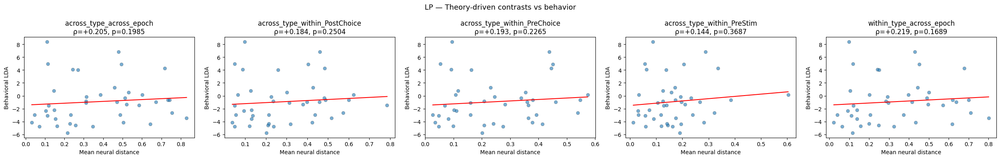


  PCA on RDM vectors:
    PC1  ( 77.2% var)  ρ = +0.216  p = 0.1743
    PC2  (  8.3% var)  ρ = -0.056  p = 0.7300
    PC3  (  3.6% var)  ρ = -0.007  p = 0.9651
    PC4  (  2.3% var)  ρ = +0.062  p = 0.7004
    PC5  (  1.9% var)  ρ = -0.086  p = 0.5933


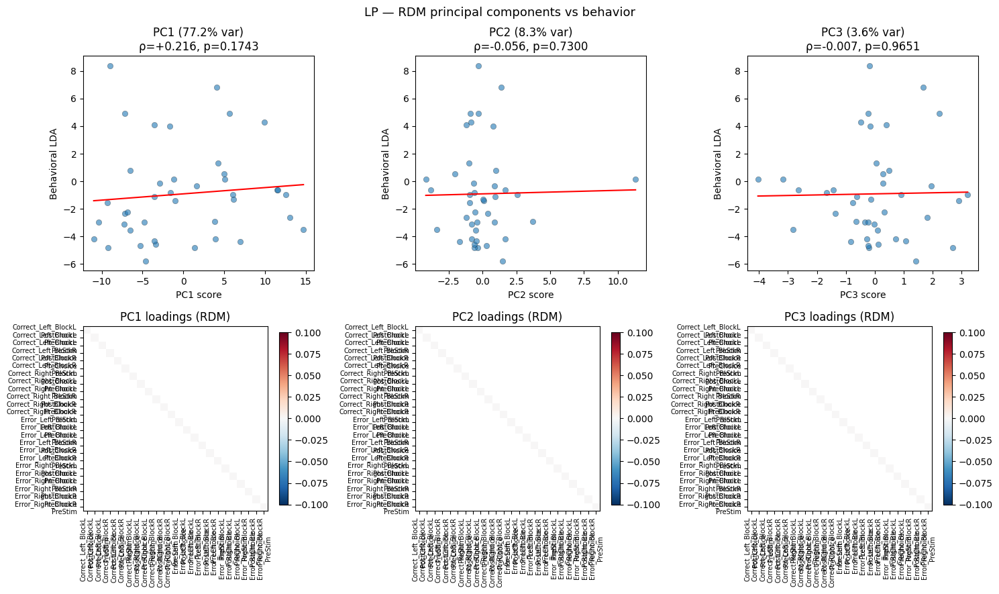


  PLS omnibus (LOO cross-validated):
    ρ(observed, predicted) = -0.072,  p = 0.5109 (permutation)


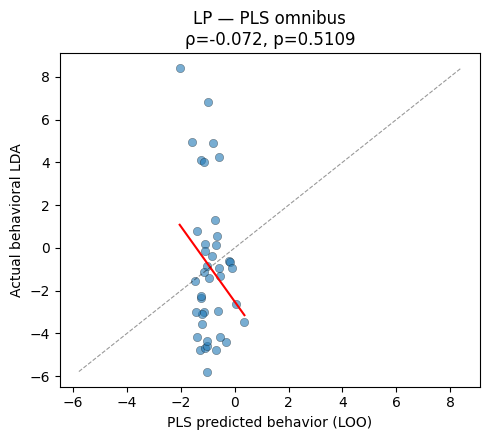


  DG  (57 sessions)

  Theory-driven contrasts:
    across_type_across_epoch                  ρ = +0.264  p = 0.0472  (n=57)
    across_type_within_PostChoice             ρ = +0.269  p = 0.0429  (n=57)
    across_type_within_PreChoice              ρ = +0.276  p = 0.0378  (n=57)
    across_type_within_PreStim                ρ = +0.251  p = 0.0595  (n=57)
    within_type_across_epoch                  ρ = +0.274  p = 0.0394  (n=57)


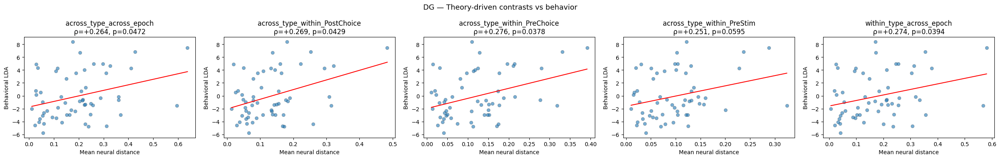


  PCA on RDM vectors:
    PC1  ( 67.7% var)  ρ = +0.277  p = 0.0370  ←
    PC2  (  7.1% var)  ρ = -0.033  p = 0.8079
    PC3  (  5.8% var)  ρ = +0.095  p = 0.4809
    PC4  (  3.1% var)  ρ = -0.138  p = 0.3070
    PC5  (  2.9% var)  ρ = -0.103  p = 0.4454


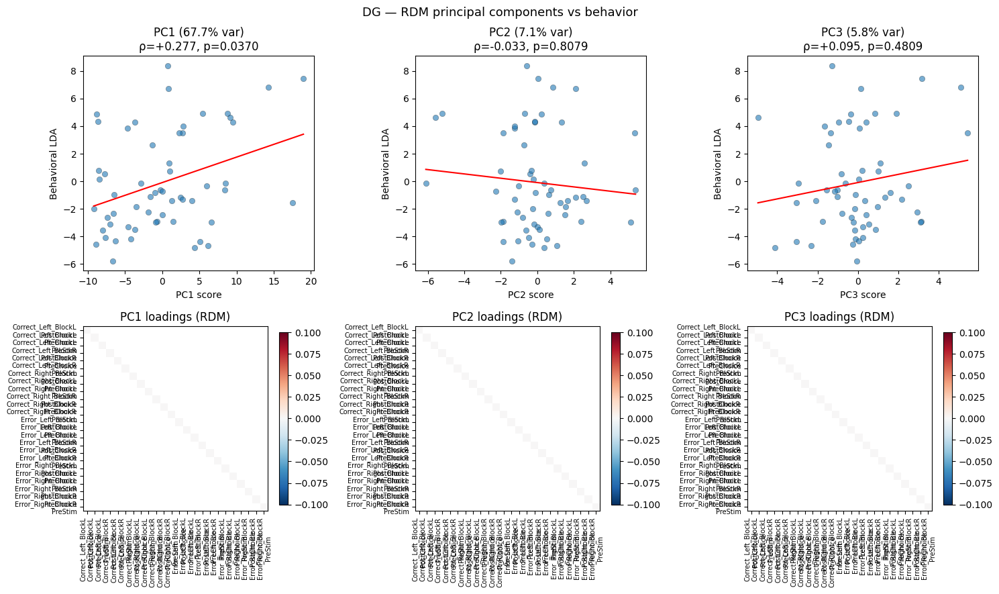


  PLS omnibus (LOO cross-validated):
    ρ(observed, predicted) = +0.208,  p = 0.0294 (permutation)


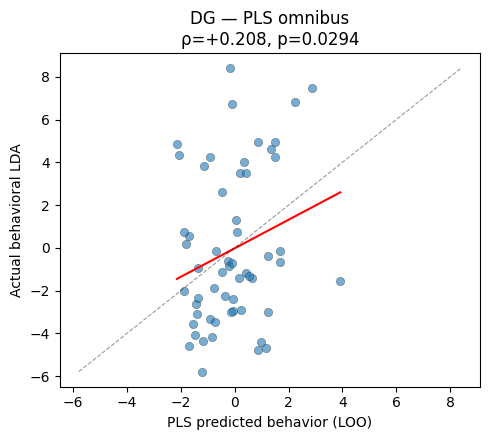


  VISa/am  (25 sessions)

  Theory-driven contrasts:
    across_type_across_epoch                  ρ = +0.028  p = 0.8954  (n=25)
    across_type_within_PostChoice             ρ = +0.145  p = 0.4877  (n=25)
    across_type_within_PreChoice              ρ = +0.382  p = 0.0596  (n=25)
    across_type_within_PreStim                ρ = +0.091  p = 0.6659  (n=25)
    within_type_across_epoch                  ρ = +0.018  p = 0.9316  (n=25)


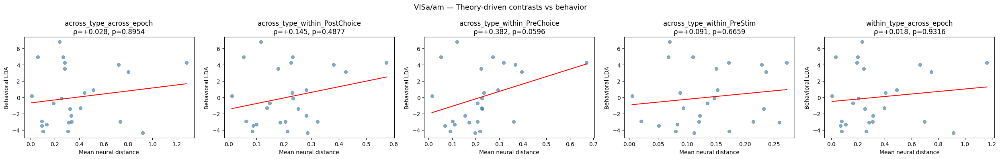


  PCA on RDM vectors:
    PC1  ( 73.6% var)  ρ = +0.075  p = 0.7214
    PC2  (  6.7% var)  ρ = +0.239  p = 0.2498
    PC3  (  4.8% var)  ρ = -0.182  p = 0.3827
    PC4  (  3.3% var)  ρ = +0.154  p = 0.4613
    PC5  (  2.6% var)  ρ = -0.288  p = 0.1628


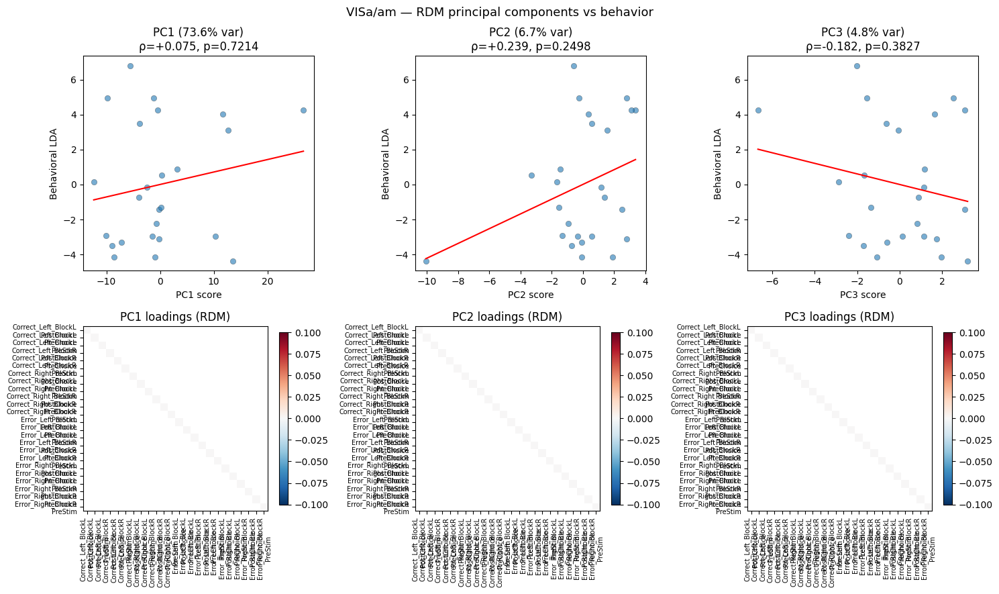


  PLS omnibus (LOO cross-validated):
    ρ(observed, predicted) = -0.138,  p = 0.5099 (permutation)


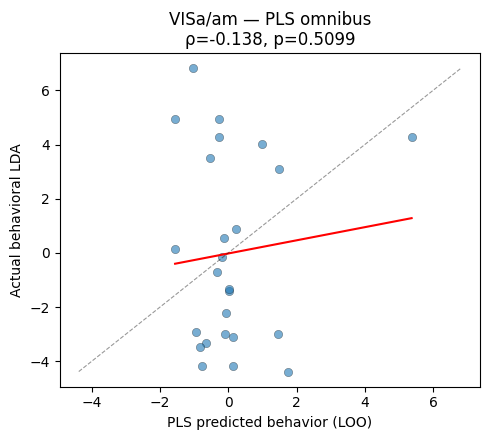


  CA1  (66 sessions)

  Theory-driven contrasts:
    across_type_across_epoch                  ρ = +0.173  p = 0.1656  (n=66)
    across_type_within_PostChoice             ρ = +0.124  p = 0.3202  (n=66)
    across_type_within_PreChoice              ρ = +0.157  p = 0.2084  (n=66)
    across_type_within_PreStim                ρ = +0.142  p = 0.2562  (n=66)
    within_type_across_epoch                  ρ = +0.154  p = 0.2160  (n=66)


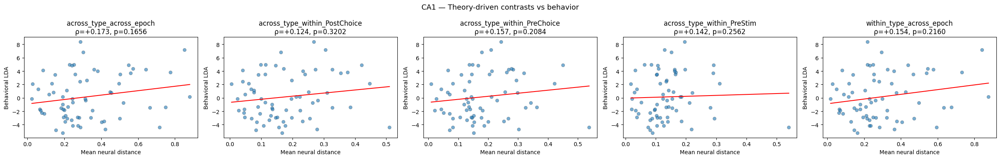


  PCA on RDM vectors:
    PC1  ( 64.4% var)  ρ = +0.172  p = 0.1662
    PC2  (  8.3% var)  ρ = -0.043  p = 0.7307
    PC3  (  7.6% var)  ρ = -0.061  p = 0.6241
    PC4  (  4.1% var)  ρ = +0.012  p = 0.9262
    PC5  (  2.7% var)  ρ = +0.116  p = 0.3539


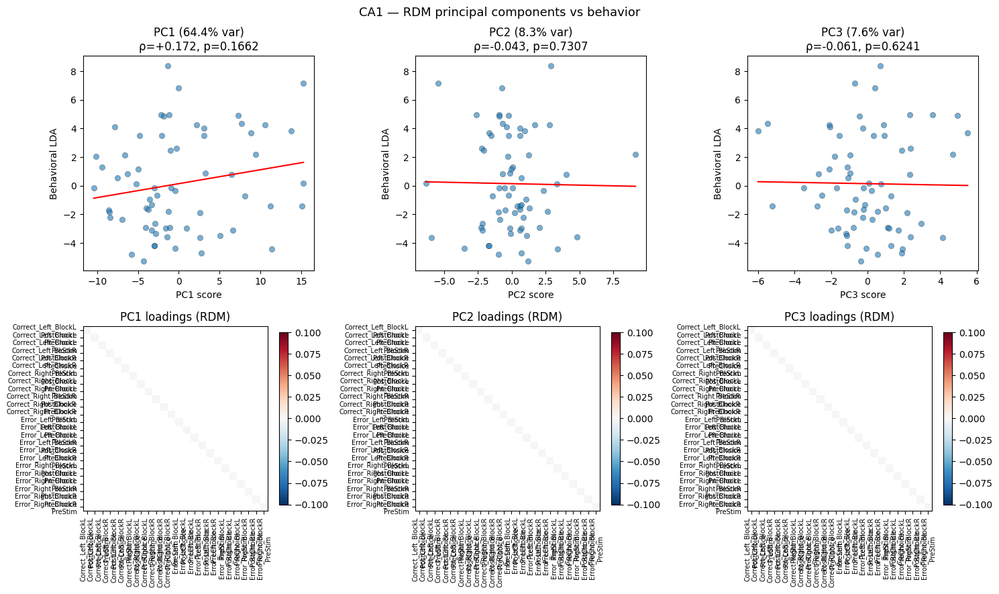


  PLS omnibus (LOO cross-validated):
    ρ(observed, predicted) = +0.066,  p = 0.2066 (permutation)


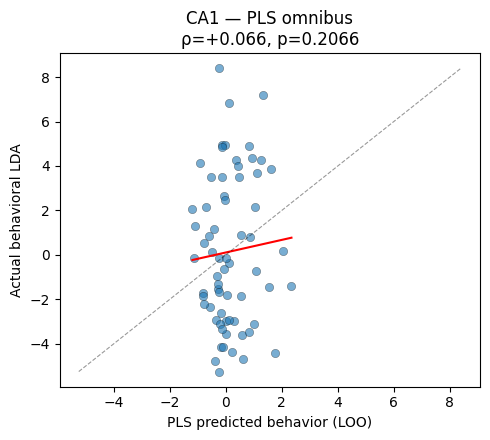


  PO  (25 sessions)

  Theory-driven contrasts:
    across_type_across_epoch                  ρ = +0.069  p = 0.7422  (n=25)
    across_type_within_PostChoice             ρ = +0.113  p = 0.5917  (n=25)
    across_type_within_PreChoice              ρ = +0.059  p = 0.7785  (n=25)
    across_type_within_PreStim                ρ = +0.079  p = 0.7065  (n=25)
    within_type_across_epoch                  ρ = +0.032  p = 0.8810  (n=25)


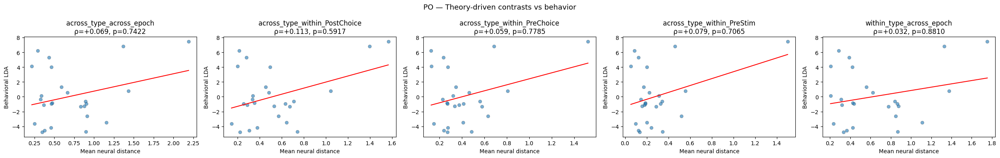


  PCA on RDM vectors:
    PC1  ( 82.6% var)  ρ = +0.049  p = 0.8166
    PC2  (  7.9% var)  ρ = -0.074  p = 0.7243
    PC3  (  2.5% var)  ρ = -0.157  p = 0.4548
    PC4  (  1.5% var)  ρ = -0.294  p = 0.1539
    PC5  (  1.1% var)  ρ = +0.274  p = 0.1846


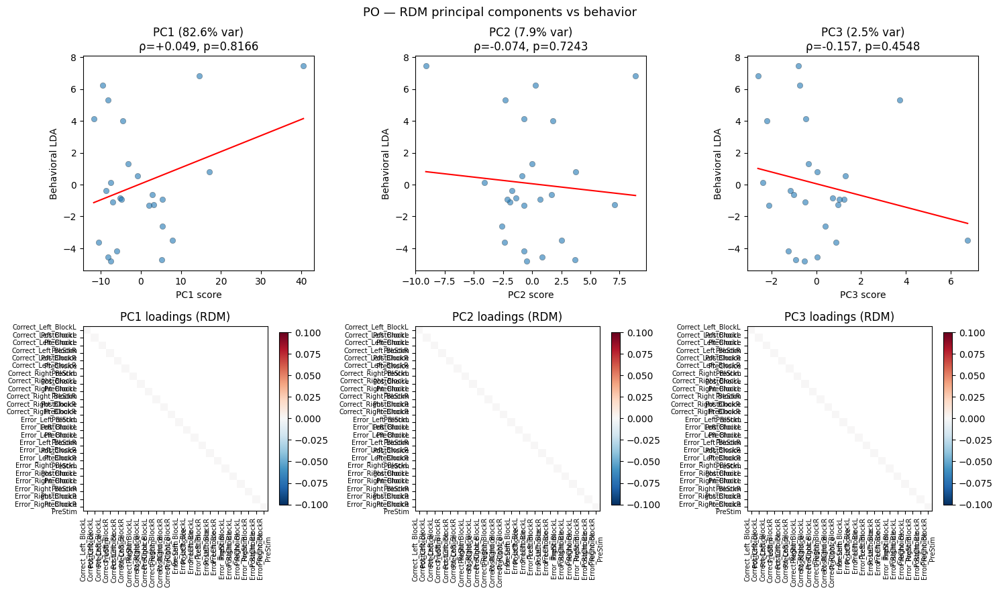


  PLS omnibus (LOO cross-validated):
    ρ(observed, predicted) = -0.349,  p = 0.6337 (permutation)


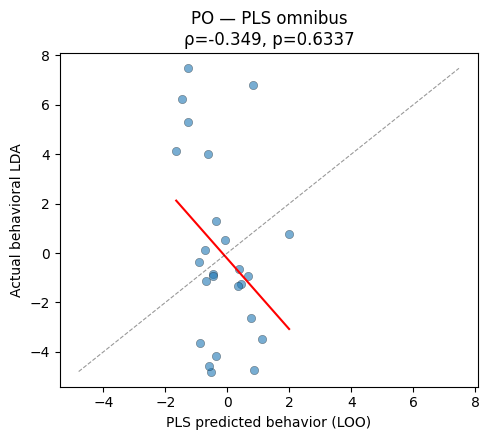

In [ ]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr, permutation_test
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import LeaveOneOut, cross_val_predict
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# --- Setup (same as before) ---

lda_per_session = dict(zip(lda['session'], lda[0]))
rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

MIN_SESSIONS = 10


def build_session_rdms(rsa_df, pids, region, tt_to_idx, n_conds, lda_per_session):
    rdm_cubes, lda_list = [], []
    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]
        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]
        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))
        full = np.full((n_conds, n_conds), np.nan)
        for i_s, i_f in enumerate(present_indices):
            for j_s, j_f in enumerate(present_indices):
                full[i_f, j_f] = small_dist[i_s, j_s]
        rdm_cubes.append(full)
        lda_list.append(lda_per_session[session])
    return np.stack(rdm_cubes), np.array(lda_list)


# ============================================================
# STRATEGY 1: Theory-driven contrasts (few tests, no FDR pain)
# ============================================================

def classify_pair(label_i, label_j):
    """Classify a condition pair into a meaningful category."""
    type_i, epoch_i = label_i.split(' | ')
    type_j, epoch_j = label_j.split(' | ')

    same_type = (type_i == type_j)
    same_epoch = (epoch_i == epoch_j)

    if same_type and same_epoch:
        return None  # same condition, diagonal
    elif not same_type and same_epoch:
        return f'across_type_within_{epoch_i}'   # go vs nogo in same epoch
    elif same_type and not same_epoch:
        return f'within_type_across_epoch'        # same type, different epochs
    else:
        return f'across_type_across_epoch'        # different type AND epoch


def compute_theory_contrasts(rdm_cube, condition_labels):
    """Average RDM entries into theory-driven contrasts per session."""
    n_sessions = rdm_cube.shape[0]
    pair_categories = {}

    for i in range(len(condition_labels)):
        for j in range(i + 1, len(condition_labels)):
            cat = classify_pair(condition_labels[i], condition_labels[j])
            if cat is None:
                continue
            if cat not in pair_categories:
                pair_categories[cat] = []
            pair_categories[cat].append((i, j))

    contrasts = {}
    for cat, pairs in pair_categories.items():
        vals = np.full(n_sessions, np.nan)
        for s in range(n_sessions):
            d = [rdm_cube[s, i, j] for i, j in pairs if not np.isnan(rdm_cube[s, i, j])]
            if len(d) > 0:
                vals[s] = np.mean(d)
        contrasts[cat] = vals

    return contrasts


# ============================================================
# STRATEGY 2: PCA on RDM variation → correlate PCs with behavior
# ============================================================

def rdm_pca_analysis(rdm_cube, behavior, n_components=5):
    """PCA on session RDM vectors, correlate components with behavior."""
    n_sessions = rdm_cube.shape[0]
    idx = np.triu_indices(rdm_cube.shape[1], k=1)
    rdm_vectors = np.array([rdm_cube[s][idx] for s in range(n_sessions)])

    # Use only columns valid across all sessions
    valid_cols = ~np.any(np.isnan(rdm_vectors), axis=0)
    if valid_cols.sum() < 3:
        return None
    X = rdm_vectors[:, valid_cols]

    # Z-score columns (center each distance)
    X = (X - X.mean(axis=0)) / (X.std(axis=0) + 1e-10)

    n_comp = min(n_components, X.shape[0] - 1, X.shape[1])
    pca = PCA(n_components=n_comp)
    scores = pca.fit_transform(X)

    results = []
    for k in range(n_comp):
        r, p = spearmanr(scores[:, k], behavior)
        results.append(dict(pc=k + 1, r=r, p=p,
                            var_explained=pca.explained_variance_ratio_[k]))

    # Reconstruct each PC as an RDM for interpretation
    pc_rdms = []
    for k in range(n_comp):
        loadings = np.full(len(idx[0]), np.nan)
        loadings[valid_cols] = pca.components_[k]
        rdm = np.full((rdm_cube.shape[1], rdm_cube.shape[1]), np.nan)
        rdm[idx] = loadings
        rdm = rdm + rdm.T
        np.fill_diagonal(rdm, 0)
        pc_rdms.append(rdm)

    return dict(scores=scores, pca=pca, results=results,
                pc_rdms=pc_rdms, X=X, valid_cols=valid_cols)


# ============================================================
# STRATEGY 3: PLS — single omnibus test with permutation
# ============================================================

def pls_omnibus(rdm_cube, behavior, n_perm=5000, seed=42):
    """Does ANY linear combination of RDM entries predict behavior?
    Permutation-tested LOO cross-validated PLS."""
    n_sessions = rdm_cube.shape[0]
    idx = np.triu_indices(rdm_cube.shape[1], k=1)
    rdm_vectors = np.array([rdm_cube[s][idx] for s in range(n_sessions)])

    valid_cols = ~np.any(np.isnan(rdm_vectors), axis=0)
    if valid_cols.sum() < 3:
        return None
    X = rdm_vectors[:, valid_cols]
    X = (X - X.mean(axis=0)) / (X.std(axis=0) + 1e-10)
    y = behavior

    # LOO cross-validated prediction
    pls = PLSRegression(n_components=1, scale=False)
    y_pred = cross_val_predict(pls, X, y, cv=LeaveOneOut())
    observed_r, _ = spearmanr(y, y_pred)

    # Permutation null
    rng = np.random.default_rng(seed)
    count = 0
    for _ in range(n_perm):
        y_shuf = rng.permutation(y)
        y_pred_shuf = cross_val_predict(pls, X, y_shuf, cv=LeaveOneOut())
        r_shuf, _ = spearmanr(y_shuf, y_pred_shuf)
        if r_shuf >= observed_r:
            count += 1

    p = (count + 1) / (n_perm + 1)
    return dict(r=observed_r, p=p, y_pred=y_pred)


# ============================================================
# Main loop + visualization
# ============================================================

for region in regions:
    rdm_cube, lda_arr = build_session_rdms(rsa_df, pids, region, tt_to_idx,
                                            n_conds, lda_per_session)
    if len(lda_arr) < MIN_SESSIONS:
        print(f'{region}: only {len(lda_arr)} sessions, skipping')
        continue

    print(f'\n{"="*60}')
    print(f'  {region}  ({len(lda_arr)} sessions)')
    print(f'{"="*60}')

    # --- Strategy 1: Theory-driven contrasts ---
    contrasts = compute_theory_contrasts(rdm_cube, all_condition_labels)

    fig, axes = plt.subplots(1, len(contrasts), figsize=(5 * len(contrasts), 4))
    fig.suptitle(f'{region} — Theory-driven contrasts vs behavior', fontsize=13)
    if len(contrasts) == 1:
        axes = [axes]

    print('\n  Theory-driven contrasts:')
    for ax, (cat, vals) in zip(axes, sorted(contrasts.items())):
        valid = ~np.isnan(vals)
        if valid.sum() < MIN_SESSIONS:
            ax.set_title(f'{cat}\n(insufficient data)')
            continue
        r, p = spearmanr(vals[valid], lda_arr[valid])
        print(f'    {cat:40s}  ρ = {r:+.3f}  p = {p:.4f}  (n={valid.sum()})')

        ax.scatter(vals[valid], lda_arr[valid], alpha=0.6, edgecolors='k', linewidths=0.3)
        z = np.polyfit(vals[valid], lda_arr[valid], 1)
        xl = np.linspace(np.nanmin(vals[valid]), np.nanmax(vals[valid]), 50)
        ax.plot(xl, np.polyval(z, xl), 'r-', lw=1.5)
        ax.set_xlabel('Mean neural distance')
        ax.set_ylabel('Behavioral LDA')
        ax.set_title(f'{cat}\nρ={r:+.3f}, p={p:.4f}')

    plt.tight_layout()
    plt.show()

    # --- Strategy 2: PCA on RDM variation ---
    pca_res = rdm_pca_analysis(rdm_cube, lda_arr)

    if pca_res is not None:
        res_df = pca_res['results']
        n_pcs = len(res_df)

        print('\n  PCA on RDM vectors:')
        for r_dict in res_df:
            marker = '  ←' if r_dict['p'] < 0.05 else ''
            print(f'    PC{r_dict["pc"]}  ({r_dict["var_explained"]*100:5.1f}% var)  '
                  f'ρ = {r_dict["r"]:+.3f}  p = {r_dict["p"]:.4f}{marker}')

        # Plot: top PCs scatter + their RDM loadings
        n_show = min(3, n_pcs)
        fig, axes = plt.subplots(2, n_show, figsize=(5 * n_show, 9))
        fig.suptitle(f'{region} — RDM principal components vs behavior', fontsize=13)
        if n_show == 1:
            axes = axes.reshape(2, 1)

        short_labels = [c.replace(' | ', '\n') for c in all_condition_labels]

        for k in range(n_show):
            rd = res_df[k]

            # Top: scatter
            ax = axes[0, k]
            ax.scatter(pca_res['scores'][:, k], lda_arr, alpha=0.6,
                       edgecolors='k', linewidths=0.3)
            z = np.polyfit(pca_res['scores'][:, k], lda_arr, 1)
            xl = np.linspace(pca_res['scores'][:, k].min(),
                             pca_res['scores'][:, k].max(), 50)
            ax.plot(xl, np.polyval(z, xl), 'r-', lw=1.5)
            ax.set_xlabel(f'PC{rd["pc"]} score')
            ax.set_ylabel('Behavioral LDA')
            ax.set_title(f'PC{rd["pc"]} ({rd["var_explained"]*100:.1f}% var)\n'
                         f'ρ={rd["r"]:+.3f}, p={rd["p"]:.4f}')

            # Bottom: PC loadings as RDM
            ax = axes[1, k]
            rdm_k = pca_res['pc_rdms'][k]
            vmax = np.nanmax(np.abs(rdm_k))
            im = ax.imshow(rdm_k, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
            ax.set_xticks(range(n_conds))
            ax.set_xticklabels(short_labels, rotation=90, fontsize=7)
            ax.set_yticks(range(n_conds))
            ax.set_yticklabels(short_labels, fontsize=7)
            ax.set_title(f'PC{rd["pc"]} loadings (RDM)')
            plt.colorbar(im, ax=ax, shrink=0.8)

        plt.tight_layout()
        plt.show()

    # --- Strategy 3: PLS omnibus ---
    pls_res = pls_omnibus(rdm_cube, lda_arr)

    if pls_res is not None:
        print(f'\n  PLS omnibus (LOO cross-validated):')
        print(f'    ρ(observed, predicted) = {pls_res["r"]:+.3f},  '
              f'p = {pls_res["p"]:.4f} (permutation)')

        fig, ax = plt.subplots(figsize=(5, 4.5))
        ax.scatter(pls_res['y_pred'], lda_arr, alpha=0.6, edgecolors='k', linewidths=0.3)
        z = np.polyfit(pls_res['y_pred'], lda_arr, 1)
        xl = np.linspace(pls_res['y_pred'].min(), pls_res['y_pred'].max(), 50)
        ax.plot(xl, np.polyval(z, xl), 'r-', lw=1.5)
        ax.set_xlabel('PLS predicted behavior (LOO)')
        ax.set_ylabel('Actual behavioral LDA')
        ax.set_title(f'{region} — PLS omnibus\n'
                     f'ρ={pls_res["r"]:+.3f}, p={pls_res["p"]:.4f}')
        ax.plot([lda_arr.min(), lda_arr.max()], [lda_arr.min(), lda_arr.max()],
                'k--', lw=0.8, alpha=0.4)
        plt.tight_layout()
        plt.show()


  LP  |  n=41 sessions  |  66 RDM features  →  4 PCs (90% var)

  Model                     Feat        ρ       r    RMSE     p(ρ)
  ------------------------------------------------------------
  SVR (RBF)                 raw   +0.068   -0.024   3.5235  0.6721
  SVR (RBF)                 PCA   -0.006   -0.094   3.5924  0.9690
  GBM                       PCA   -0.051   -0.115   4.0186  0.7512
  PLS (1 comp)              raw   -0.065   -0.242   3.5297  0.6860
  SVR (linear)              PCA   -0.074   -0.112   3.6362  0.6470
  Lasso (α=0.1)             raw   -0.086   -0.201   4.0739  0.5918
  ElasticNet                raw   -0.097   -0.207   4.1001  0.5475
  SVR (linear)              raw   -0.175   -0.231   4.7410  0.2727
  KNN (k=5)                 PCA   -0.189   -0.247   3.8576  0.2376
  Ridge (α=10)              raw   -0.216   -0.287   4.0477  0.1741
  KNN (k=5)                 raw   -0.237   -0.323   4.0184  0.1362
  Ridge (α=1)               raw   -0.239   -0.225   5.3049  0.1321
 

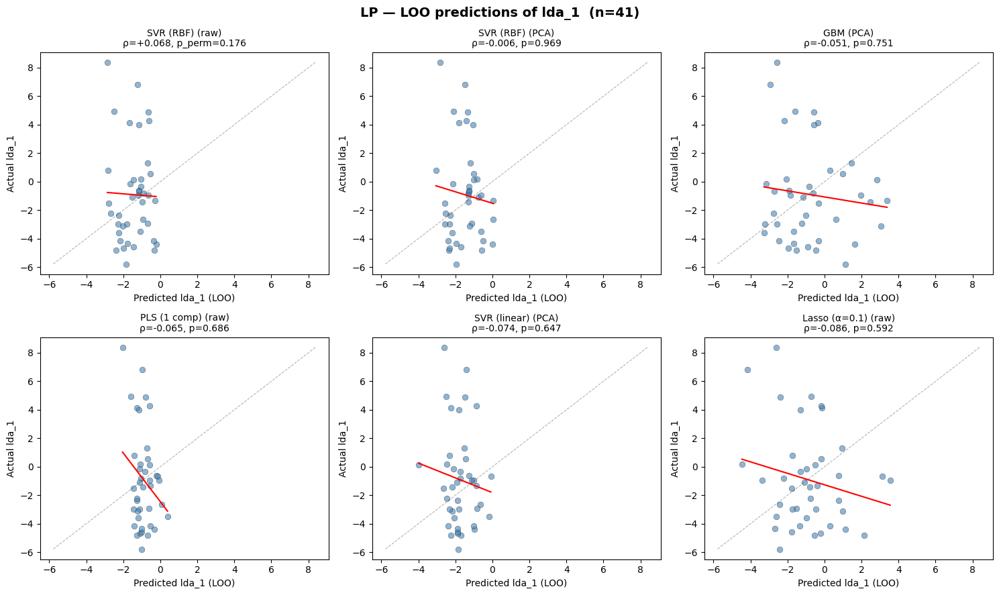

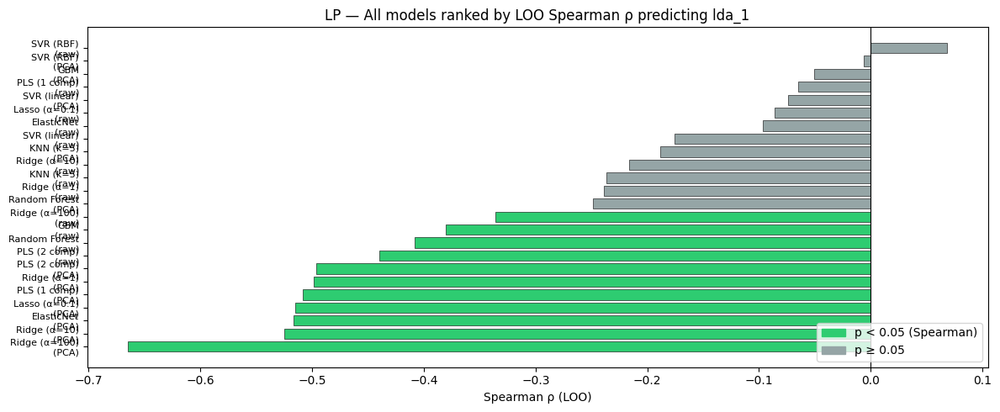


  DG  |  n=57 sessions  |  66 RDM features  →  7 PCs (90% var)

  Model                     Feat        ρ       r    RMSE     p(ρ)
  ------------------------------------------------------------
  GBM                       PCA   +0.388   +0.349   3.3724  0.0029 ←
  Random Forest             PCA   +0.215   +0.179   3.5881  0.1080
  PLS (1 comp)              raw   +0.211   +0.242   3.4958  0.1143
  SVR (RBF)                 raw   +0.143   +0.150   3.7273  0.2875
  GBM                       raw   +0.100   +0.057   3.9094  0.4571
  Ridge (α=100)             raw   +0.082   +0.135   3.6333  0.5422
  Random Forest             raw   +0.067   +0.092   3.7599  0.6225
  Lasso (α=0.1)             raw   +0.064   +0.043   3.9998  0.6358
  PLS (1 comp)              PCA   +0.059   +0.064   3.7703  0.6652
  Ridge (α=1)               PCA   +0.050   +0.079   3.8149  0.7120
  PLS (2 comp)              PCA   +0.049   +0.081   3.8211  0.7170
  Ridge (α=10)              PCA   +0.043   +0.071   3.7415  0.7516

KeyboardInterrupt: 

In [117]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr, pearsonr
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import LeaveOneOut, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# --- Setup ---

# Use lda_1 instead of lda column 0
lda1_per_session = dict(zip(lda['session'], lda[0]))

rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda1_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

MIN_SESSIONS = 10


def build_session_rdms(rsa_df, pids, region, tt_to_idx, n_conds, lda_per_session):
    rdm_cubes, lda_list = [], []
    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]
        if session not in lda_per_session:
            continue
        present_types = subset['condition_label'].values
        present_indices = [tt_to_idx[tt] for tt in present_types]
        mat = np.stack(subset['neuron_vector'].values)
        small_dist = squareform(pdist(mat, metric='euclidean'))
        full = np.full((n_conds, n_conds), np.nan)
        for i_s, i_f in enumerate(present_indices):
            for j_s, j_f in enumerate(present_indices):
                full[i_f, j_f] = small_dist[i_s, j_s]
        rdm_cubes.append(full)
        lda_list.append(lda_per_session[session])
    return np.stack(rdm_cubes), np.array(lda_list)


def rdm_cube_to_features(rdm_cube):
    """Flatten upper triangle of each session's RDM into a feature vector,
    keeping only columns valid (non-NaN) across ALL sessions."""
    n_sessions = rdm_cube.shape[0]
    idx = np.triu_indices(rdm_cube.shape[1], k=1)
    rdm_vectors = np.array([rdm_cube[s][idx] for s in range(n_sessions)])
    valid_cols = ~np.any(np.isnan(rdm_vectors), axis=0)
    if valid_cols.sum() < 3:
        return None, None, None
    X = rdm_vectors[:, valid_cols]
    return X, valid_cols, idx


# ============================================================
# Define model zoo
# ============================================================

def get_models():
    """Return dict of name → sklearn Pipeline (scaler + regressor)."""
    return {
        'Ridge (α=1)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', Ridge(alpha=1.0))
        ]),
        'Ridge (α=10)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', Ridge(alpha=10.0))
        ]),
        'Ridge (α=100)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', Ridge(alpha=100.0))
        ]),
        'Lasso (α=0.1)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', Lasso(alpha=0.1, max_iter=10000))
        ]),
        'ElasticNet': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', ElasticNet(alpha=0.1, l1_ratio=0.5, max_iter=10000))
        ]),
        'SVR (RBF)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', SVR(kernel='rbf', C=1.0))
        ]),
        'SVR (linear)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', SVR(kernel='linear', C=1.0))
        ]),
        'KNN (k=5)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', KNeighborsRegressor(n_neighbors=5))
        ]),
        'Random Forest': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', RandomForestRegressor(n_estimators=100, max_depth=3,
                                          random_state=42))
        ]),
        'GBM': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', GradientBoostingRegressor(n_estimators=100, max_depth=2,
                                              learning_rate=0.05,
                                              subsample=0.8,
                                              random_state=42))
        ]),
        'PLS (1 comp)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', PLSRegression(n_components=1, scale=False))
        ]),
        'PLS (2 comp)': Pipeline([
            ('scaler', StandardScaler()),
            ('reg', PLSRegression(n_components=2, scale=False))
        ]),
    }


# ============================================================
# Permutation test wrapper
# ============================================================

def permutation_loo_test(model, X, y, observed_r, n_perm=2000, seed=42):
    """One-sided permutation test on LOO Spearman ρ."""
    rng = np.random.default_rng(seed)
    count = 0
    for _ in range(n_perm):
        y_shuf = rng.permutation(y)
        try:
            y_pred_shuf = cross_val_predict(model, X, y_shuf, cv=LeaveOneOut())
            y_pred_shuf = np.asarray(y_pred_shuf).ravel()
            r_shuf, _ = spearmanr(y_shuf, y_pred_shuf)
        except Exception:
            continue
        if r_shuf >= observed_r:
            count += 1
    return (count + 1) / (n_perm + 1)


# ============================================================
# Optional: PCA pre-reduction before fitting
# ============================================================

def pca_reduce(X, variance_retained=0.90):
    """Reduce features via PCA, keeping enough components for `variance_retained`."""
    n_comp = min(X.shape[0] - 1, X.shape[1])
    pca = PCA(n_components=n_comp)
    X_pca = pca.fit_transform(X)
    cumvar = np.cumsum(pca.explained_variance_ratio_)
    n_keep = np.searchsorted(cumvar, variance_retained) + 1
    n_keep = max(n_keep, 1)
    return X_pca[:, :n_keep], pca, n_keep


# ============================================================
# Main loop
# ============================================================

all_results = []

for region in regions:
    rdm_cube, lda_arr = build_session_rdms(rsa_df, pids, region, tt_to_idx,
                                            n_conds, lda1_per_session)
    if len(lda_arr) < MIN_SESSIONS:
        print(f'{region}: only {len(lda_arr)} sessions, skipping')
        continue

    X_raw, valid_cols, tri_idx = rdm_cube_to_features(rdm_cube)
    if X_raw is None:
        print(f'{region}: insufficient valid RDM features, skipping')
        continue

    # Also try PCA-reduced version
    scaler_tmp = StandardScaler()
    X_scaled = scaler_tmp.fit_transform(X_raw)
    X_pca, pca_obj, n_keep = pca_reduce(X_scaled, variance_retained=0.90)

    print(f'\n{"="*70}')
    print(f'  {region}  |  n={len(lda_arr)} sessions  |  '
          f'{X_raw.shape[1]} RDM features  →  {n_keep} PCs (90% var)')
    print(f'{"="*70}')

    y = lda_arr.copy()
    models = get_models()

    region_results = []

    for name, model in models.items():
        for feat_label, X_use in [('raw', X_raw), ('PCA', X_pca)]:
            try:
                y_pred = cross_val_predict(model, X_use, y, cv=LeaveOneOut())
                y_pred = np.asarray(y_pred).ravel()
                rho, p_spearman = spearmanr(y, y_pred)
                r_pearson, _ = pearsonr(y, y_pred)
                rmse = np.sqrt(np.mean((y - y_pred) ** 2))
            except Exception as e:
                continue

            region_results.append(dict(
                region=region, model=name, features=feat_label,
                rho=rho, r_pearson=r_pearson, rmse=rmse,
                p_spearman=p_spearman, y_pred=y_pred.copy()
            ))

    # Sort by Spearman ρ descending
    region_results.sort(key=lambda x: x['rho'], reverse=True)

    print(f'\n  {"Model":<25s} {"Feat":<5s} {"ρ":>7s} {"r":>7s} '
          f'{"RMSE":>7s} {"p(ρ)":>8s}')
    print(f'  {"-"*60}')
    for res in region_results:
        marker = ' ←' if res['p_spearman'] < 0.05 else ''
        print(f'  {res["model"]:<25s} {res["features"]:<5s} '
              f'{res["rho"]:+.3f}   {res["r_pearson"]:+.3f}   '
              f'{res["rmse"]:.4f}  {res["p_spearman"]:.4f}{marker}')

    all_results.extend(region_results)

    # --- Permutation test top 3 models ---
    top3 = region_results[:1]
    print(f'\n  Permutation tests (top 3):')
    for res in top3:
        feat_label = res['features']
        X_use = X_raw if feat_label == 'raw' else X_pca
        model = get_models()[res['model']]
        p_perm = permutation_loo_test(model, X_use, y, res['rho'], n_perm=2000)
        res['p_perm'] = p_perm
        marker = ' ***' if p_perm < 0.01 else (' **' if p_perm < 0.05 else '')
        print(f'    {res["model"]:<25s} ({feat_label})  '
              f'ρ={res["rho"]:+.3f}  p_perm={p_perm:.4f}{marker}')

    # --- Visualization: top 6 models scatter ---
    n_show = min(6, len(region_results))
    ncols = 3
    nrows = int(np.ceil(n_show / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows))
    axes = np.atleast_2d(axes)
    fig.suptitle(f'{region} — LOO predictions of lda_1  (n={len(y)})',
                 fontsize=14, fontweight='bold')

    for i in range(n_show):
        ax = axes.flat[i]
        res = region_results[i]
        ax.scatter(res['y_pred'], y, alpha=0.6, edgecolors='k', linewidths=0.3,
                   s=40, c='steelblue')
        # Fit line
        z = np.polyfit(res['y_pred'], y, 1)
        xl = np.linspace(res['y_pred'].min(), res['y_pred'].max(), 50)
        ax.plot(xl, np.polyval(z, xl), 'r-', lw=1.5)
        # Identity line
        lo, hi = min(y.min(), res['y_pred'].min()), max(y.max(), res['y_pred'].max())
        ax.plot([lo, hi], [lo, hi], 'k--', lw=0.8, alpha=0.3)
        ax.set_xlabel('Predicted lda_1 (LOO)')
        ax.set_ylabel('Actual lda_1')
        p_str = f'p_perm={res["p_perm"]:.3f}' if 'p_perm' in res else f'p={res["p_spearman"]:.3f}'
        ax.set_title(f'{res["model"]} ({res["features"]})\n'
                     f'ρ={res["rho"]:+.3f}, {p_str}', fontsize=10)

    # Hide unused axes
    for i in range(n_show, nrows * ncols):
        axes.flat[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # --- Visualization: bar chart of all models ---
    fig, ax = plt.subplots(figsize=(12, 5))
    labels = [f'{r["model"]}\n({r["features"]})' for r in region_results]
    rhos = [r['rho'] for r in region_results]
    colors = ['#2ecc71' if r['p_spearman'] < 0.05 else '#95a5a6' for r in region_results]
    bars = ax.barh(range(len(labels)), rhos, color=colors, edgecolor='k', linewidth=0.4)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel('Spearman ρ (LOO)')
    ax.set_title(f'{region} — All models ranked by LOO Spearman ρ predicting lda_1')
    ax.axvline(0, color='k', lw=0.8)
    ax.invert_yaxis()
    green_patch = mpatches.Patch(color='#2ecc71', label='p < 0.05 (Spearman)')
    gray_patch = mpatches.Patch(color='#95a5a6', label='p ≥ 0.05')
    ax.legend(handles=[green_patch, gray_patch], loc='lower right')
    plt.tight_layout()
    plt.show()

# ============================================================
# Summary table across all regions
# ============================================================

summary = pd.DataFrame(all_results)
summary = summary.drop(columns=['y_pred'], errors='ignore')
best_per_region = summary.loc[summary.groupby('region')['rho'].idxmax()]

print(f'\n{"="*70}')
print('  BEST MODEL PER REGION (by LOO Spearman ρ)')
print(f'{"="*70}')
print(best_per_region[['region', 'model', 'features', 'rho', 'r_pearson',
                        'rmse', 'p_spearman']].to_string(index=False))


  LP  (41 sessions)

  Geometric measure correlations with behavior:
    participation_ratio        ρ = +0.062  p = 0.7017  (n=41)
    parallelism                ρ = -0.014  p = 0.9293  (n=41)
    ccgp                       ρ = -0.232  p = 0.1441  (n=41)
    category_margin            ρ = -0.088  p = 0.5828  (n=41)
    cka_linear                 ρ = -0.107  p = 0.5045  (n=41)
    cka_rbf                    ρ = -0.089  p = 0.5799  (n=41)


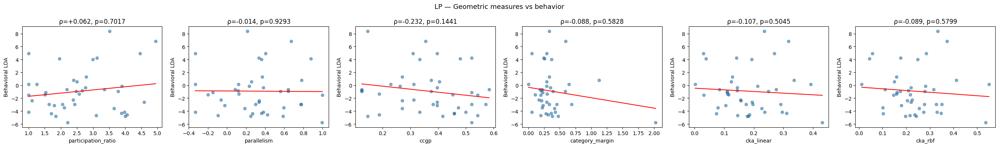

KeyboardInterrupt: 

In [109]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import LeaveOneOut, cross_val_predict
import matplotlib.pyplot as plt

# --- Setup ---

lda_per_session = dict(zip(lda['session'], lda[0]))
rsa_df = pd.DataFrame(rsa_records)
rsa_df = rsa_df[rsa_df['session'].isin(lda_per_session.keys())]
rsa_df['condition_label'] = rsa_df['trial_type'] + ' | ' + rsa_df['epoch']

all_condition_labels = sorted(rsa_df['condition_label'].unique())
n_conds = len(all_condition_labels)
tt_to_idx = {tt: i for i, tt in enumerate(all_condition_labels)}

regions = rsa_df['region'].unique()
pids = rsa_df['pid'].unique()

MIN_SESSIONS = 10


# ============================================================
# 1. GEOMETRIC MEASURES (one scalar per session)
#    These capture *structure*, not just distances
# ============================================================

def compute_geometric_measures(neuron_vectors, trial_types, epochs):
    """
    From condition-averaged population vectors for one session,
    extract geometric properties of the representational manifold.

    Parameters
    ----------
    neuron_vectors : (n_conditions, n_neurons)
    trial_types    : list, e.g. ['go', 'go', 'nogo', 'nogo']
    epochs         : list, e.g. ['baseline', 'stimulus', 'baseline', 'stimulus']
    """
    unique_types = sorted(set(trial_types))
    unique_epochs = sorted(set(epochs))
    results = {}

    # --- Participation ratio (effective dimensionality) ---
    # Fewer dimensions = more compressed/efficient code → possibly better behavior
    centered = neuron_vectors - neuron_vectors.mean(axis=0)
    # Use neuron×neuron covariance if n_neurons < n_conditions, else condition×condition
    if centered.shape[1] >= centered.shape[0]:
        gram = centered @ centered.T
    else:
        gram = centered.T @ centered
    eigs = np.linalg.eigvalsh(gram)
    eigs = eigs[eigs > 1e-10]
    results['participation_ratio'] = (eigs.sum() ** 2) / ((eigs ** 2).sum()) if len(eigs) > 0 else np.nan

    # --- Parallelism: are coding directions consistent across epochs? ---
    # High parallelism = abstract, context-invariant code → better generalization
    coding_dirs = {}
    for epoch in unique_epochs:
        centroids = {}
        for tt in unique_types:
            mask = [(t == tt and e == epoch) for t, e in zip(trial_types, epochs)]
            if any(mask):
                centroids[tt] = neuron_vectors[mask].mean(axis=0)
        if len(centroids) >= 2:
            tt_list = sorted(centroids.keys())
            d = centroids[tt_list[1]] - centroids[tt_list[0]]
            norm = np.linalg.norm(d)
            if norm > 1e-10:
                coding_dirs[epoch] = d / norm

    if len(coding_dirs) >= 2:
        keys = sorted(coding_dirs.keys())
        cos_sims = [np.dot(coding_dirs[keys[a]], coding_dirs[keys[b]])
                     for a in range(len(keys)) for b in range(a + 1, len(keys))]
        results['parallelism'] = np.mean(cos_sims)
    else:
        results['parallelism'] = np.nan

    # --- CCGP: cross-condition generalization performance ---
    # Train go/nogo boundary in one epoch, test in another
    ccgp_scores = []
    for train_ep in unique_epochs:
        train_centroids = {}
        for tt in unique_types:
            mask = [(t == tt and e == train_ep) for t, e in zip(trial_types, epochs)]
            if any(mask):
                train_centroids[tt] = neuron_vectors[mask].mean(axis=0)
        if len(train_centroids) < 2:
            continue
        tt_list = sorted(train_centroids.keys())
        direction = train_centroids[tt_list[1]] - train_centroids[tt_list[0]]
        midpoint = (train_centroids[tt_list[0]] + train_centroids[tt_list[1]]) / 2

        for test_ep in unique_epochs:
            if test_ep == train_ep:
                continue
            for tt_idx, tt in enumerate(tt_list):
                mask = [(t == tt and e == test_ep) for t, e in zip(trial_types, epochs)]
                if any(mask):
                    proj = np.dot(neuron_vectors[mask].mean(axis=0) - midpoint, direction)
                    ccgp_scores.append(float((proj > 0) == (tt_idx == 1)))

    results['ccgp'] = np.mean(ccgp_scores) if ccgp_scores else np.nan

    # --- Category margin: between-type separation / within-type spread ---
    type_centroids = {}
    within_dists = []
    for tt in unique_types:
        mask = [t == tt for t in trial_types]
        vecs = neuron_vectors[mask]
        type_centroids[tt] = vecs.mean(axis=0)
        if len(vecs) > 1:
            within_dists.append(np.mean(pdist(vecs)))

    if len(type_centroids) >= 2:
        tt_list = sorted(type_centroids.keys())
        between = np.linalg.norm(type_centroids[tt_list[1]] - type_centroids[tt_list[0]])
        within = np.mean(within_dists) if within_dists else 1e-10
        results['category_margin'] = between / (within + 1e-10)
    else:
        results['category_margin'] = np.nan

    # --- Alignment with task model (CKA) ---
    # Does the neural similarity structure match the task-relevant structure?
    # Task model: same trial_type → similar, different → dissimilar
    n = len(trial_types)
    task_kernel = np.array([[1.0 if trial_types[a] == trial_types[b] else -1.0
                              for b in range(n)] for a in range(n)])
    neural_kernel = neuron_vectors @ neuron_vectors.T  # linear kernel
    results['cka_linear'] = _cka(neural_kernel, task_kernel)

    # RBF kernel version (captures non-linear neural geometry)
    dists = squareform(pdist(neuron_vectors, 'euclidean'))
    sigma = np.median(dists[dists > 0]) if np.any(dists > 0) else 1.0
    neural_kernel_rbf = np.exp(-dists ** 2 / (2 * sigma ** 2))
    results['cka_rbf'] = _cka(neural_kernel_rbf, task_kernel)

    return results


def _cka(K1, K2):
    """Centered Kernel Alignment."""
    n = K1.shape[0]
    H = np.eye(n) - np.ones((n, n)) / n
    K1c = H @ K1 @ H
    K2c = H @ K2 @ H
    hsic = np.sum(K1c * K2c)
    norm = np.sqrt(np.sum(K1c ** 2) * np.sum(K2c ** 2))
    return hsic / (norm + 1e-10)


# ============================================================
# 2. KERNEL RIDGE REGRESSION (non-linear omnibus)
# ============================================================

def kernel_ridge_omnibus(X, y, n_perm=5000, seed=42):
    """Non-linear prediction of behavior from feature matrix.
    LOO cross-validated, permutation-tested."""
    X_z = (X - X.mean(axis=0)) / (X.std(axis=0) + 1e-10)
    kr = KernelRidge(kernel='rbf', alpha=1.0)
    y_pred = cross_val_predict(kr, X_z, y, cv=LeaveOneOut())
    observed_r, _ = spearmanr(y, y_pred)

    rng = np.random.default_rng(seed)
    count = 0
    for _ in range(n_perm):
        y_shuf = rng.permutation(y)
        y_pred_shuf = cross_val_predict(kr, X_z, y_shuf, cv=LeaveOneOut())
        r_shuf, _ = spearmanr(y_shuf, y_pred_shuf)
        if r_shuf >= observed_r:
            count += 1

    return observed_r, (count + 1) / (n_perm + 1), y_pred


# ============================================================
# 3. MAIN LOOP
# ============================================================

for region in regions:
    # --- Extract condition vectors per session ---
    sessions_data = []
    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]
        if session not in lda_per_session:
            continue

        vecs = np.stack(subset['neuron_vector'].values)
        types = [c.split(' | ')[0] for c in subset['condition_label'].values]
        eps = [c.split(' | ')[1] for c in subset['condition_label'].values]

        sessions_data.append(dict(
            session=session, vecs=vecs, types=types, epochs=eps,
            lda=lda_per_session[session]
        ))

    if len(sessions_data) < MIN_SESSIONS:
        print(f'{region}: only {len(sessions_data)} sessions, skipping')
        continue

    print(f'\n{"="*60}')
    print(f'  {region}  ({len(sessions_data)} sessions)')
    print(f'{"="*60}')

    # --- Compute geometric measures per session ---
    measure_names = ['participation_ratio', 'parallelism', 'ccgp',
                     'category_margin', 'cka_linear', 'cka_rbf']
    geo = {m: [] for m in measure_names}
    lda_vals = []

    for sd in sessions_data:
        measures = compute_geometric_measures(sd['vecs'], sd['types'], sd['epochs'])
        for m in measure_names:
            geo[m].append(measures[m])
        lda_vals.append(sd['lda'])

    lda_arr = np.array(lda_vals)

    # --- Correlate each measure with behavior ---
    print('\n  Geometric measure correlations with behavior:')
    valid_measures = {}
    for m in measure_names:
        vals = np.array(geo[m])
        valid = ~np.isnan(vals)
        if valid.sum() < MIN_SESSIONS:
            print(f'    {m:25s}  insufficient data')
            continue
        r, p = spearmanr(vals[valid], lda_arr[valid])
        marker = '  ← *' if p < 0.05 else ''
        print(f'    {m:25s}  ρ = {r:+.3f}  p = {p:.4f}  (n={valid.sum()}){marker}')
        valid_measures[m] = vals

    # --- Scatter plots ---
    plot_measures = [m for m in measure_names if m in valid_measures]
    if plot_measures:
        n_plots = len(plot_measures)
        fig, axes = plt.subplots(1, n_plots, figsize=(4.5 * n_plots, 4))
        if n_plots == 1:
            axes = [axes]
        fig.suptitle(f'{region} — Geometric measures vs behavior', fontsize=13)

        for ax, m in zip(axes, plot_measures):
            vals = valid_measures[m]
            valid = ~np.isnan(vals)
            r, p = spearmanr(vals[valid], lda_arr[valid])

            ax.scatter(vals[valid], lda_arr[valid], alpha=0.6,
                       edgecolors='k', linewidths=0.3)
            z = np.polyfit(vals[valid], lda_arr[valid], 1)
            xl = np.linspace(vals[valid].min(), vals[valid].max(), 50)
            ax.plot(xl, np.polyval(z, xl), 'r-', lw=1.5)
            ax.set_xlabel(m)
            ax.set_ylabel('Behavioral LDA')
            ax.set_title(f'ρ={r:+.3f}, p={p:.4f}')

        plt.tight_layout()
        plt.show()

    # --- Non-linear omnibus: can ALL geometric measures jointly predict behavior? ---
    joint_matrix = np.column_stack([valid_measures[m] for m in plot_measures])
    valid_rows = ~np.any(np.isnan(joint_matrix), axis=0) if joint_matrix.shape[1] > 0 else np.array([])

    # Handle row-wise NaN
    valid_rows = ~np.any(np.isnan(joint_matrix), axis=1)
    if valid_rows.sum() >= MIN_SESSIONS and len(plot_measures) >= 2:
        X_joint = joint_matrix[valid_rows]
        y_joint = lda_arr[valid_rows]

        r_kr, p_kr, y_pred_kr = kernel_ridge_omnibus(X_joint, y_joint)
        print(f'\n  Kernel ridge (all measures → behavior, LOO):')
        print(f'    ρ = {r_kr:+.3f},  p = {p_kr:.4f} (permutation)')

        fig, ax = plt.subplots(figsize=(5, 4.5))
        ax.scatter(y_pred_kr, y_joint, alpha=0.6, edgecolors='k', linewidths=0.3)
        lims = [min(y_joint.min(), y_pred_kr.min()), max(y_joint.max(), y_pred_kr.max())]
        ax.plot(lims, lims, 'k--', lw=0.8, alpha=0.4)
        ax.set_xlabel('Predicted behavior (LOO)')
        ax.set_ylabel('Actual behavior')
        ax.set_title(f'{region} — Kernel ridge omnibus\nρ={r_kr:+.3f}, p={p_kr:.4f}')
        plt.tight_layout()
        plt.show()

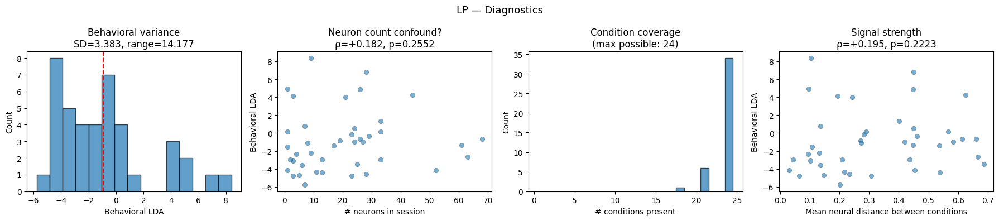


  LP diagnostics:
    Sessions: 41
    Behavioral LDA: mean=-0.913, std=3.383, range=[-5.781, 8.396]
    Neurons per session: median=19, range=[1, 68]
    Conditions per session: median=24, range=[18, 24]


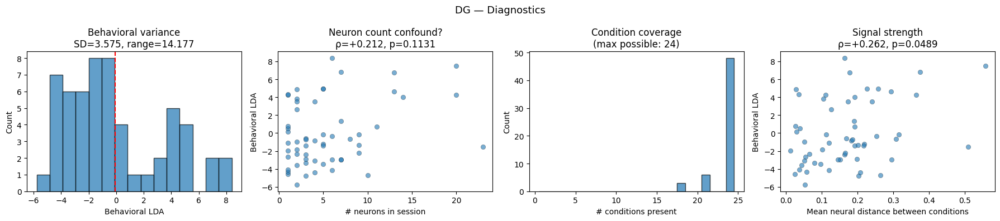


  DG diagnostics:
    Sessions: 57
    Behavioral LDA: mean=-0.094, std=3.575, range=[-5.781, 8.396]
    Neurons per session: median=4, range=[1, 23]
    Conditions per session: median=24, range=[18, 24]


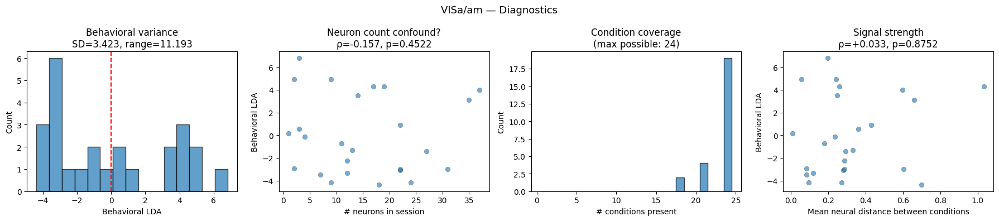


  VISa/am diagnostics:
    Sessions: 25
    Behavioral LDA: mean=0.003, std=3.423, range=[-4.378, 6.815]
    Neurons per session: median=13, range=[1, 37]
    Conditions per session: median=24, range=[18, 24]


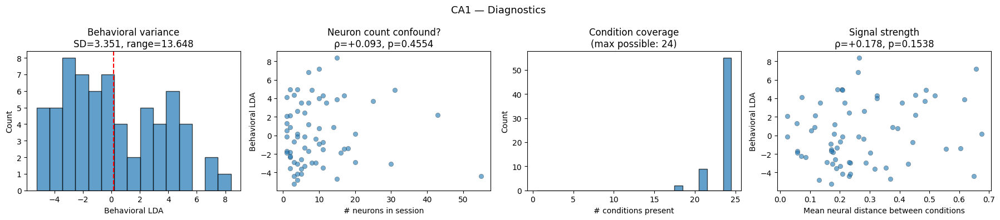


  CA1 diagnostics:
    Sessions: 66
    Behavioral LDA: mean=0.146, std=3.351, range=[-5.252, 8.396]
    Neurons per session: median=6, range=[1, 55]
    Conditions per session: median=24, range=[18, 24]


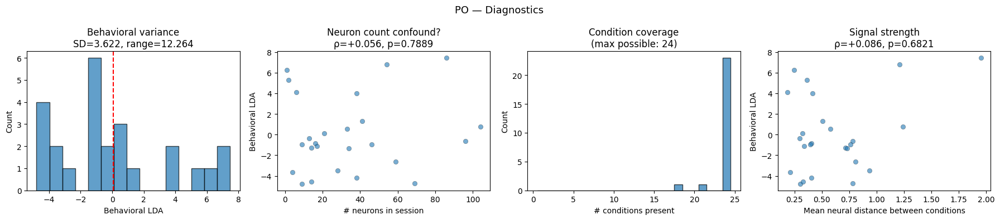


  PO diagnostics:
    Sessions: 25
    Behavioral LDA: mean=0.053, std=3.622, range=[-4.793, 7.471]
    Neurons per session: median=28, range=[1, 104]
    Conditions per session: median=24, range=[18, 24]


In [110]:
# ============================================================
# DIAGNOSTICS: Is the signal recoverable at all?
# ============================================================

for region in regions:
    sessions_data = []
    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]
        if session not in lda_per_session:
            continue
        vecs = np.stack(subset['neuron_vector'].values)
        types = [c.split(' | ')[0] for c in subset['condition_label'].values]
        sessions_data.append(dict(session=session, vecs=vecs, types=types,
                                  lda=lda_per_session[session]))

    if len(sessions_data) < MIN_SESSIONS:
        continue

    lda_arr = np.array([sd['lda'] for sd in sessions_data])
    n_neurons = [sd['vecs'].shape[1] for sd in sessions_data]
    n_conds_per = [sd['vecs'].shape[0] for sd in sessions_data]

    fig, axes = plt.subplots(1, 4, figsize=(18, 4))
    fig.suptitle(f'{region} — Diagnostics', fontsize=13)

    # 1. Behavioral variance: is there enough spread in LDA to predict?
    ax = axes[0]
    ax.hist(lda_arr, bins=15, edgecolor='k', alpha=0.7)
    ax.set_xlabel('Behavioral LDA')
    ax.set_ylabel('Count')
    ax.set_title(f'Behavioral variance\nSD={lda_arr.std():.3f}, range={lda_arr.ptp():.3f}')
    ax.axvline(lda_arr.mean(), color='r', ls='--')

    # 2. Neuron count per session: do low-neuron sessions add noise?
    ax = axes[1]
    ax.scatter(n_neurons, lda_arr, alpha=0.6, edgecolors='k', linewidths=0.3)
    r_nn, p_nn = spearmanr(n_neurons, lda_arr)
    ax.set_xlabel('# neurons in session')
    ax.set_ylabel('Behavioral LDA')
    ax.set_title(f'Neuron count confound?\nρ={r_nn:+.3f}, p={p_nn:.4f}')

    # 3. Condition coverage: how many conditions per session?
    ax = axes[2]
    ax.hist(n_conds_per, bins=range(1, max(n_conds_per) + 2),
            edgecolor='k', alpha=0.7, align='left')
    ax.set_xlabel('# conditions present')
    ax.set_ylabel('Count')
    ax.set_title(f'Condition coverage\n(max possible: {n_conds})')

    # 4. Signal quality: mean cross-condition distance vs noise floor
    #    If distances are tiny relative to noise, RDMs are unreliable
    ax = axes[3]
    mean_dists = []
    for sd in sessions_data:
        if sd['vecs'].shape[0] > 1:
            d = pdist(sd['vecs'], 'euclidean')
            mean_dists.append(np.mean(d))
        else:
            mean_dists.append(np.nan)
    valid = ~np.isnan(mean_dists)
    ax.scatter(np.array(mean_dists)[valid], lda_arr[valid],
               alpha=0.6, edgecolors='k', linewidths=0.3)
    r_md, p_md = spearmanr(np.array(mean_dists)[valid], lda_arr[valid])
    ax.set_xlabel('Mean neural distance between conditions')
    ax.set_ylabel('Behavioral LDA')
    ax.set_title(f'Signal strength\nρ={r_md:+.3f}, p={p_md:.4f}')

    plt.tight_layout()
    plt.show()

    # --- Summary statistics ---
    print(f'\n  {region} diagnostics:')
    print(f'    Sessions: {len(sessions_data)}')
    print(f'    Behavioral LDA: mean={lda_arr.mean():.3f}, '
          f'std={lda_arr.std():.3f}, range=[{lda_arr.min():.3f}, {lda_arr.max():.3f}]')
    print(f'    Neurons per session: median={np.median(n_neurons):.0f}, '
          f'range=[{min(n_neurons)}, {max(n_neurons)}]')
    print(f'    Conditions per session: median={np.median(n_conds_per):.0f}, '
          f'range=[{min(n_conds_per)}, {max(n_conds_per)}]')

In [111]:
from sklearn.decomposition import PCA

def denoise_vectors(neuron_vectors, n_components='auto', var_threshold=0.9):
    """Denoise condition-averaged vectors by retaining only
    the top PCs that capture shared variance across conditions."""
    n_cond, n_neurons = neuron_vectors.shape
    if n_cond < 3:
        return neuron_vectors

    max_comp = min(n_cond - 1, n_neurons)
    pca = PCA(n_components=max_comp)
    pca.fit(neuron_vectors)

    if n_components == 'auto':
        cumvar = np.cumsum(pca.explained_variance_ratio_)
        n_components = np.searchsorted(cumvar, var_threshold) + 1
        n_components = max(2, min(n_components, max_comp))

    return pca.transform(neuron_vectors)[:, :n_components]


# Re-run geometric measures with denoised vectors
for region in regions:
    sessions_data = []
    for pid in pids:
        subset = rsa_df[(rsa_df['region'] == region) & (rsa_df['pid'] == pid)]
        if len(subset) == 0:
            continue
        session = subset['session'].iloc[0]
        if session not in lda_per_session:
            continue

        vecs = np.stack(subset['neuron_vector'].values)
        types = [c.split(' | ')[0] for c in subset['condition_label'].values]
        eps = [c.split(' | ')[1] for c in subset['condition_label'].values]

        # Denoise
        vecs_clean = denoise_vectors(vecs)

        sessions_data.append(dict(
            session=session, vecs=vecs_clean, types=types, epochs=eps,
            lda=lda_per_session[session]
        ))

    if len(sessions_data) < MIN_SESSIONS:
        continue

    lda_arr = np.array([sd['lda'] for sd in sessions_data])

    measure_names = ['participation_ratio', 'parallelism', 'ccgp',
                     'category_margin', 'cka_linear', 'cka_rbf']

    print(f'\n  {region} — DENOISED geometric measures:')
    for m in measure_names:
        vals = np.array([compute_geometric_measures(sd['vecs'], sd['types'],
                         sd['epochs'])[m] for sd in sessions_data])
        valid = ~np.isnan(vals)
        if valid.sum() < MIN_SESSIONS:
            continue
        r, p = spearmanr(vals[valid], lda_arr[valid])
        marker = '  ← *' if p < 0.05 else ''
        print(f'    {m:25s}  ρ = {r:+.3f}  p = {p:.4f}{marker}')


  LP — DENOISED geometric measures:
    participation_ratio        ρ = +0.084  p = 0.6009
    parallelism                ρ = -0.015  p = 0.9238
    ccgp                       ρ = -0.202  p = 0.2045
    category_margin            ρ = -0.136  p = 0.3950
    cka_linear                 ρ = -0.106  p = 0.5080
    cka_rbf                    ρ = -0.156  p = 0.3294

  DG — DENOISED geometric measures:
    participation_ratio        ρ = +0.100  p = 0.4612
    parallelism                ρ = +0.005  p = 0.9683
    ccgp                       ρ = -0.050  p = 0.7145
    category_margin            ρ = -0.171  p = 0.2026
    cka_linear                 ρ = -0.144  p = 0.2849
    cka_rbf                    ρ = -0.110  p = 0.4139

  VISa/am — DENOISED geometric measures:
    participation_ratio        ρ = -0.282  p = 0.1718
    parallelism                ρ = +0.281  p = 0.1736
    ccgp                       ρ = -0.003  p = 0.9876
    category_margin            ρ = -0.022  p = 0.9171
    cka_linear      

In [112]:
def crossval_distance(trial_data, labels, n_splits=5):
    """Cross-validated Euclidean distance: compute mean vectors on
    one half, measure distances on the other. Unbiased estimator."""
    from sklearn.model_selection import StratifiedKFold

    unique_labels = sorted(set(labels))
    labels_arr = np.array(labels)
    n_conds = len(unique_labels)

    dist_accum = np.zeros((n_conds, n_conds))
    counts = 0

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    for train_idx, test_idx in skf.split(trial_data, labels_arr):
        # Compute centroids from train
        centroids_train = np.array([trial_data[train_idx][labels_arr[train_idx] == l].mean(0)
                                     for l in unique_labels])
        # Compute centroids from test
        centroids_test = np.array([trial_data[test_idx][labels_arr[test_idx] == l].mean(0)
                                    for l in unique_labels])

        # Cross distance: train centroids vs test centroids
        for i in range(n_conds):
            for j in range(n_conds):
                dist_accum[i, j] += np.linalg.norm(centroids_train[i] - centroids_test[j])
        counts += 1

    return dist_accum / counts, unique_labels